In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping



In [ ]:
# Load and preprocess the Fashion-MNIST dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()
x_train = x_train.reshape(-1, 28, 28, 1) / 255.0
x_test = x_test.reshape(-1, 28, 28, 1) / 255.0



29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


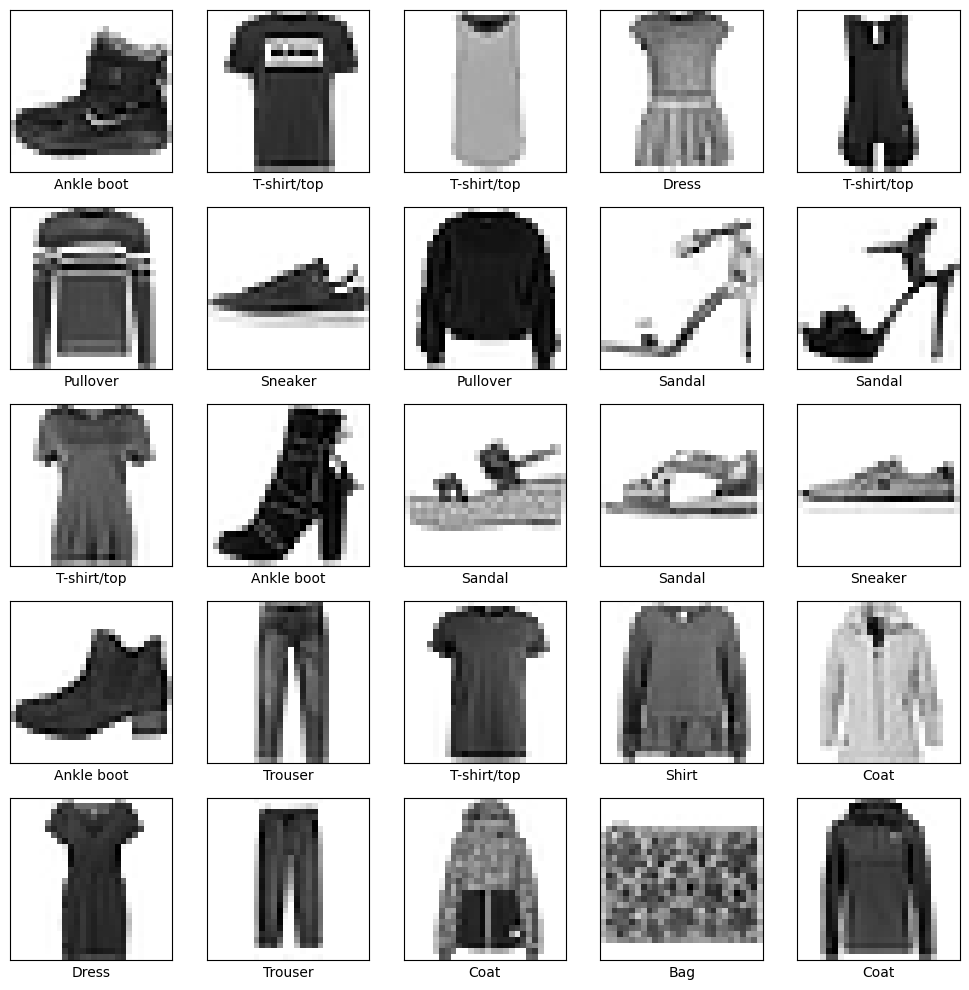

In [ ]:
# Define a mapping of label indices to class names
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# Function to display a grid of images
def display_images(images, labels, num_images=25):
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(5, 5, i + 1)  # Create a 5x5 grid
        plt.xticks([])  # Remove x-axis ticks
        plt.yticks([])  # Remove y-axis ticks
        plt.grid(False) # Remove grid
        plt.imshow(images[i].reshape(28, 28), cmap=plt.cm.binary)  # Reshape and display in grayscale
        plt.xlabel(class_names[labels[i]])  # Display the label
    plt.tight_layout()
    plt.show()

# Display the first 25 images from the training set
display_images(x_train, y_train, num_images=25)

In [ ]:
# Function to plot learning curves
def plot_learning_curves(history, model_name):
    plt.figure(figsize=(12, 6))

    # Accuracy subplot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss subplot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Function to display confusion matrix
def display_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
    disp.plot(cmap='viridis', xticks_rotation='vertical')
    plt.title(f'{model_name} - Confusion Matrix')
    plt.show()

# Base CNN model
def create_model(filters, dense_units, dropout_rate, learning_rate):
    model = Sequential([
        Conv2D(filters, (3, 3), activation='relu', input_shape=(28, 28, 1)),
        MaxPooling2D((2, 2)),
        Conv2D(filters * 2, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(dense_units, activation='relu'),
        Dropout(dropout_rate),
        Dense(10, activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model



Training with filters=32, dense_units=64, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 4ms/step - accuracy: 0.7719 - loss: 0.6175 - val_accuracy: 0.8576 - val_loss: 0.4044
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8568 - loss: 0.3880 - val_accuracy: 0.8539 - val_loss: 0.3900
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8606 - loss: 0.3748 - val_accuracy: 0.8592 - val_loss: 0.3978
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8657 - loss: 0.3590 - val_accuracy: 0.8374 - val_loss: 0.4294
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8671 - loss: 0.3510 - val_accuracy: 0.8591 - val_loss: 0.3881


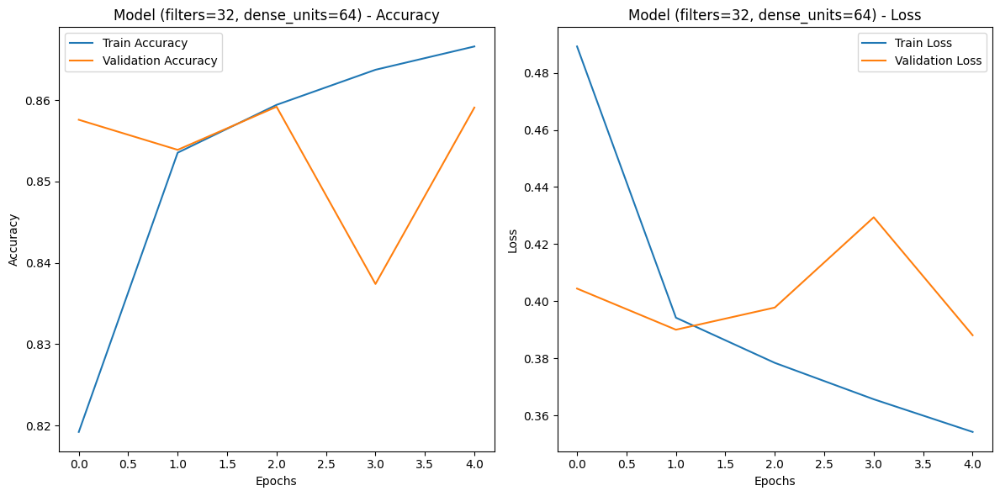

Training with filters=32, dense_units=64, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7890 - loss: 0.5813 - val_accuracy: 0.8688 - val_loss: 0.3744
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8763 - loss: 0.3282 - val_accuracy: 0.8761 - val_loss: 0.3352
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8879 - loss: 0.2946 - val_accuracy: 0.8832 - val_loss: 0.3404
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8974 - loss: 0.2735 - val_accuracy: 0.8802 - val_loss: 0.3288
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9057 - loss: 0.2530 - val_accuracy: 0.8924 - val_loss: 0.3209


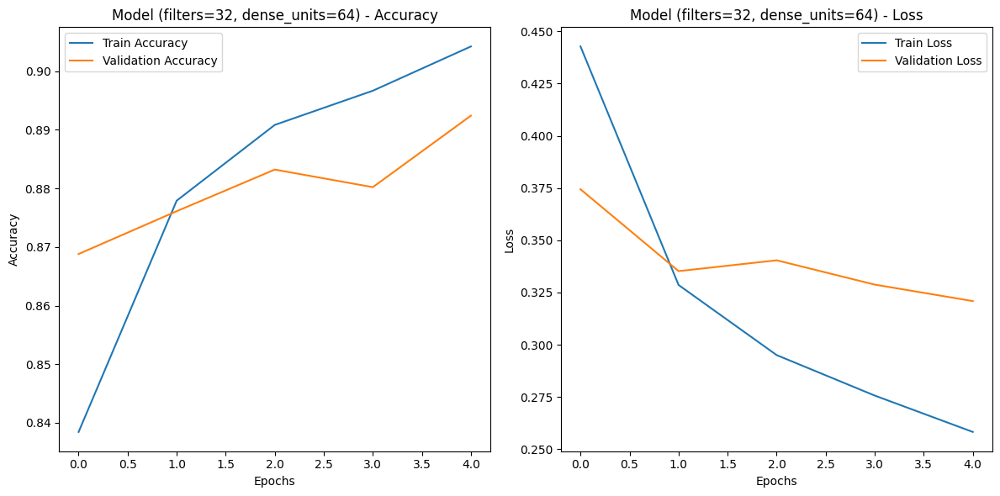

Training with filters=32, dense_units=64, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7611 - loss: 0.6725 - val_accuracy: 0.8755 - val_loss: 0.3517
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8777 - loss: 0.3339 - val_accuracy: 0.8746 - val_loss: 0.3303
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8972 - loss: 0.2783 - val_accuracy: 0.8989 - val_loss: 0.2801
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.9075 - loss: 0.2488 - val_accuracy: 0.9010 - val_loss: 0.2835
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9180 - loss: 0.2210 - val_accuracy: 0.9035 - val_loss: 0.2585


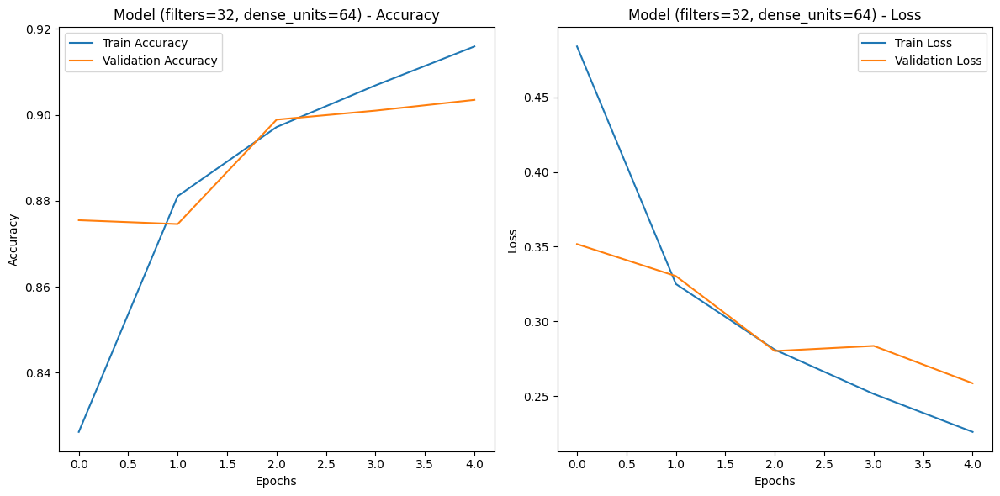

Training with filters=32, dense_units=64, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.6131 - loss: 1.1531 - val_accuracy: 0.7981 - val_loss: 0.5371
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8123 - loss: 0.5126 - val_accuracy: 0.8414 - val_loss: 0.4520
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8377 - loss: 0.4495 - val_accuracy: 0.8551 - val_loss: 0.4107
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8584 - loss: 0.4000 - val_accuracy: 0.8610 - val_loss: 0.3917
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8639 - loss: 0.3856 - val_accuracy: 0.8600 - val_loss: 0.3859


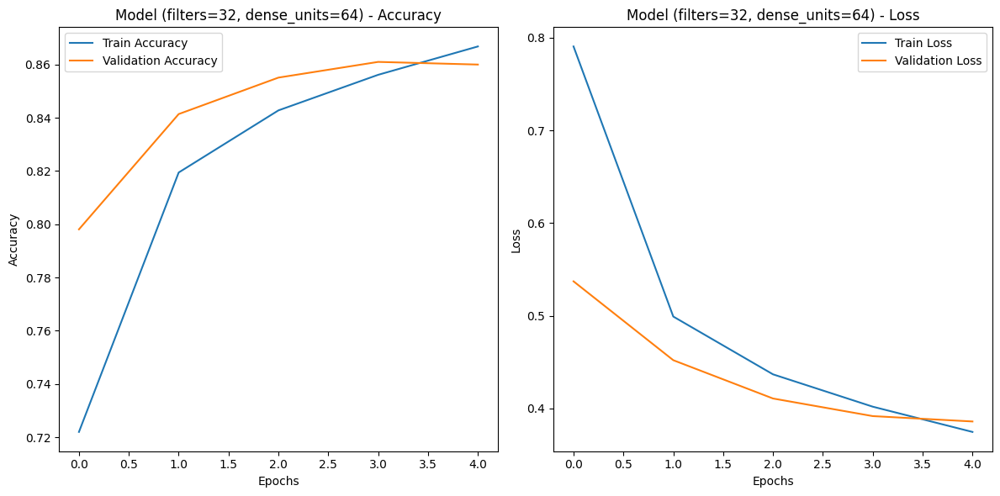

Training with filters=32, dense_units=64, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7345 - loss: 0.7012 - val_accuracy: 0.8428 - val_loss: 0.4265
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8287 - loss: 0.4636 - val_accuracy: 0.8407 - val_loss: 0.4363
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8367 - loss: 0.4458 - val_accuracy: 0.8515 - val_loss: 0.3997
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8438 - loss: 0.4173 - val_accuracy: 0.8548 - val_loss: 0.3914
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8474 - loss: 0.4147 - val_accuracy: 0.8567 - val_loss: 0.4105


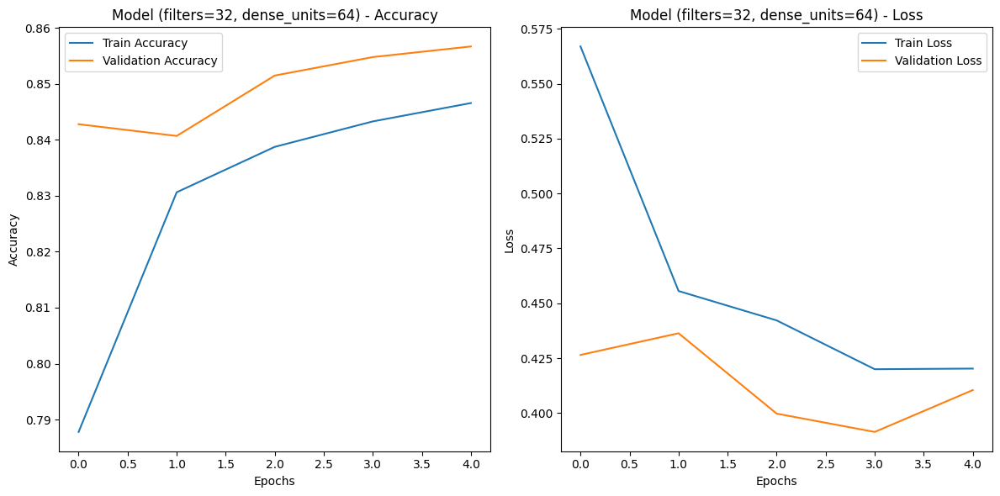

Training with filters=32, dense_units=64, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7116 - loss: 0.7676 - val_accuracy: 0.8472 - val_loss: 0.4089
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8351 - loss: 0.4454 - val_accuracy: 0.8491 - val_loss: 0.3819
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8513 - loss: 0.3920 - val_accuracy: 0.8712 - val_loss: 0.3465
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8612 - loss: 0.3701 - val_accuracy: 0.8782 - val_loss: 0.3412
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8697 - loss: 0.3433 - val_accuracy: 0.8775 - val_loss: 0.3350


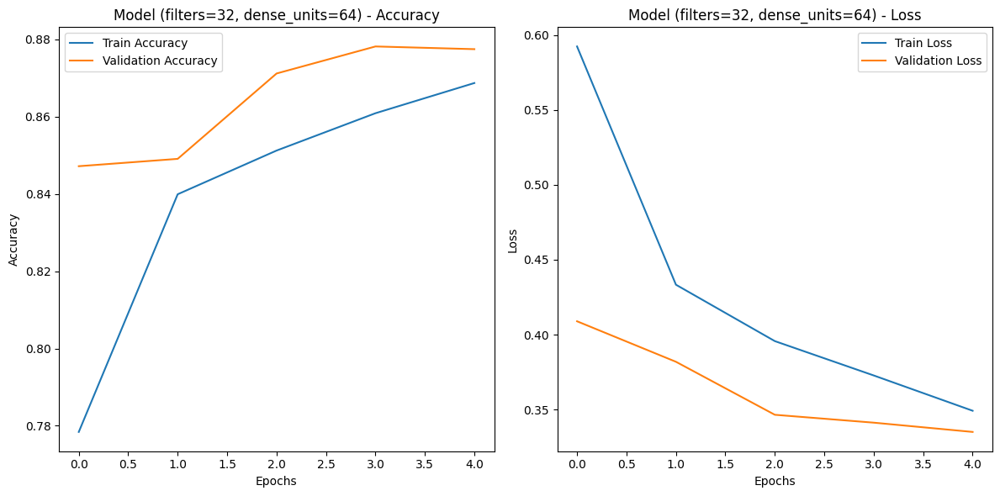

Training with filters=32, dense_units=64, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7233 - loss: 0.7762 - val_accuracy: 0.8689 - val_loss: 0.3604
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8634 - loss: 0.3814 - val_accuracy: 0.8734 - val_loss: 0.3348
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8807 - loss: 0.3254 - val_accuracy: 0.8973 - val_loss: 0.2836
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8938 - loss: 0.2930 - val_accuracy: 0.8987 - val_loss: 0.2723
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9035 - loss: 0.2630 - val_accuracy: 0.9032 - val_loss: 0.2590


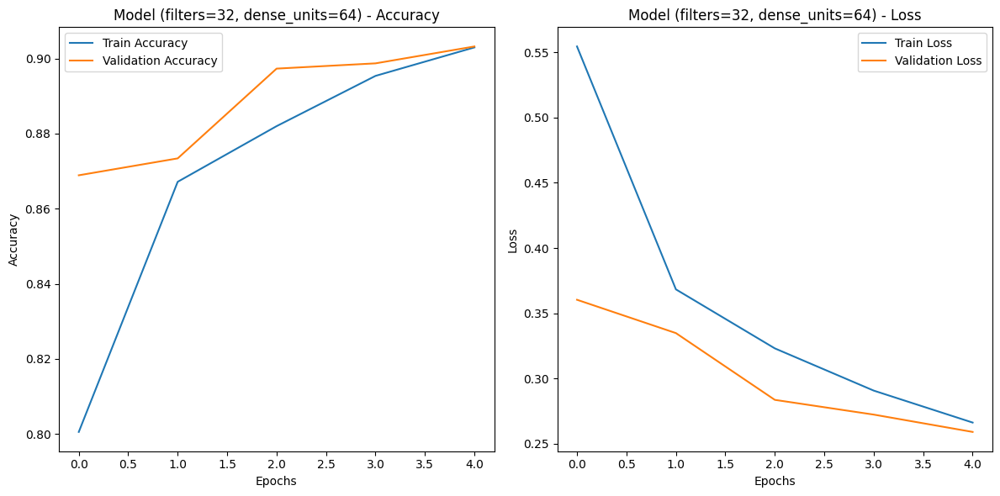

Training with filters=32, dense_units=64, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.5789 - loss: 1.2031 - val_accuracy: 0.7952 - val_loss: 0.5546
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7861 - loss: 0.5838 - val_accuracy: 0.8305 - val_loss: 0.4725
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8168 - loss: 0.5110 - val_accuracy: 0.8412 - val_loss: 0.4426
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8335 - loss: 0.4639 - val_accuracy: 0.8532 - val_loss: 0.4078
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8446 - loss: 0.4325 - val_accuracy: 0.8604 - val_loss: 0.3908


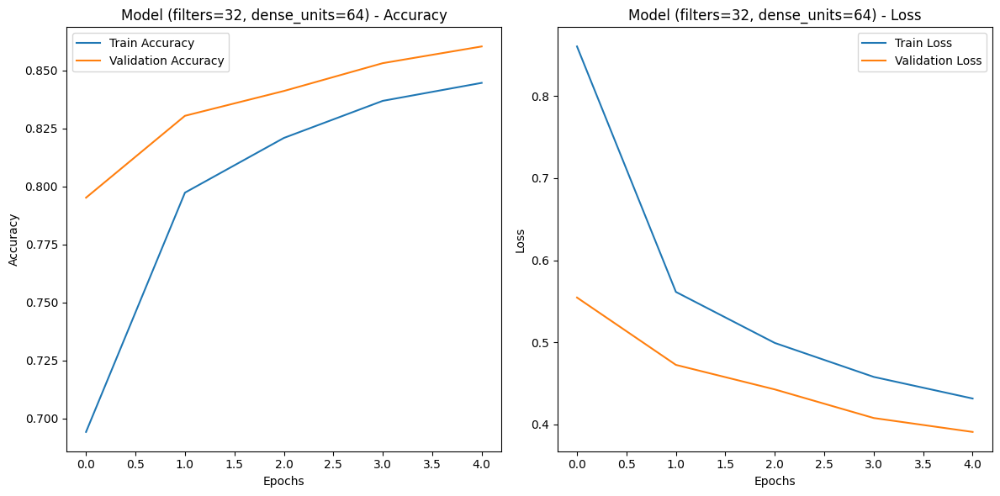

Training with filters=32, dense_units=64, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7194 - loss: 0.7629 - val_accuracy: 0.8209 - val_loss: 0.4575
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8064 - loss: 0.5200 - val_accuracy: 0.8405 - val_loss: 0.4249
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8169 - loss: 0.4951 - val_accuracy: 0.8523 - val_loss: 0.3844
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8226 - loss: 0.4787 - val_accuracy: 0.8512 - val_loss: 0.4124
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8231 - loss: 0.4746 - val_accuracy: 0.8542 - val_loss: 0.3976


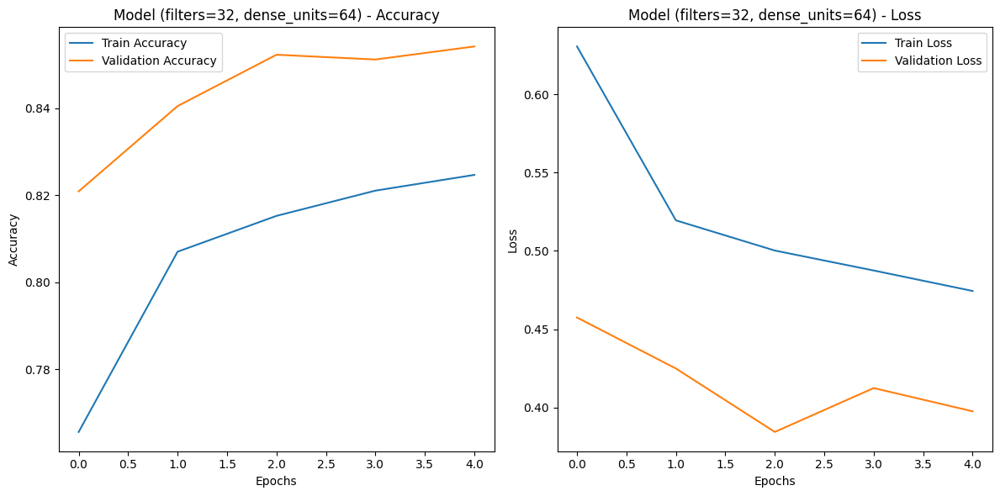

Training with filters=32, dense_units=64, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7254 - loss: 0.7605 - val_accuracy: 0.8490 - val_loss: 0.4019
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8378 - loss: 0.4483 - val_accuracy: 0.8677 - val_loss: 0.3676
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8486 - loss: 0.4106 - val_accuracy: 0.8693 - val_loss: 0.3499
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8581 - loss: 0.3859 - val_accuracy: 0.8797 - val_loss: 0.3500
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8591 - loss: 0.3812 - val_accuracy: 0.8771 - val_loss: 0.3523


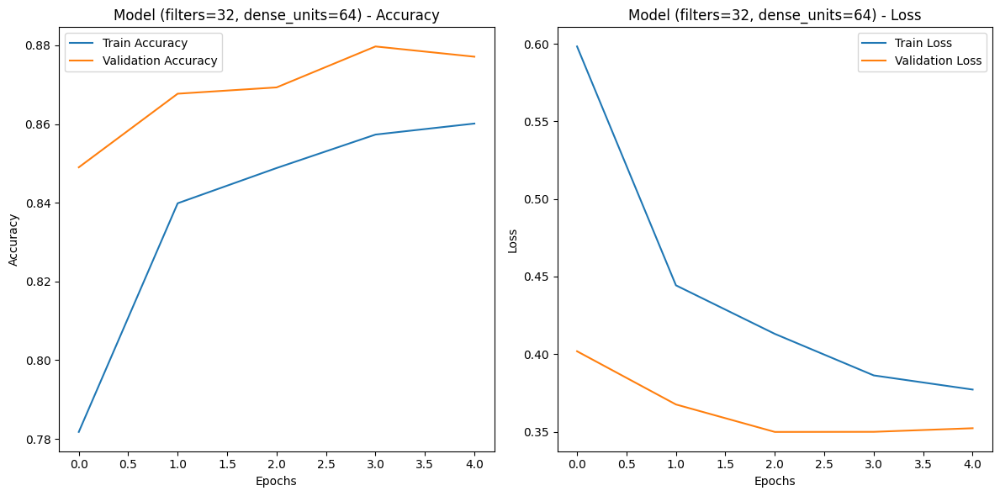

Training with filters=32, dense_units=64, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.6899 - loss: 0.8627 - val_accuracy: 0.8535 - val_loss: 0.4021
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8357 - loss: 0.4522 - val_accuracy: 0.8809 - val_loss: 0.3378
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8622 - loss: 0.3844 - val_accuracy: 0.8869 - val_loss: 0.3141
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8740 - loss: 0.3537 - val_accuracy: 0.8930 - val_loss: 0.2925
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8820 - loss: 0.3228 - val_accuracy: 0.8982 - val_loss: 0.2774


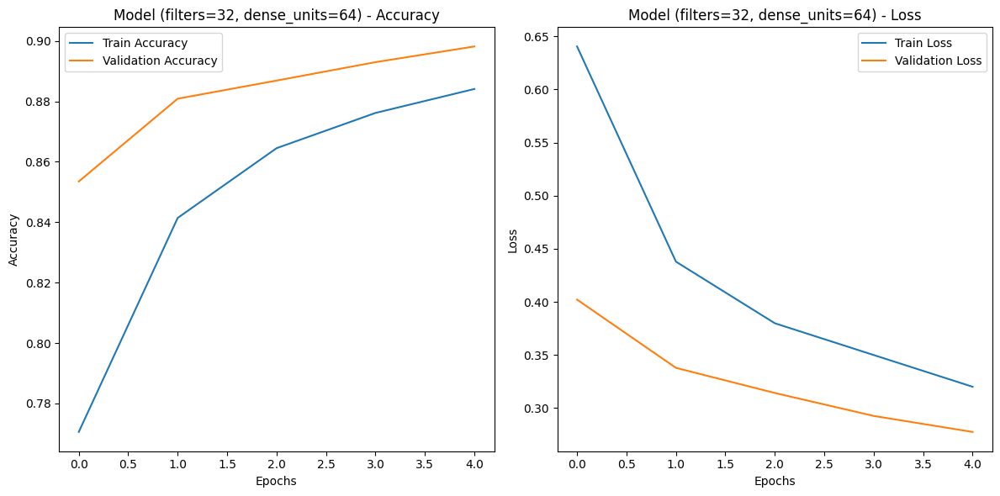

Training with filters=32, dense_units=64, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.5473 - loss: 1.2941 - val_accuracy: 0.7886 - val_loss: 0.5726
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.7628 - loss: 0.6542 - val_accuracy: 0.8147 - val_loss: 0.5010
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8006 - loss: 0.5593 - val_accuracy: 0.8357 - val_loss: 0.4482
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8207 - loss: 0.5130 - val_accuracy: 0.8416 - val_loss: 0.4290
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8280 - loss: 0.4825 - val_accuracy: 0.8520 - val_loss: 0.4020


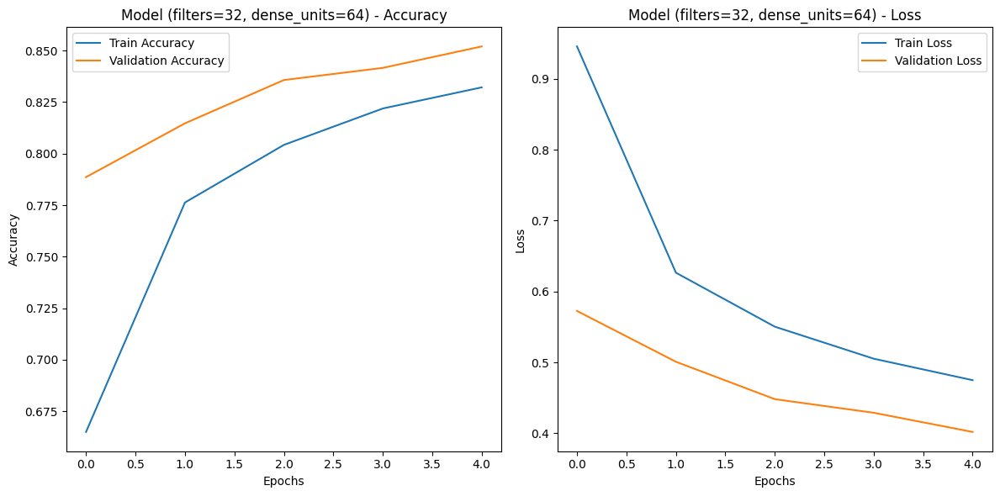

Training with filters=32, dense_units=128, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7610 - loss: 0.6730 - val_accuracy: 0.8433 - val_loss: 0.4143
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8510 - loss: 0.3996 - val_accuracy: 0.8402 - val_loss: 0.4353
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8599 - loss: 0.3734 - val_accuracy: 0.8558 - val_loss: 0.3894
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8631 - loss: 0.3663 - val_accuracy: 0.8608 - val_loss: 0.3865
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.8693 - loss: 0.3498 - val_accuracy: 0.8603 - val_loss: 0.3828


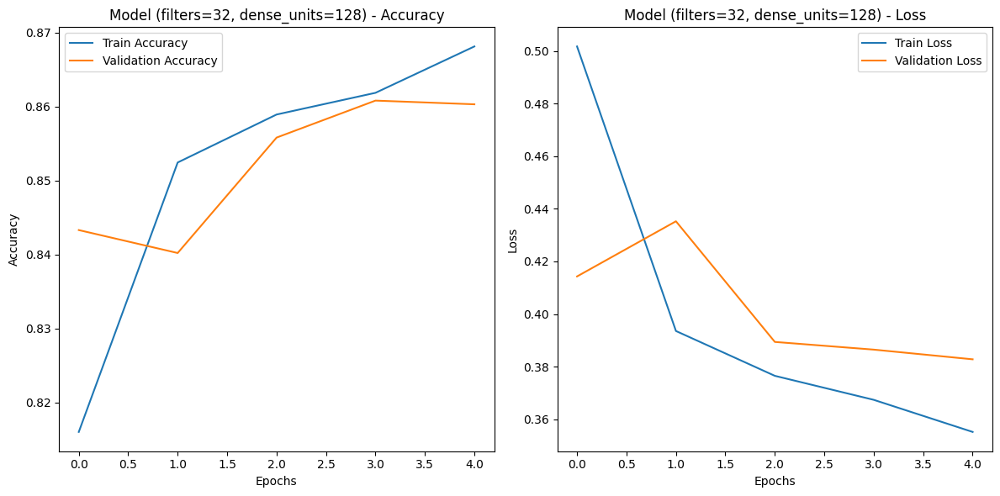

Training with filters=32, dense_units=128, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7977 - loss: 0.5603 - val_accuracy: 0.8738 - val_loss: 0.3522
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8799 - loss: 0.3217 - val_accuracy: 0.8893 - val_loss: 0.3093
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8916 - loss: 0.2887 - val_accuracy: 0.8828 - val_loss: 0.3172
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9019 - loss: 0.2626 - val_accuracy: 0.8920 - val_loss: 0.3022
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9077 - loss: 0.2473 - val_accuracy: 0.8863 - val_loss: 0.3272


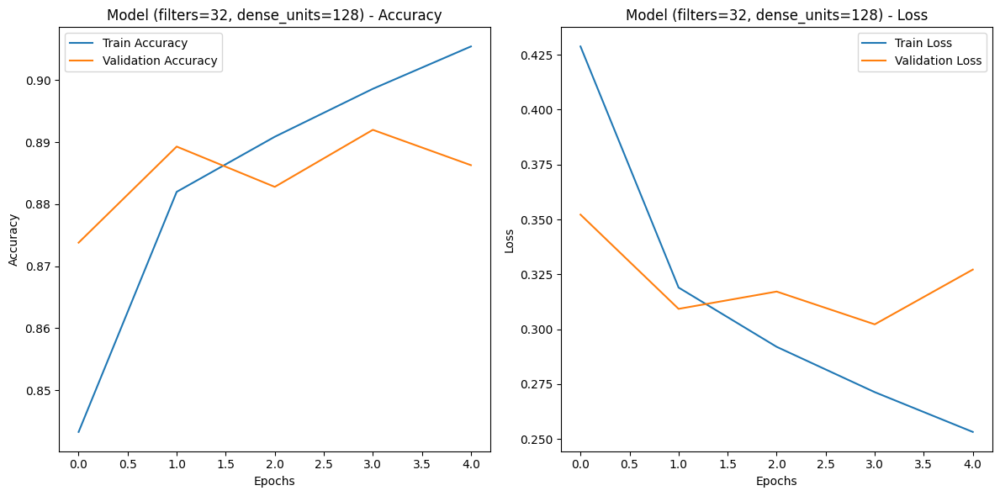

Training with filters=32, dense_units=128, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7680 - loss: 0.6482 - val_accuracy: 0.8672 - val_loss: 0.3571
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8841 - loss: 0.3187 - val_accuracy: 0.8953 - val_loss: 0.2912
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9032 - loss: 0.2615 - val_accuracy: 0.9010 - val_loss: 0.2674
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - accuracy: 0.9144 - loss: 0.2331 - val_accuracy: 0.9051 - val_loss: 0.2575
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9214 - loss: 0.2075 - val_accuracy: 0.9057 - val_loss: 0.2580


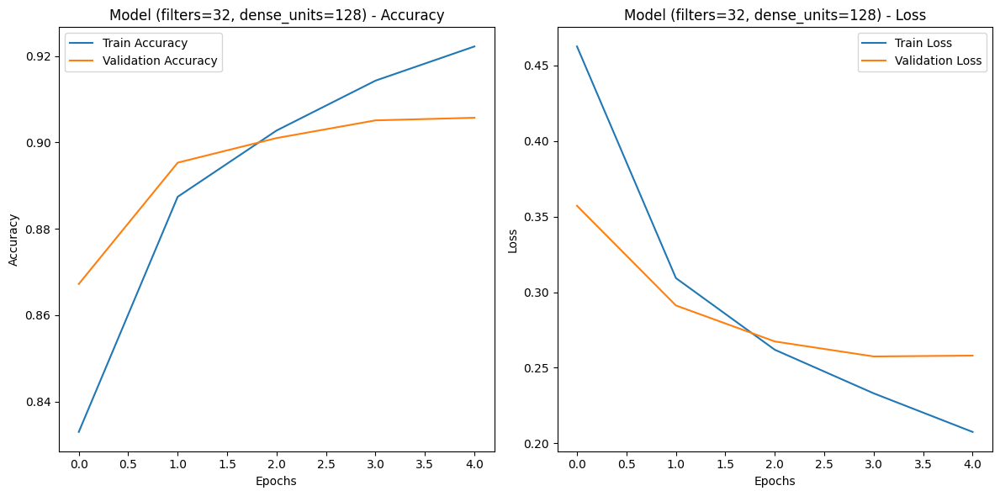

Training with filters=32, dense_units=128, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.6579 - loss: 1.0523 - val_accuracy: 0.8031 - val_loss: 0.5168
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8160 - loss: 0.4984 - val_accuracy: 0.8407 - val_loss: 0.4464
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8482 - loss: 0.4274 - val_accuracy: 0.8499 - val_loss: 0.4188
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8620 - loss: 0.3913 - val_accuracy: 0.8599 - val_loss: 0.3879
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8658 - loss: 0.3719 - val_accuracy: 0.8664 - val_loss: 0.3677


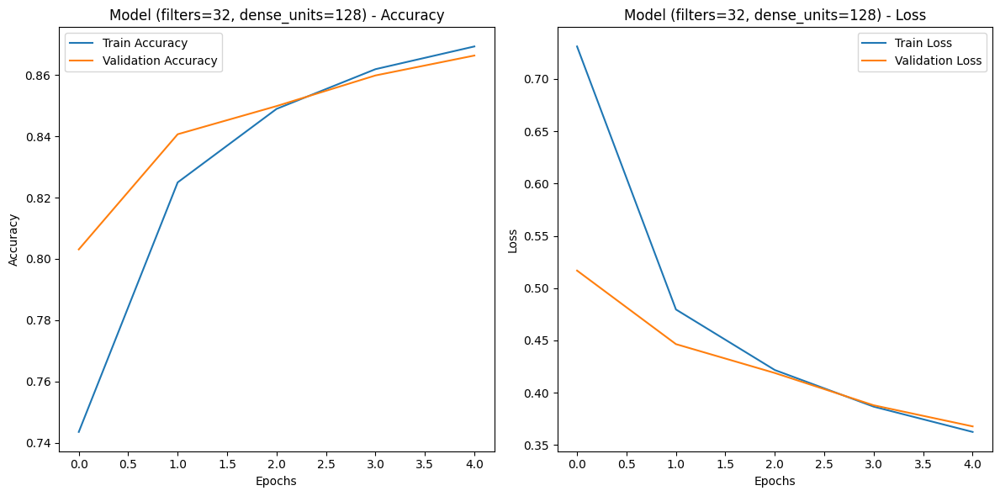

Training with filters=32, dense_units=128, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7685 - loss: 0.6235 - val_accuracy: 0.8548 - val_loss: 0.3940
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8464 - loss: 0.4145 - val_accuracy: 0.8531 - val_loss: 0.4011
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8539 - loss: 0.3961 - val_accuracy: 0.8541 - val_loss: 0.4085
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8529 - loss: 0.3941 - val_accuracy: 0.8472 - val_loss: 0.4188
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8596 - loss: 0.3798 - val_accuracy: 0.8620 - val_loss: 0.3696


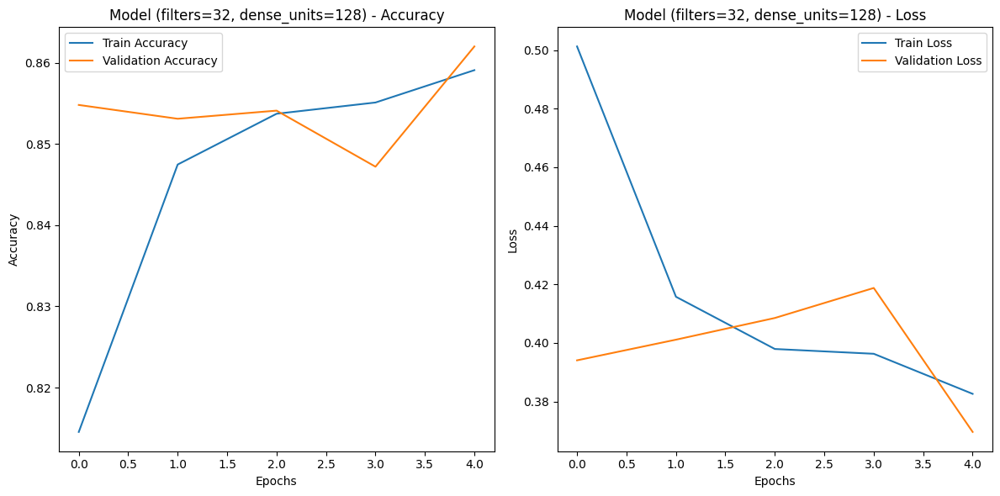

Training with filters=32, dense_units=128, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7706 - loss: 0.6278 - val_accuracy: 0.8642 - val_loss: 0.3620
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8628 - loss: 0.3646 - val_accuracy: 0.8724 - val_loss: 0.3555
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8751 - loss: 0.3366 - val_accuracy: 0.8774 - val_loss: 0.3375
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8829 - loss: 0.3155 - val_accuracy: 0.8801 - val_loss: 0.3420
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8855 - loss: 0.3056 - val_accuracy: 0.8840 - val_loss: 0.3252


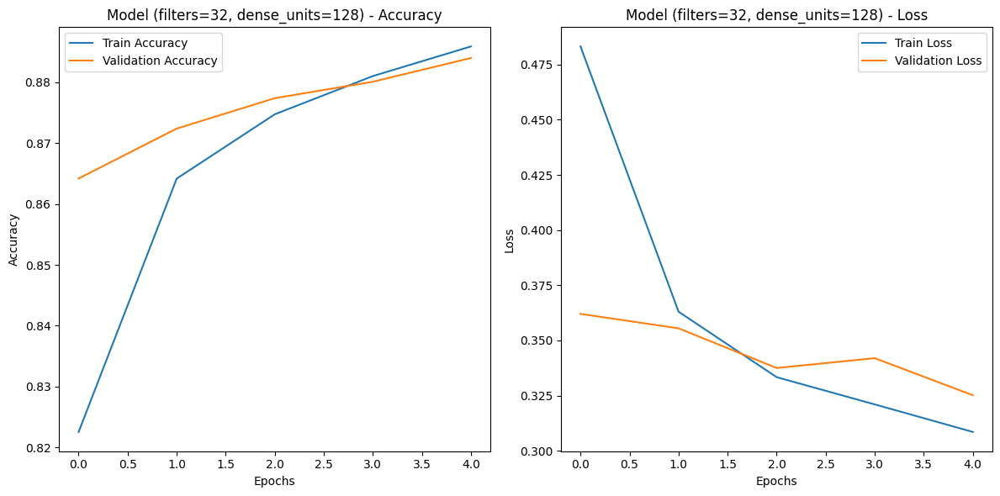

Training with filters=32, dense_units=128, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7531 - loss: 0.6823 - val_accuracy: 0.8664 - val_loss: 0.3608
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8753 - loss: 0.3469 - val_accuracy: 0.8815 - val_loss: 0.3313
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8942 - loss: 0.2892 - val_accuracy: 0.8923 - val_loss: 0.2974
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.9061 - loss: 0.2525 - val_accuracy: 0.9057 - val_loss: 0.2634
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9137 - loss: 0.2332 - val_accuracy: 0.9011 - val_loss: 0.2676


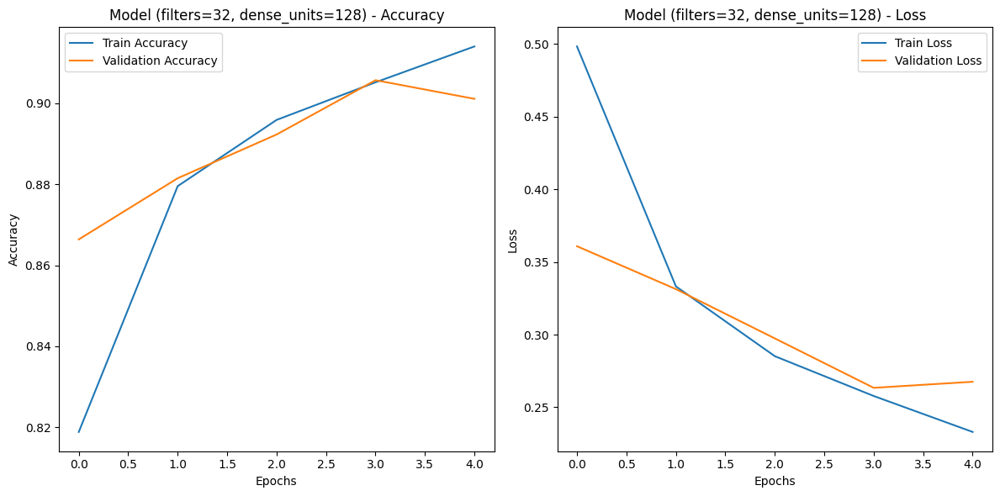

Training with filters=32, dense_units=128, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.6297 - loss: 1.0914 - val_accuracy: 0.8071 - val_loss: 0.5164
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8152 - loss: 0.5114 - val_accuracy: 0.8465 - val_loss: 0.4310
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8464 - loss: 0.4299 - val_accuracy: 0.8536 - val_loss: 0.3970
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8571 - loss: 0.3996 - val_accuracy: 0.8674 - val_loss: 0.3698
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8687 - loss: 0.3689 - val_accuracy: 0.8694 - val_loss: 0.3576


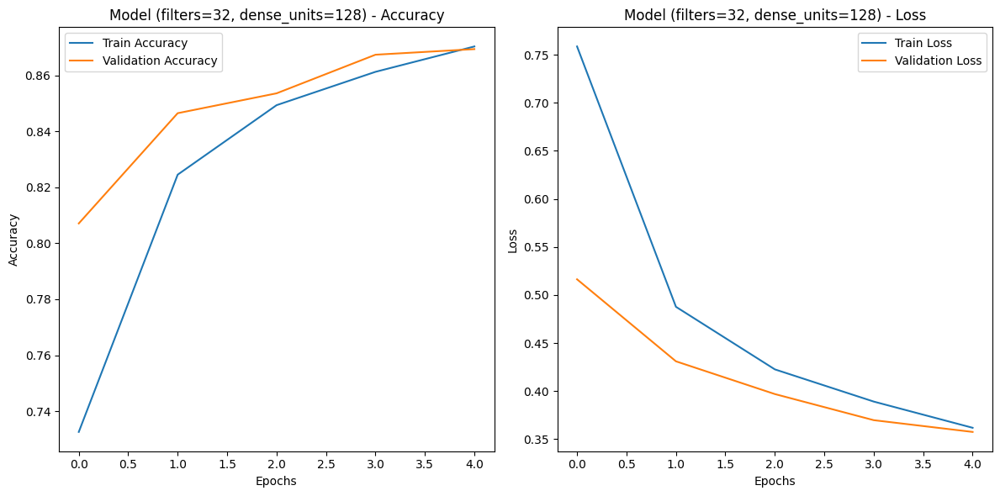

Training with filters=32, dense_units=128, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7379 - loss: 0.7159 - val_accuracy: 0.8222 - val_loss: 0.4741
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8212 - loss: 0.4834 - val_accuracy: 0.8362 - val_loss: 0.4198
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8291 - loss: 0.4595 - val_accuracy: 0.8407 - val_loss: 0.4219
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8337 - loss: 0.4583 - val_accuracy: 0.8468 - val_loss: 0.4293
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8359 - loss: 0.4418 - val_accuracy: 0.8411 - val_loss: 0.4310


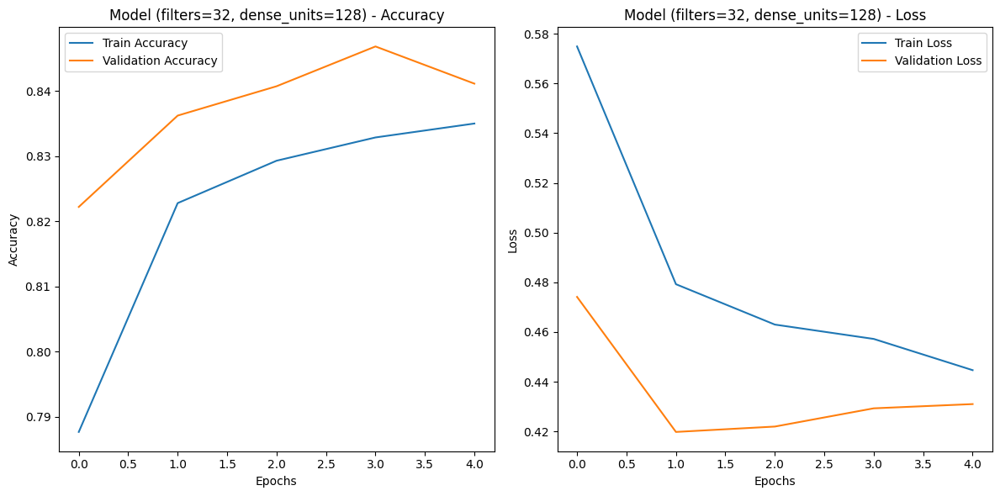

Training with filters=32, dense_units=128, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7486 - loss: 0.6797 - val_accuracy: 0.8501 - val_loss: 0.4028
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8522 - loss: 0.3999 - val_accuracy: 0.8746 - val_loss: 0.3521
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8663 - loss: 0.3640 - val_accuracy: 0.8684 - val_loss: 0.3553
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.8684 - loss: 0.3490 - val_accuracy: 0.8752 - val_loss: 0.3408
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8738 - loss: 0.3446 - val_accuracy: 0.8837 - val_loss: 0.3299


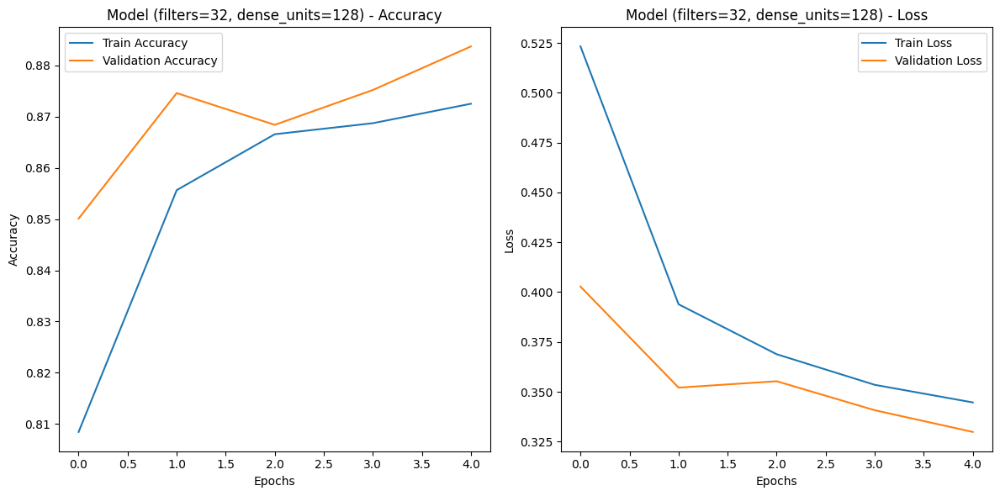

Training with filters=32, dense_units=128, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7254 - loss: 0.7557 - val_accuracy: 0.8647 - val_loss: 0.3649
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8581 - loss: 0.3933 - val_accuracy: 0.8796 - val_loss: 0.3251
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8810 - loss: 0.3300 - val_accuracy: 0.8920 - val_loss: 0.2863
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8914 - loss: 0.2988 - val_accuracy: 0.8979 - val_loss: 0.2689
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.9020 - loss: 0.2729 - val_accuracy: 0.8999 - val_loss: 0.2687


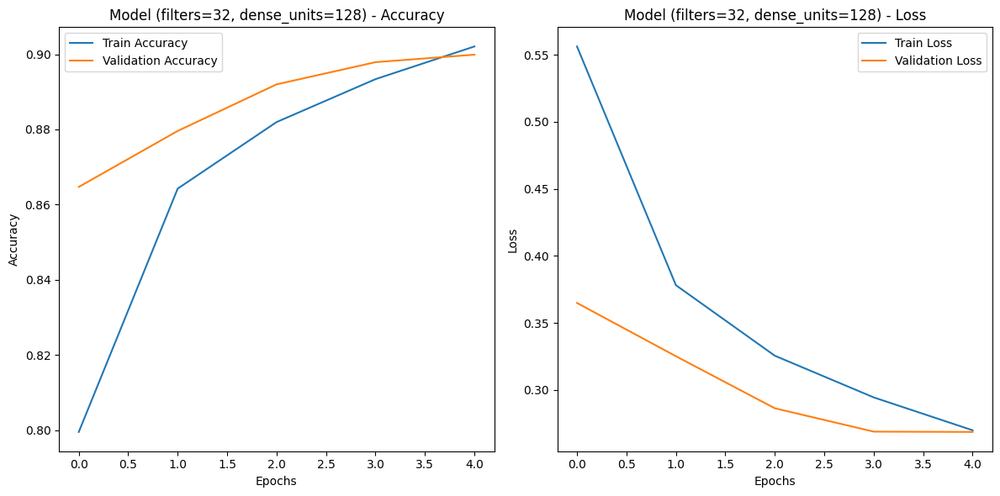

Training with filters=32, dense_units=128, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.5804 - loss: 1.2192 - val_accuracy: 0.7958 - val_loss: 0.5438
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.7825 - loss: 0.5867 - val_accuracy: 0.8205 - val_loss: 0.4774
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8150 - loss: 0.5085 - val_accuracy: 0.8400 - val_loss: 0.4377
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8344 - loss: 0.4598 - val_accuracy: 0.8465 - val_loss: 0.4210
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8437 - loss: 0.4377 - val_accuracy: 0.8605 - val_loss: 0.3888


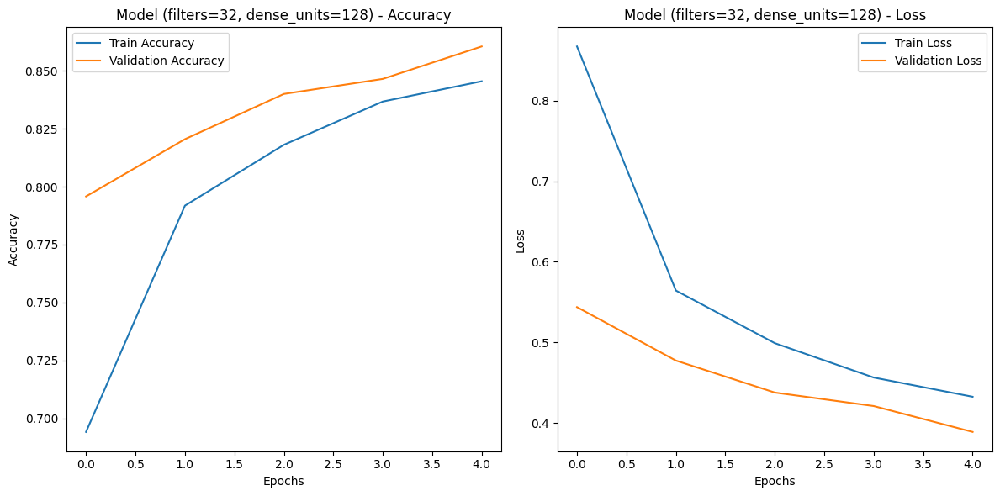

Training with filters=32, dense_units=256, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7807 - loss: 0.5954 - val_accuracy: 0.8458 - val_loss: 0.4167
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8583 - loss: 0.3785 - val_accuracy: 0.8563 - val_loss: 0.4028
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8689 - loss: 0.3558 - val_accuracy: 0.8504 - val_loss: 0.4772
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8736 - loss: 0.3421 - val_accuracy: 0.8625 - val_loss: 0.3887
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8757 - loss: 0.3294 - val_accuracy: 0.8644 - val_loss: 0.3942


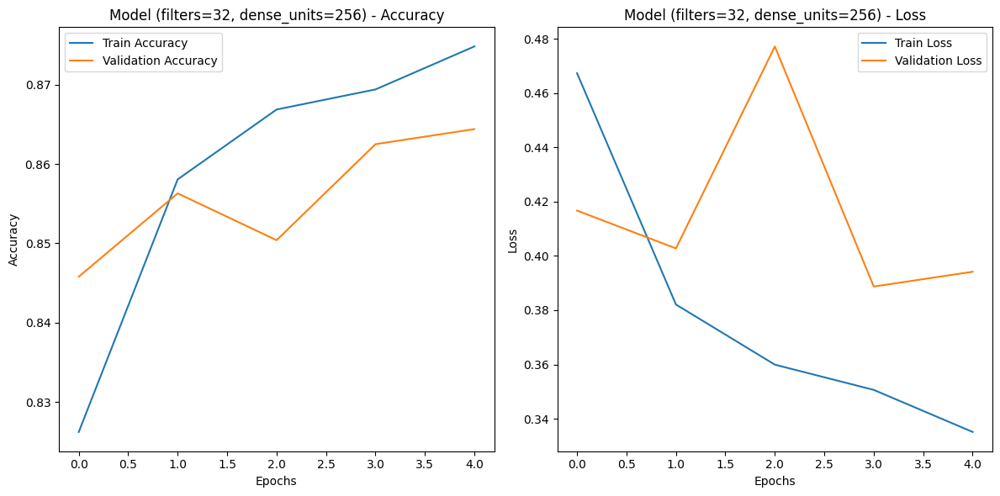

Training with filters=32, dense_units=256, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8012 - loss: 0.5427 - val_accuracy: 0.8685 - val_loss: 0.3690
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8805 - loss: 0.3233 - val_accuracy: 0.8756 - val_loss: 0.3593
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8902 - loss: 0.2905 - val_accuracy: 0.8783 - val_loss: 0.3285
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8954 - loss: 0.2747 - val_accuracy: 0.8815 - val_loss: 0.3411
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9048 - loss: 0.2542 - val_accuracy: 0.8871 - val_loss: 0.3362


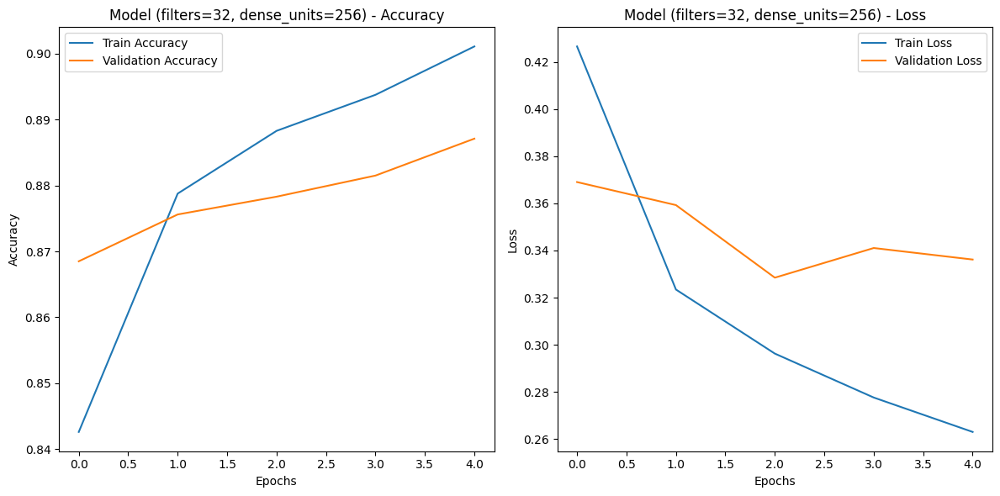

Training with filters=32, dense_units=256, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7862 - loss: 0.5973 - val_accuracy: 0.8754 - val_loss: 0.3407
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8911 - loss: 0.2972 - val_accuracy: 0.8899 - val_loss: 0.2994
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.9072 - loss: 0.2509 - val_accuracy: 0.9035 - val_loss: 0.2632
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.9195 - loss: 0.2152 - val_accuracy: 0.9066 - val_loss: 0.2591
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9293 - loss: 0.1884 - val_accuracy: 0.9103 - val_loss: 0.2465


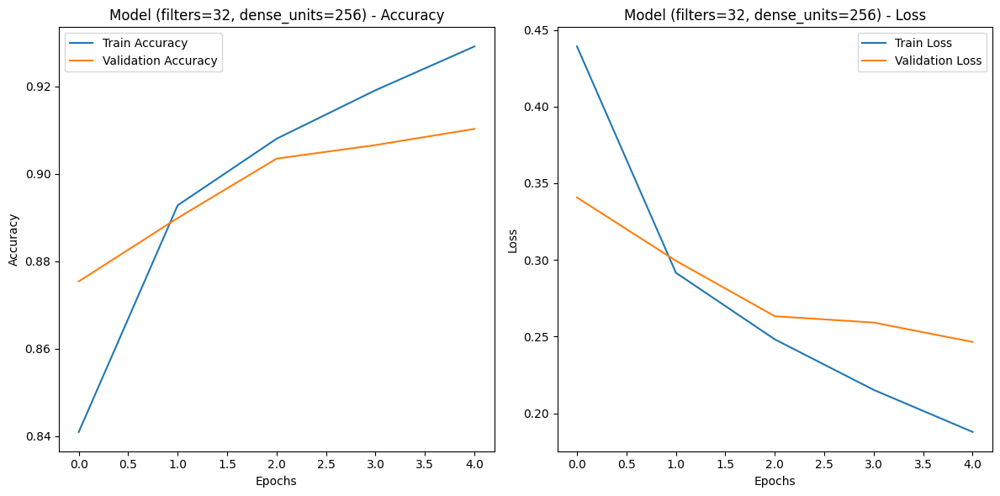

Training with filters=32, dense_units=256, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.6899 - loss: 0.9488 - val_accuracy: 0.8232 - val_loss: 0.4845
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8361 - loss: 0.4548 - val_accuracy: 0.8474 - val_loss: 0.4278
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8547 - loss: 0.4006 - val_accuracy: 0.8486 - val_loss: 0.4024
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8683 - loss: 0.3640 - val_accuracy: 0.8664 - val_loss: 0.3696
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8785 - loss: 0.3374 - val_accuracy: 0.8762 - val_loss: 0.3433


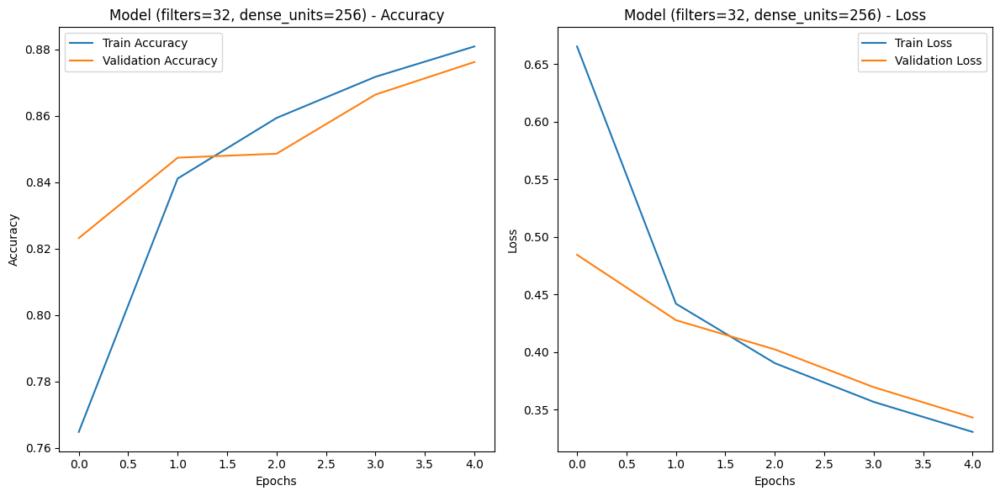

Training with filters=32, dense_units=256, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7685 - loss: 0.6265 - val_accuracy: 0.8498 - val_loss: 0.4005
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8479 - loss: 0.4088 - val_accuracy: 0.8523 - val_loss: 0.3953
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8523 - loss: 0.3940 - val_accuracy: 0.8563 - val_loss: 0.4123
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8542 - loss: 0.3965 - val_accuracy: 0.8513 - val_loss: 0.4174
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8612 - loss: 0.3809 - val_accuracy: 0.8559 - val_loss: 0.4111


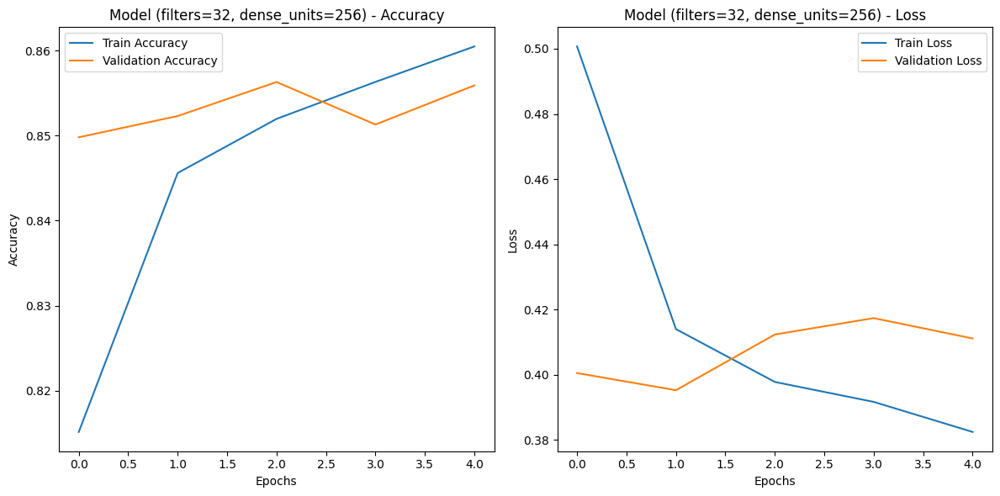

Training with filters=32, dense_units=256, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7975 - loss: 0.5579 - val_accuracy: 0.8713 - val_loss: 0.3573
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8754 - loss: 0.3297 - val_accuracy: 0.8687 - val_loss: 0.3473
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8849 - loss: 0.3069 - val_accuracy: 0.8809 - val_loss: 0.3328
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8894 - loss: 0.2921 - val_accuracy: 0.8839 - val_loss: 0.3262
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8915 - loss: 0.2837 - val_accuracy: 0.8881 - val_loss: 0.3263


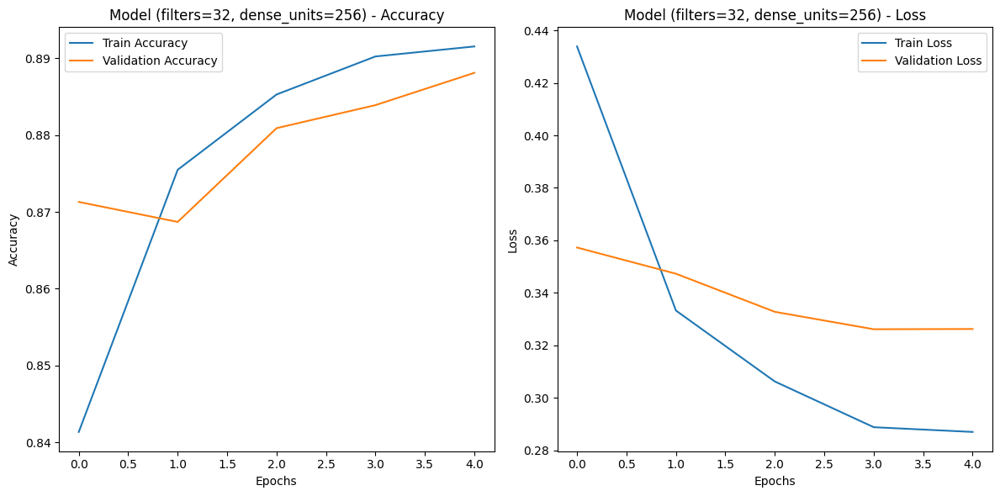

Training with filters=32, dense_units=256, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7684 - loss: 0.6399 - val_accuracy: 0.8769 - val_loss: 0.3394
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8823 - loss: 0.3135 - val_accuracy: 0.8912 - val_loss: 0.3029
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9002 - loss: 0.2683 - val_accuracy: 0.8976 - val_loss: 0.2718
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9118 - loss: 0.2329 - val_accuracy: 0.9009 - val_loss: 0.2655
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9218 - loss: 0.2081 - val_accuracy: 0.9070 - val_loss: 0.2529


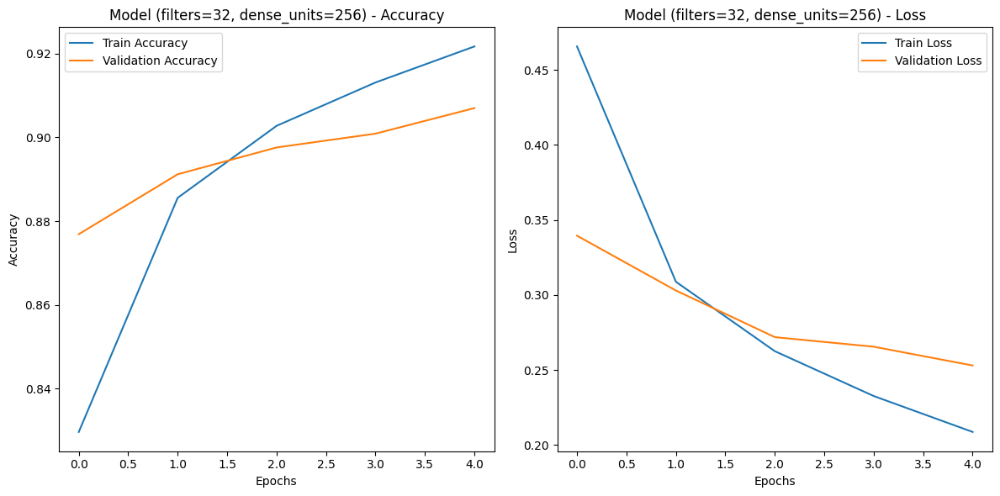

Training with filters=32, dense_units=256, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.6644 - loss: 1.0134 - val_accuracy: 0.8141 - val_loss: 0.4965
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8256 - loss: 0.4745 - val_accuracy: 0.8502 - val_loss: 0.4203
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8545 - loss: 0.4066 - val_accuracy: 0.8632 - val_loss: 0.3800
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8672 - loss: 0.3691 - val_accuracy: 0.8677 - val_loss: 0.3616
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8738 - loss: 0.3494 - val_accuracy: 0.8723 - val_loss: 0.3421


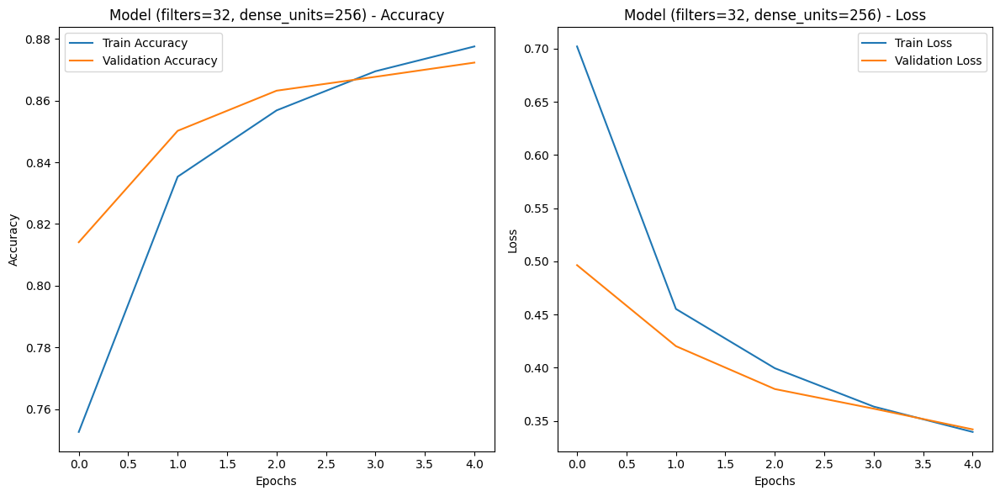

Training with filters=32, dense_units=256, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7558 - loss: 0.6686 - val_accuracy: 0.8356 - val_loss: 0.4297
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8289 - loss: 0.4678 - val_accuracy: 0.8374 - val_loss: 0.4381
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8351 - loss: 0.4510 - val_accuracy: 0.8513 - val_loss: 0.3994
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8371 - loss: 0.4393 - val_accuracy: 0.8415 - val_loss: 0.4219
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8401 - loss: 0.4318 - val_accuracy: 0.8450 - val_loss: 0.4290


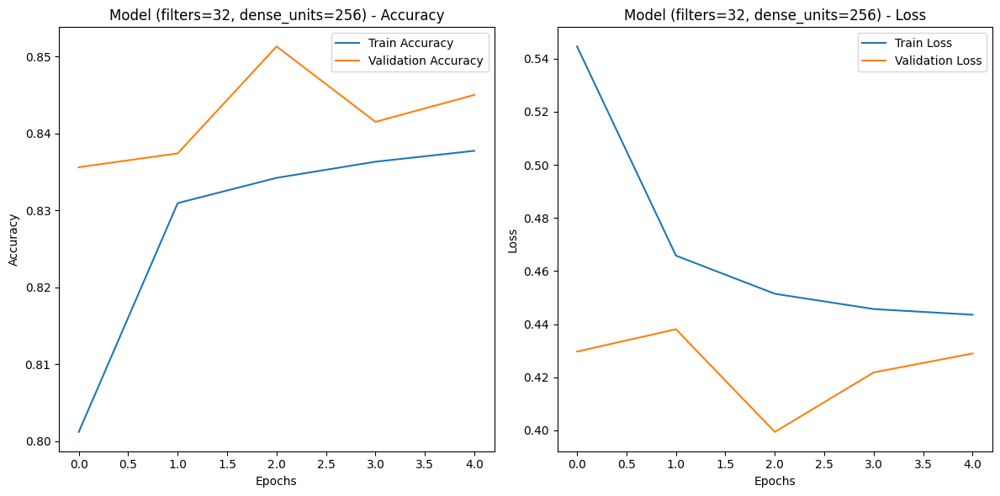

Training with filters=32, dense_units=256, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.7727 - loss: 0.6242 - val_accuracy: 0.8620 - val_loss: 0.3624
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8615 - loss: 0.3763 - val_accuracy: 0.8735 - val_loss: 0.3321
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8683 - loss: 0.3520 - val_accuracy: 0.8779 - val_loss: 0.3400
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8746 - loss: 0.3347 - val_accuracy: 0.8791 - val_loss: 0.3377
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8805 - loss: 0.3221 - val_accuracy: 0.8838 - val_loss: 0.3384


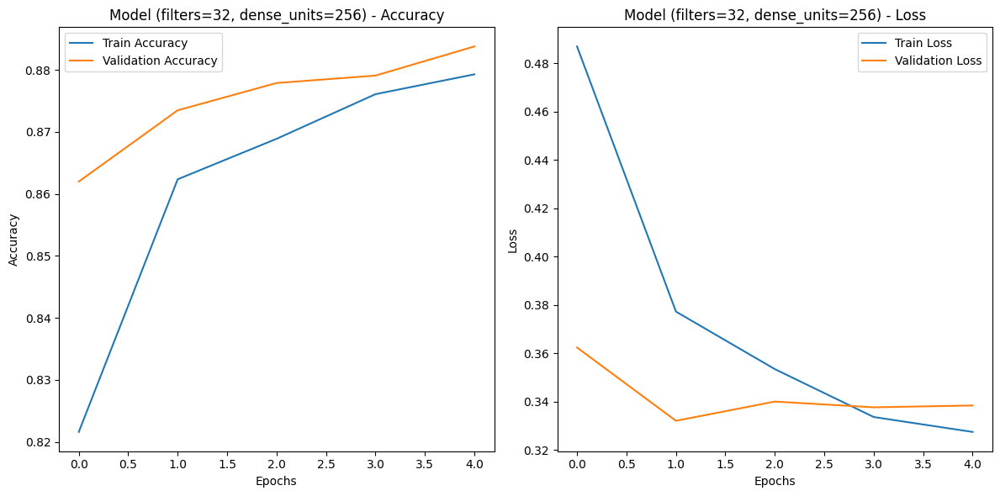

Training with filters=32, dense_units=256, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7561 - loss: 0.6843 - val_accuracy: 0.8665 - val_loss: 0.3650
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 4ms/step - accuracy: 0.8762 - loss: 0.3472 - val_accuracy: 0.8872 - val_loss: 0.3094
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8904 - loss: 0.2992 - val_accuracy: 0.8935 - val_loss: 0.2876
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9029 - loss: 0.2648 - val_accuracy: 0.8981 - val_loss: 0.2701
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9112 - loss: 0.2390 - val_accuracy: 0.9048 - val_loss: 0.2576


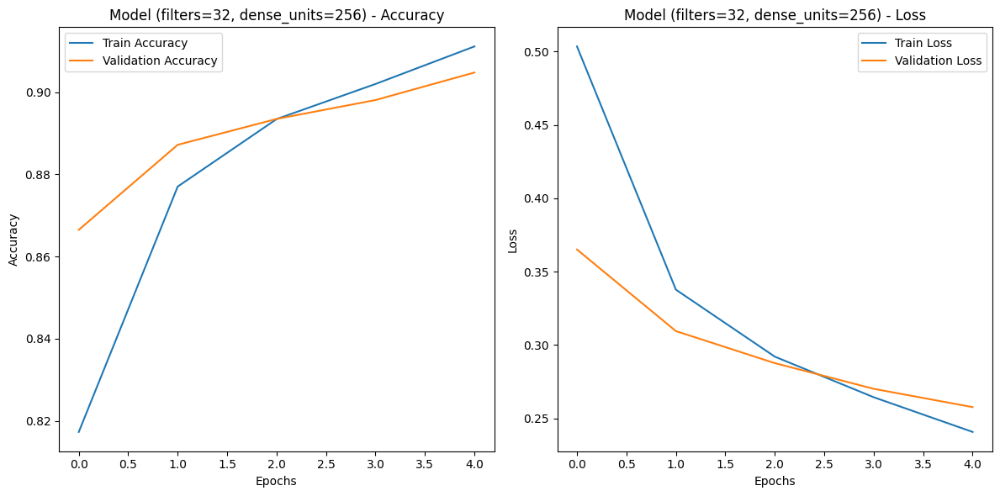

Training with filters=32, dense_units=256, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.6365 - loss: 1.0540 - val_accuracy: 0.8136 - val_loss: 0.5128
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8156 - loss: 0.5057 - val_accuracy: 0.8494 - val_loss: 0.4327
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8413 - loss: 0.4398 - val_accuracy: 0.8591 - val_loss: 0.3927
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.8562 - loss: 0.4029 - val_accuracy: 0.8666 - val_loss: 0.3674
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.8674 - loss: 0.3682 - val_accuracy: 0.8743 - val_loss: 0.3481


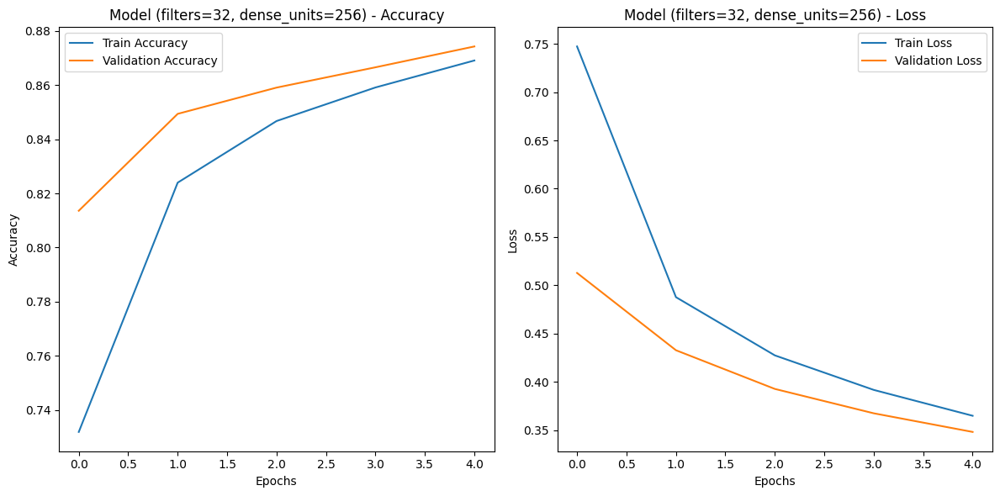

Training with filters=64, dense_units=64, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.7573 - loss: 0.6750 - val_accuracy: 0.8457 - val_loss: 0.4075
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8565 - loss: 0.3890 - val_accuracy: 0.8687 - val_loss: 0.3725
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8630 - loss: 0.3648 - val_accuracy: 0.8547 - val_loss: 0.4137
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8683 - loss: 0.3547 - val_accuracy: 0.8638 - val_loss: 0.3759
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8707 - loss: 0.3515 - val_accuracy: 0.8616 - val_loss: 0.3798


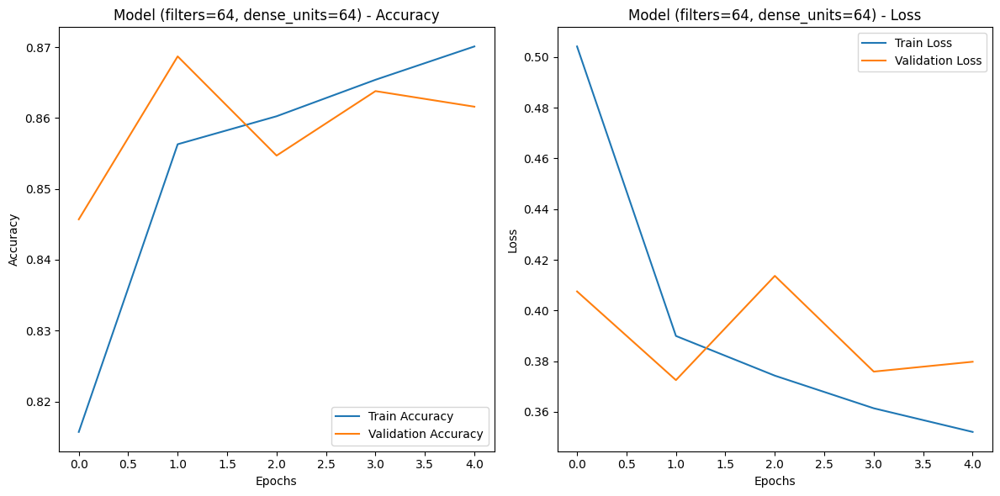

Training with filters=64, dense_units=64, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.7892 - loss: 0.5715 - val_accuracy: 0.8645 - val_loss: 0.3695
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8757 - loss: 0.3277 - val_accuracy: 0.8791 - val_loss: 0.3262
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8883 - loss: 0.2944 - val_accuracy: 0.8829 - val_loss: 0.3271
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8964 - loss: 0.2728 - val_accuracy: 0.8871 - val_loss: 0.3351
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9040 - loss: 0.2548 - val_accuracy: 0.8818 - val_loss: 0.3361


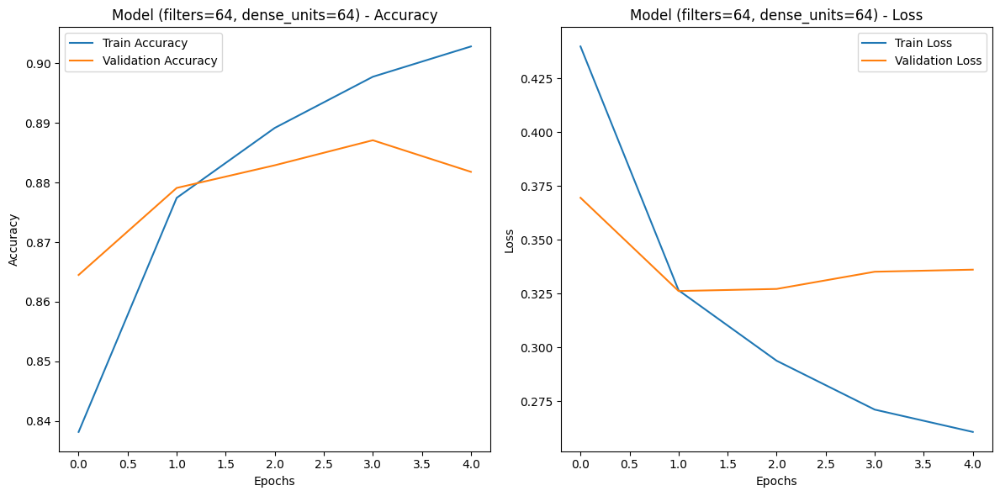

Training with filters=64, dense_units=64, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.7488 - loss: 0.6885 - val_accuracy: 0.8650 - val_loss: 0.3622
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8745 - loss: 0.3358 - val_accuracy: 0.8908 - val_loss: 0.3033
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8983 - loss: 0.2759 - val_accuracy: 0.9026 - val_loss: 0.2757
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9108 - loss: 0.2424 - val_accuracy: 0.9054 - val_loss: 0.2558
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9203 - loss: 0.2142 - val_accuracy: 0.9045 - val_loss: 0.2761


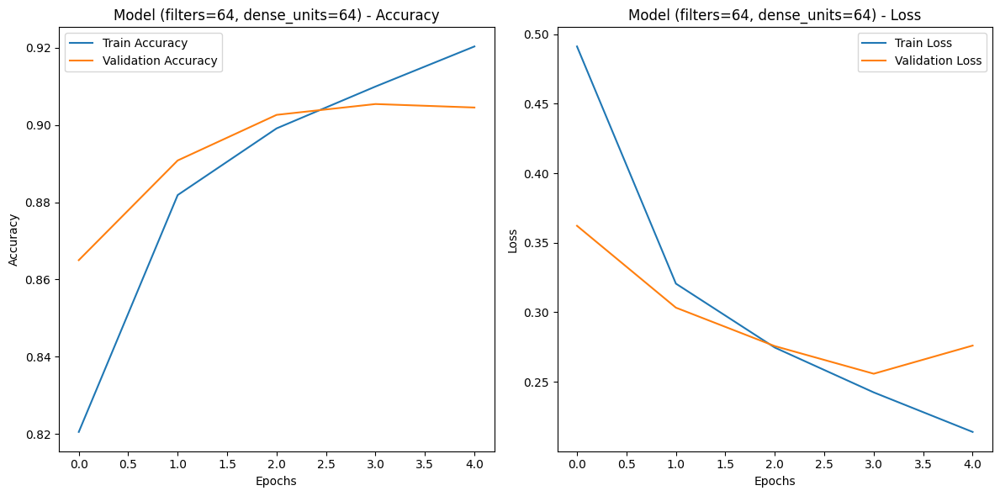

Training with filters=64, dense_units=64, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6515 - loss: 1.0111 - val_accuracy: 0.8205 - val_loss: 0.4945
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8269 - loss: 0.4796 - val_accuracy: 0.8459 - val_loss: 0.4332
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8535 - loss: 0.4113 - val_accuracy: 0.8621 - val_loss: 0.3844
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8664 - loss: 0.3744 - val_accuracy: 0.8707 - val_loss: 0.3593
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8768 - loss: 0.3480 - val_accuracy: 0.8791 - val_loss: 0.3394


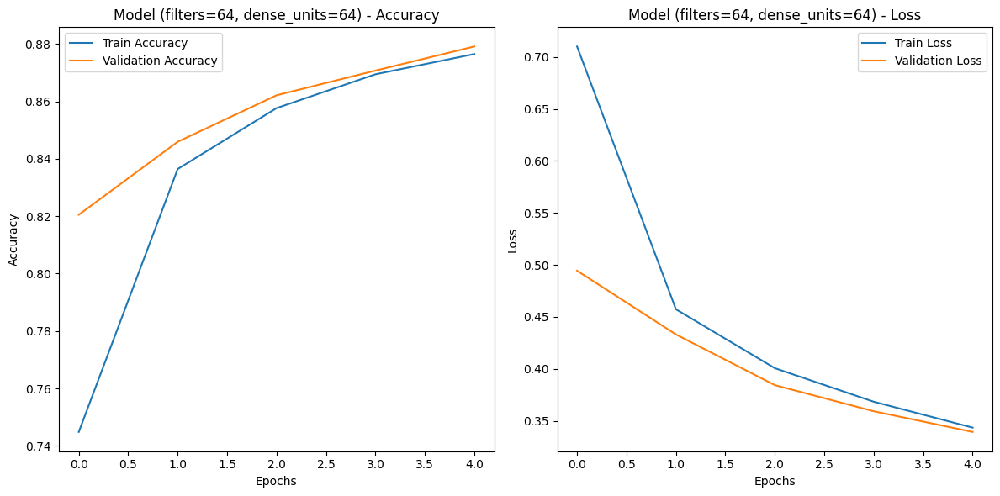

Training with filters=64, dense_units=64, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7060 - loss: 0.7915 - val_accuracy: 0.8351 - val_loss: 0.4492
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8319 - loss: 0.4623 - val_accuracy: 0.8544 - val_loss: 0.4142
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8415 - loss: 0.4392 - val_accuracy: 0.8496 - val_loss: 0.4015
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8437 - loss: 0.4203 - val_accuracy: 0.8612 - val_loss: 0.3825
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8477 - loss: 0.4138 - val_accuracy: 0.8616 - val_loss: 0.3962


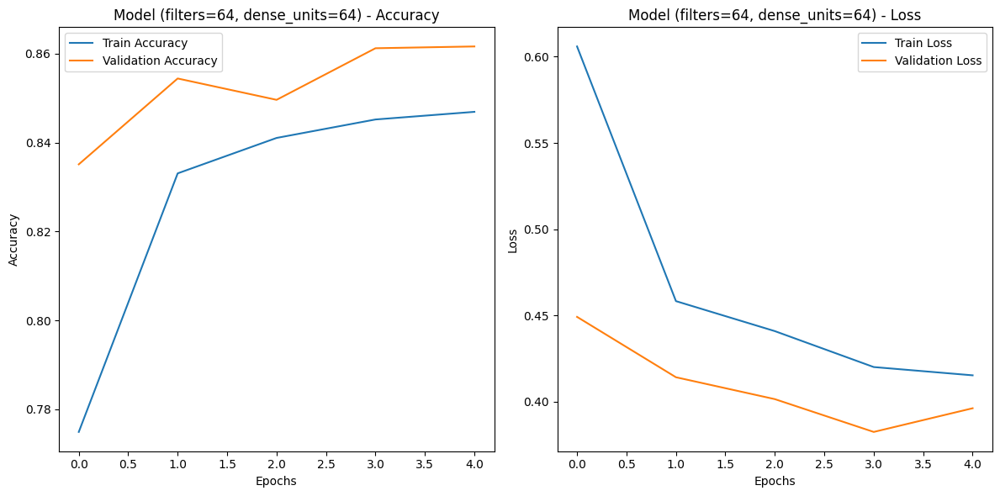

Training with filters=64, dense_units=64, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7666 - loss: 0.6401 - val_accuracy: 0.8589 - val_loss: 0.3787
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - accuracy: 0.8609 - loss: 0.3762 - val_accuracy: 0.8743 - val_loss: 0.3336
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8721 - loss: 0.3379 - val_accuracy: 0.8773 - val_loss: 0.3332
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8857 - loss: 0.3124 - val_accuracy: 0.8821 - val_loss: 0.3258
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8861 - loss: 0.3031 - val_accuracy: 0.8815 - val_loss: 0.3306


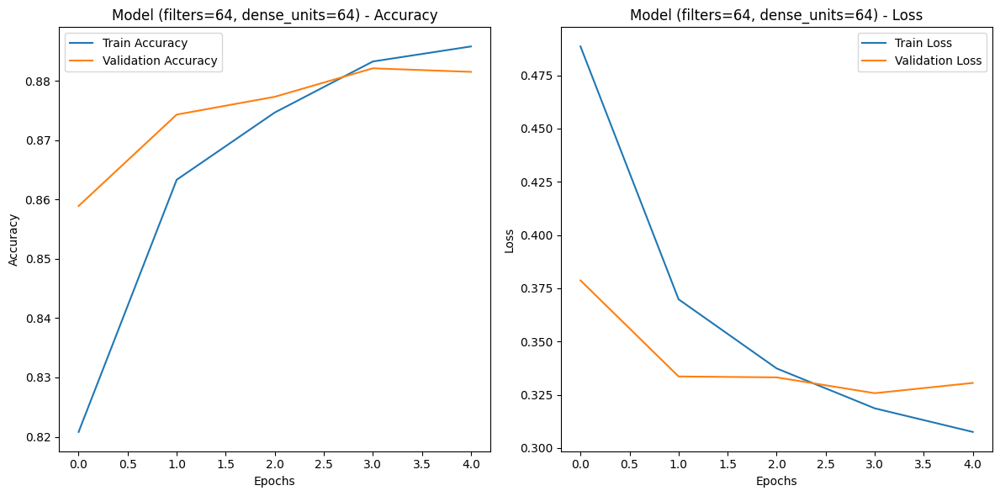

Training with filters=64, dense_units=64, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7309 - loss: 0.7451 - val_accuracy: 0.8684 - val_loss: 0.3624
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 19s 5ms/step - accuracy: 0.8626 - loss: 0.3888 - val_accuracy: 0.8879 - val_loss: 0.3083
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8810 - loss: 0.3256 - val_accuracy: 0.8908 - val_loss: 0.2978
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8958 - loss: 0.2860 - val_accuracy: 0.8885 - val_loss: 0.2917
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9010 - loss: 0.2640 - val_accuracy: 0.9033 - val_loss: 0.2618


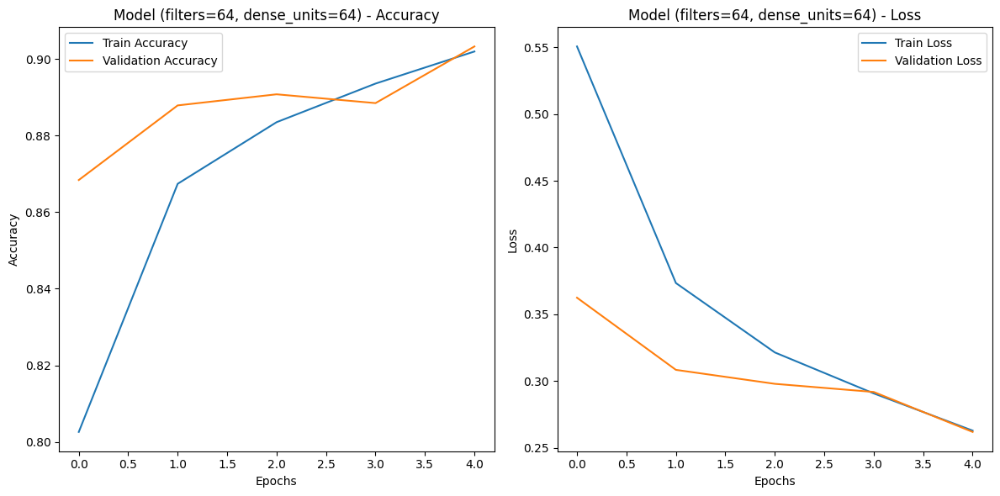

Training with filters=64, dense_units=64, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6358 - loss: 1.0694 - val_accuracy: 0.8169 - val_loss: 0.5017
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8133 - loss: 0.5252 - val_accuracy: 0.8448 - val_loss: 0.4314
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8371 - loss: 0.4545 - val_accuracy: 0.8547 - val_loss: 0.3975
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8551 - loss: 0.4140 - val_accuracy: 0.8660 - val_loss: 0.3679
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8635 - loss: 0.3852 - val_accuracy: 0.8690 - val_loss: 0.3592


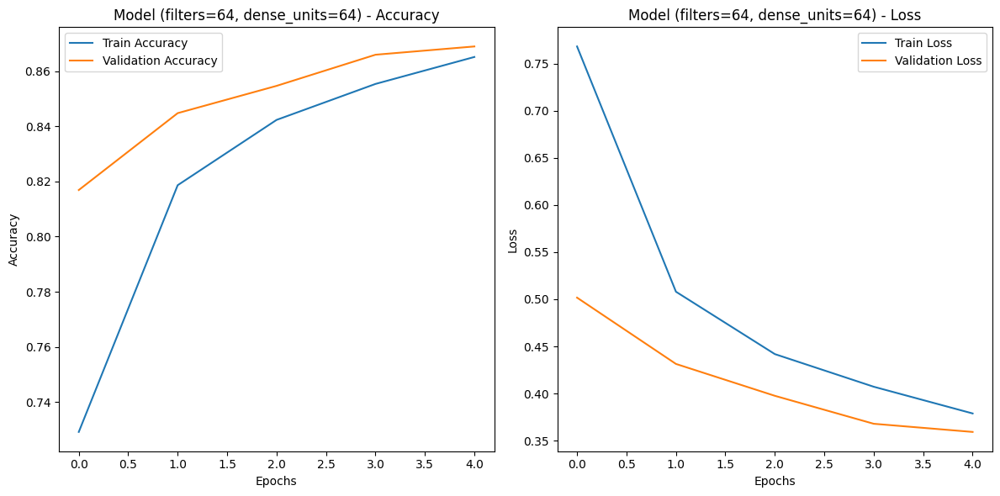

Training with filters=64, dense_units=64, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 5ms/step - accuracy: 0.7101 - loss: 0.7973 - val_accuracy: 0.8350 - val_loss: 0.4401
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8129 - loss: 0.5120 - val_accuracy: 0.8373 - val_loss: 0.4341
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8142 - loss: 0.5018 - val_accuracy: 0.8400 - val_loss: 0.4398
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8225 - loss: 0.4824 - val_accuracy: 0.8437 - val_loss: 0.4287
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8256 - loss: 0.4688 - val_accuracy: 0.8405 - val_loss: 0.4260


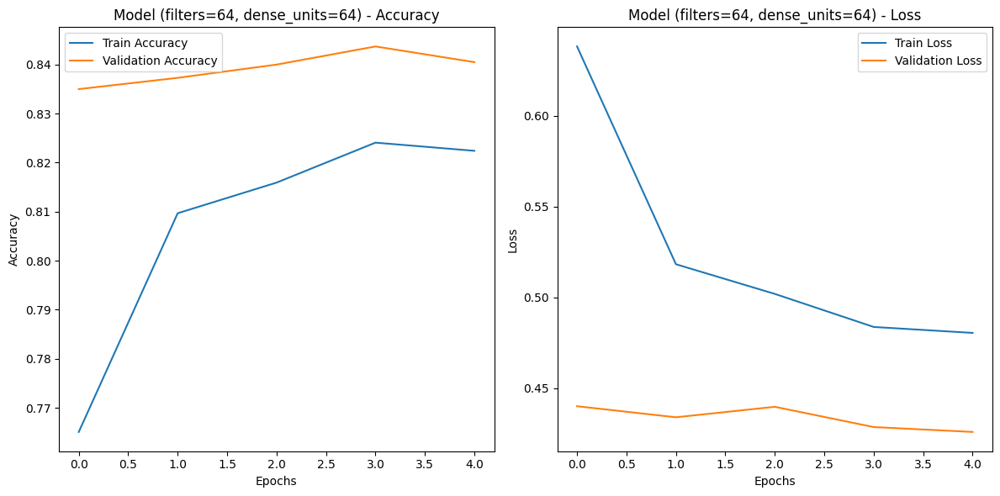

Training with filters=64, dense_units=64, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7261 - loss: 0.7504 - val_accuracy: 0.8574 - val_loss: 0.3871
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - accuracy: 0.8368 - loss: 0.4460 - val_accuracy: 0.8658 - val_loss: 0.3737
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8495 - loss: 0.4132 - val_accuracy: 0.8678 - val_loss: 0.3510
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8596 - loss: 0.3872 - val_accuracy: 0.8742 - val_loss: 0.3405
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8657 - loss: 0.3631 - val_accuracy: 0.8788 - val_loss: 0.3318


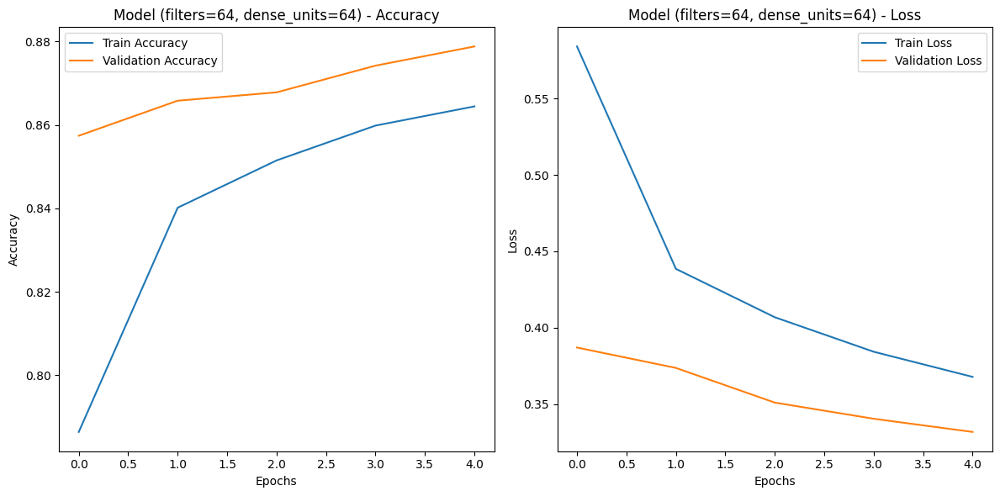

Training with filters=64, dense_units=64, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.6987 - loss: 0.8382 - val_accuracy: 0.8654 - val_loss: 0.3742
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - accuracy: 0.8414 - loss: 0.4426 - val_accuracy: 0.8771 - val_loss: 0.3449
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8657 - loss: 0.3774 - val_accuracy: 0.8891 - val_loss: 0.2948
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8827 - loss: 0.3230 - val_accuracy: 0.8950 - val_loss: 0.2840
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8883 - loss: 0.3084 - val_accuracy: 0.8930 - val_loss: 0.2831


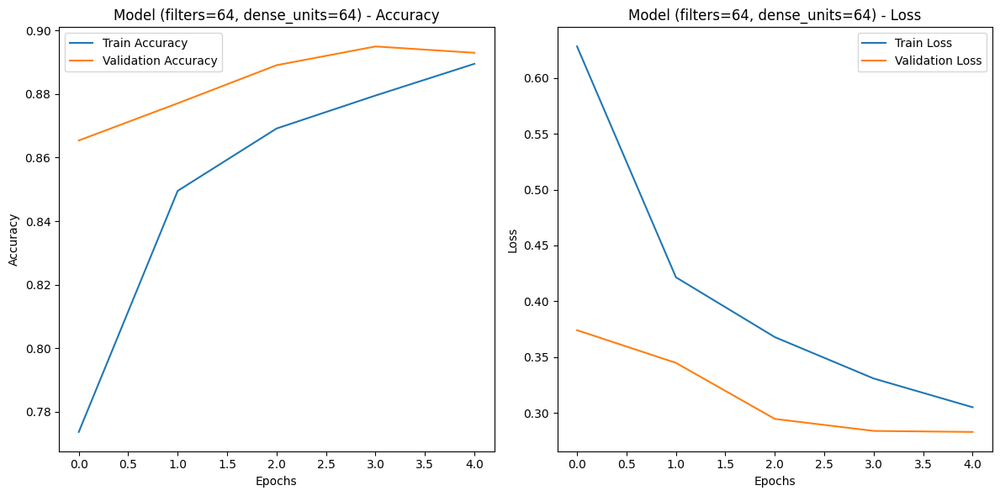

Training with filters=64, dense_units=64, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.5976 - loss: 1.1874 - val_accuracy: 0.8064 - val_loss: 0.5227
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.7839 - loss: 0.6138 - val_accuracy: 0.8371 - val_loss: 0.4550
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8123 - loss: 0.5264 - val_accuracy: 0.8436 - val_loss: 0.4222
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8291 - loss: 0.4822 - val_accuracy: 0.8625 - val_loss: 0.3815
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8442 - loss: 0.4472 - val_accuracy: 0.8666 - val_loss: 0.3701


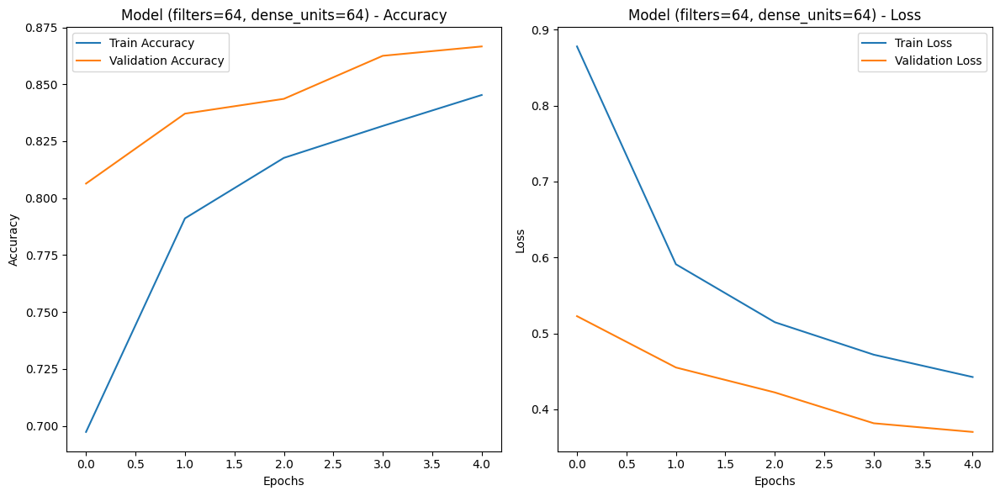

Training with filters=64, dense_units=128, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7850 - loss: 0.5904 - val_accuracy: 0.8361 - val_loss: 0.4357
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8608 - loss: 0.3749 - val_accuracy: 0.8571 - val_loss: 0.3923
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8687 - loss: 0.3530 - val_accuracy: 0.8580 - val_loss: 0.3804
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8726 - loss: 0.3402 - val_accuracy: 0.8705 - val_loss: 0.3488
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8767 - loss: 0.3307 - val_accuracy: 0.8765 - val_loss: 0.3556


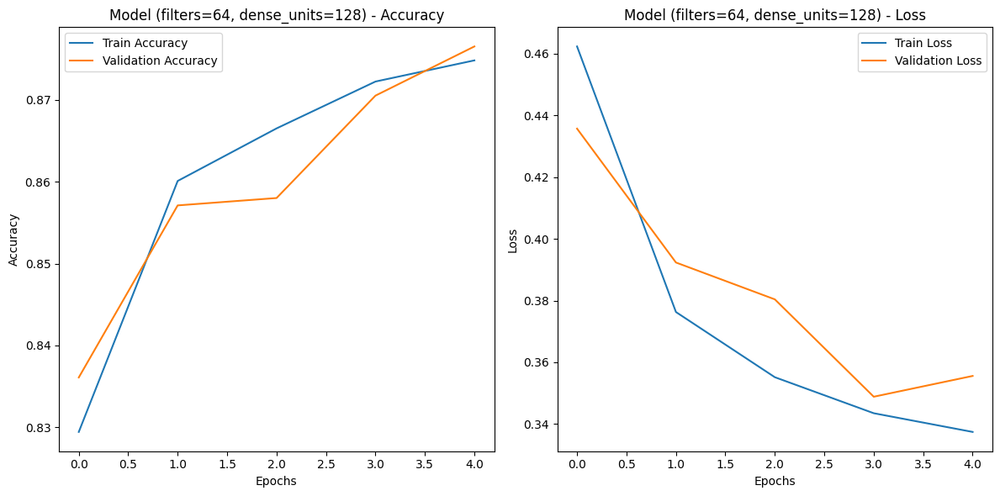

Training with filters=64, dense_units=128, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7970 - loss: 0.5538 - val_accuracy: 0.8685 - val_loss: 0.3508
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8822 - loss: 0.3145 - val_accuracy: 0.8886 - val_loss: 0.3026
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8938 - loss: 0.2813 - val_accuracy: 0.8884 - val_loss: 0.3434
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9037 - loss: 0.2560 - val_accuracy: 0.8952 - val_loss: 0.2900
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9097 - loss: 0.2425 - val_accuracy: 0.8971 - val_loss: 0.3083


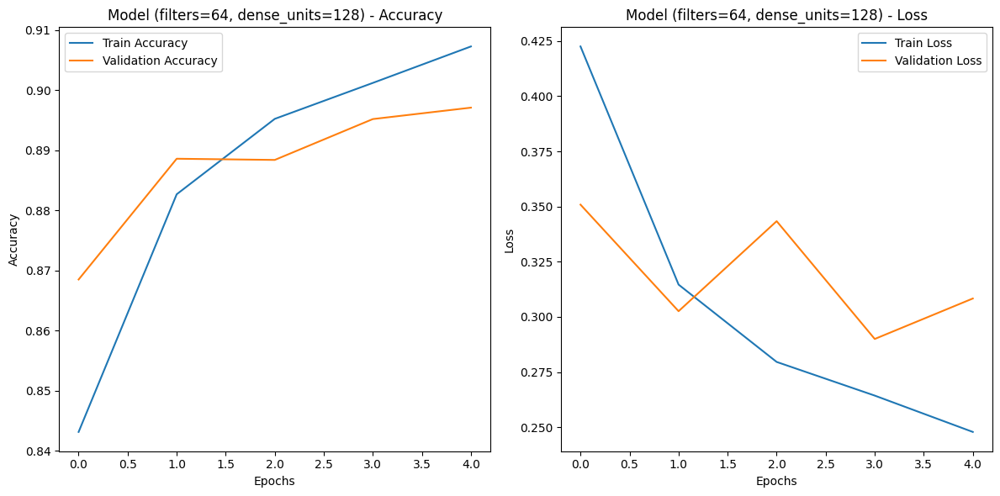

Training with filters=64, dense_units=128, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7884 - loss: 0.5919 - val_accuracy: 0.8748 - val_loss: 0.3468
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8910 - loss: 0.2989 - val_accuracy: 0.8890 - val_loss: 0.3015
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9098 - loss: 0.2423 - val_accuracy: 0.9025 - val_loss: 0.2667
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9232 - loss: 0.2070 - val_accuracy: 0.9052 - val_loss: 0.2678
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9342 - loss: 0.1772 - val_accuracy: 0.9121 - val_loss: 0.2499


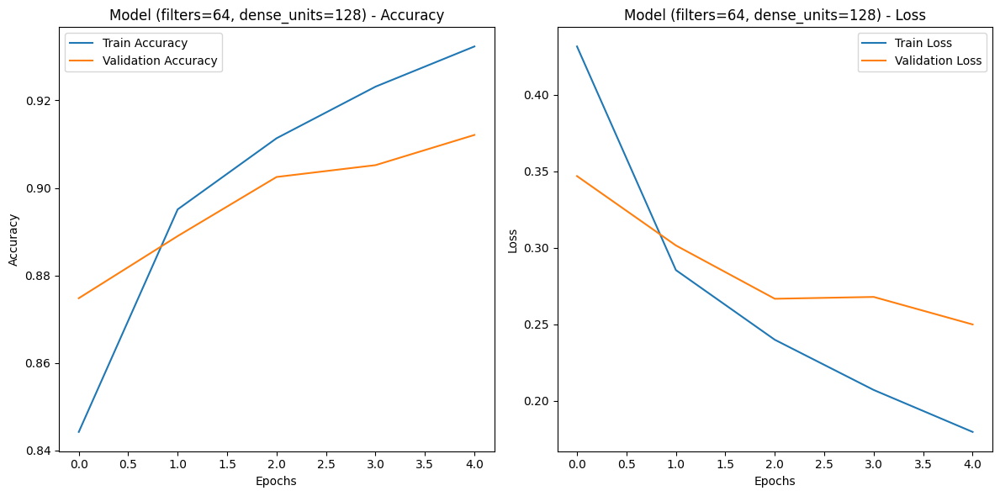

Training with filters=64, dense_units=128, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6856 - loss: 0.9307 - val_accuracy: 0.8295 - val_loss: 0.4672
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8438 - loss: 0.4373 - val_accuracy: 0.8583 - val_loss: 0.3942
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8615 - loss: 0.3826 - val_accuracy: 0.8745 - val_loss: 0.3553
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8775 - loss: 0.3438 - val_accuracy: 0.8796 - val_loss: 0.3354
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8848 - loss: 0.3179 - val_accuracy: 0.8784 - val_loss: 0.3286


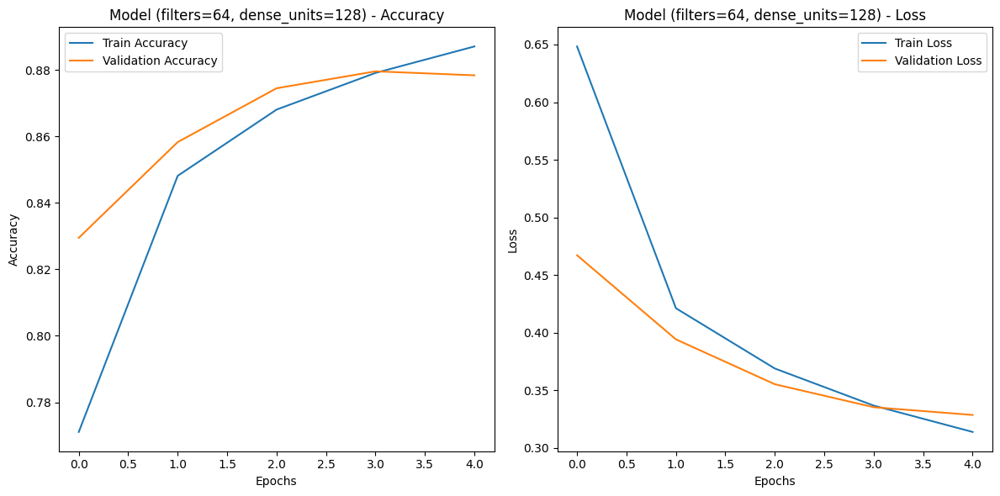

Training with filters=64, dense_units=128, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7684 - loss: 0.6363 - val_accuracy: 0.8362 - val_loss: 0.4301
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8467 - loss: 0.4106 - val_accuracy: 0.8552 - val_loss: 0.3873
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8497 - loss: 0.3967 - val_accuracy: 0.8573 - val_loss: 0.3827
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8556 - loss: 0.3791 - val_accuracy: 0.8482 - val_loss: 0.4056
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8580 - loss: 0.3832 - val_accuracy: 0.8559 - val_loss: 0.4056


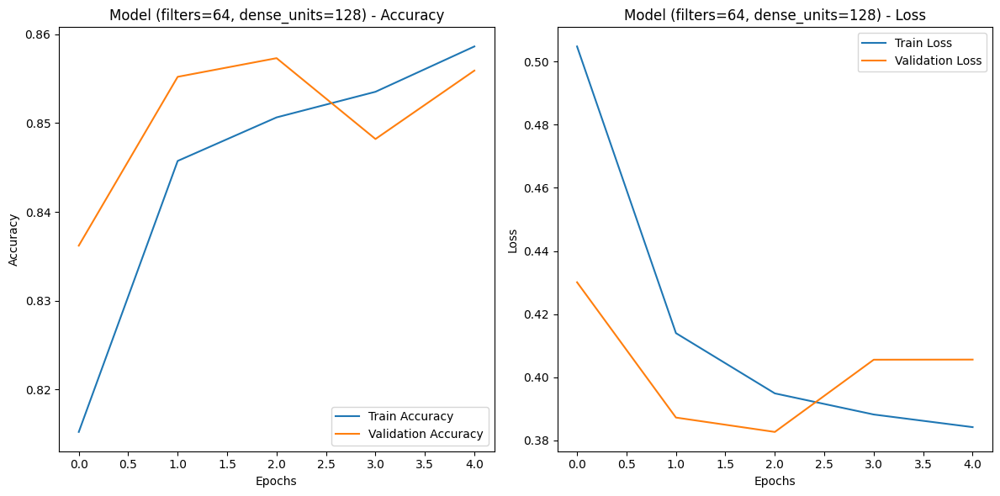

Training with filters=64, dense_units=128, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7739 - loss: 0.6144 - val_accuracy: 0.8634 - val_loss: 0.3607
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8698 - loss: 0.3500 - val_accuracy: 0.8743 - val_loss: 0.3480
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8797 - loss: 0.3256 - val_accuracy: 0.8785 - val_loss: 0.3229
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8880 - loss: 0.3031 - val_accuracy: 0.8841 - val_loss: 0.3160
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8917 - loss: 0.2896 - val_accuracy: 0.8845 - val_loss: 0.3293


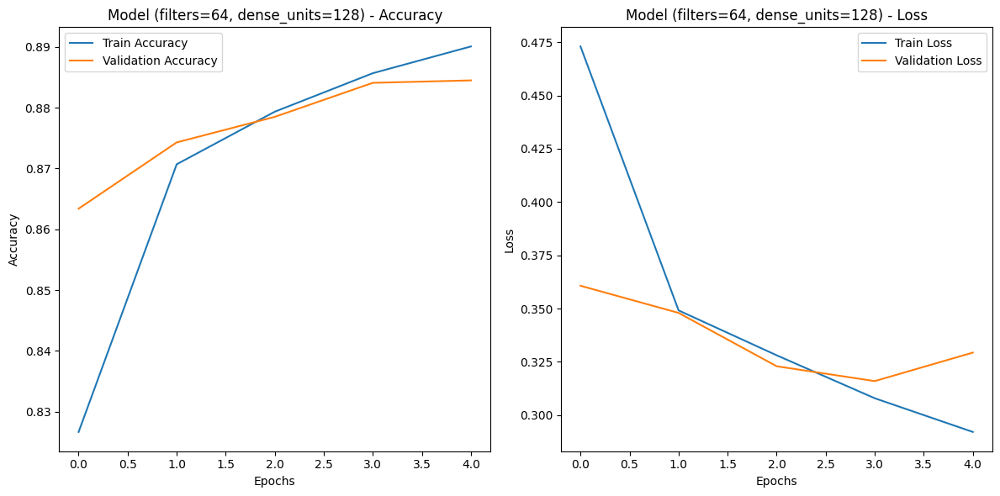

Training with filters=64, dense_units=128, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7710 - loss: 0.6356 - val_accuracy: 0.8838 - val_loss: 0.3256
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8824 - loss: 0.3275 - val_accuracy: 0.8927 - val_loss: 0.2906
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9004 - loss: 0.2702 - val_accuracy: 0.9046 - val_loss: 0.2671
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9136 - loss: 0.2374 - val_accuracy: 0.9017 - val_loss: 0.2674
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.9215 - loss: 0.2106 - val_accuracy: 0.9112 - val_loss: 0.2499


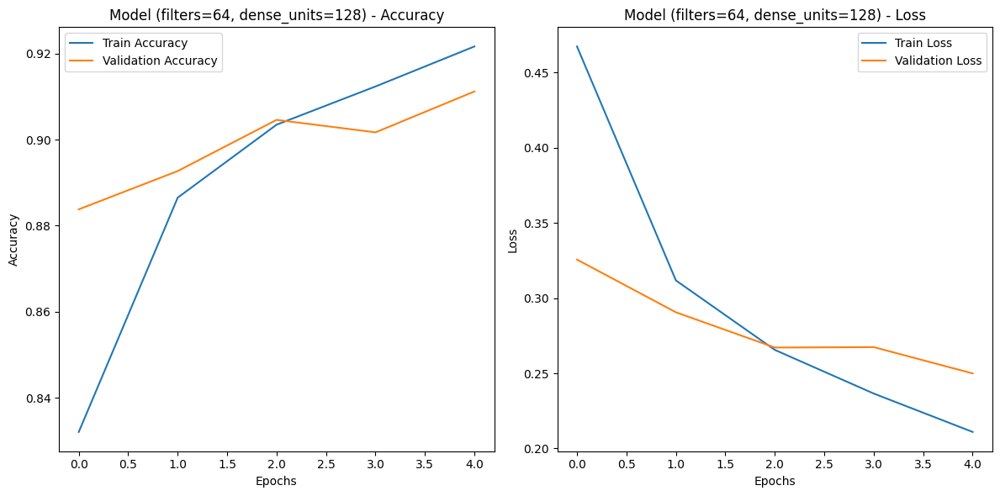

Training with filters=64, dense_units=128, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6698 - loss: 0.9874 - val_accuracy: 0.8264 - val_loss: 0.4811
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - accuracy: 0.8284 - loss: 0.4736 - val_accuracy: 0.8492 - val_loss: 0.4098
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8549 - loss: 0.4042 - val_accuracy: 0.8624 - val_loss: 0.3793
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8692 - loss: 0.3603 - val_accuracy: 0.8757 - val_loss: 0.3453
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8787 - loss: 0.3374 - val_accuracy: 0.8822 - val_loss: 0.3260


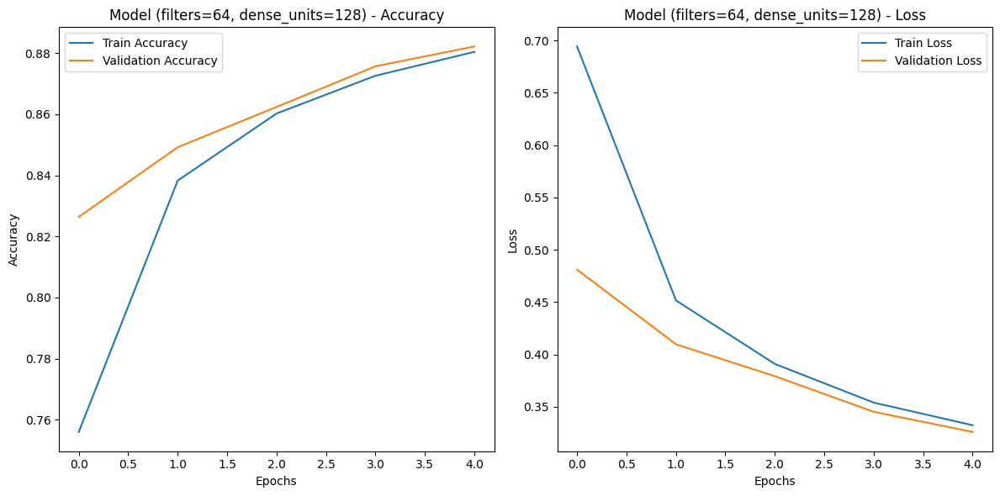

Training with filters=64, dense_units=128, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7347 - loss: 0.7328 - val_accuracy: 0.8426 - val_loss: 0.4212
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8233 - loss: 0.4826 - val_accuracy: 0.8325 - val_loss: 0.4789
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8305 - loss: 0.4671 - val_accuracy: 0.8500 - val_loss: 0.4083
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8362 - loss: 0.4495 - val_accuracy: 0.8518 - val_loss: 0.4011
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8391 - loss: 0.4415 - val_accuracy: 0.8477 - val_loss: 0.4310


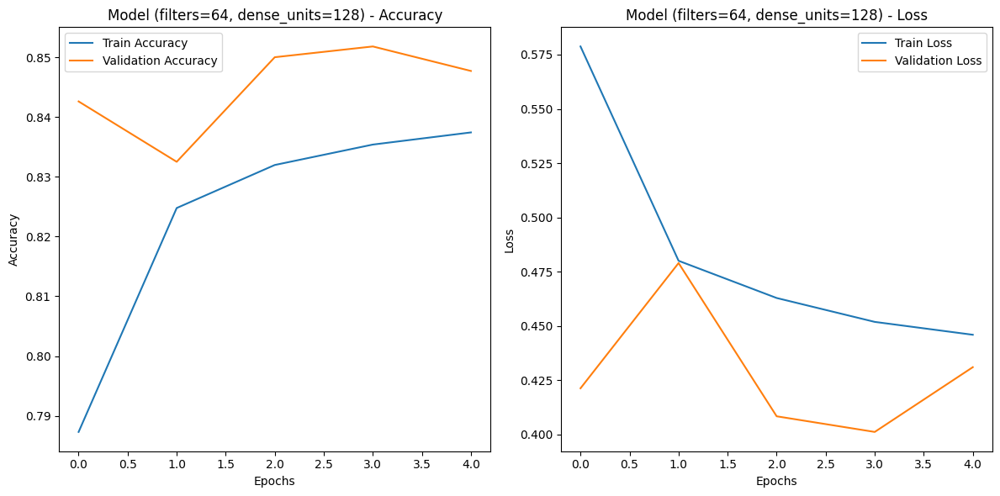

Training with filters=64, dense_units=128, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7533 - loss: 0.6781 - val_accuracy: 0.8581 - val_loss: 0.3851
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 27s 10ms/step - accuracy: 0.8544 - loss: 0.3998 - val_accuracy: 0.8592 - val_loss: 0.3690
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8661 - loss: 0.3675 - val_accuracy: 0.8691 - val_loss: 0.3542
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8703 - loss: 0.3512 - val_accuracy: 0.8782 - val_loss: 0.3165
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8757 - loss: 0.3359 - val_accuracy: 0.8783 - val_loss: 0.3304


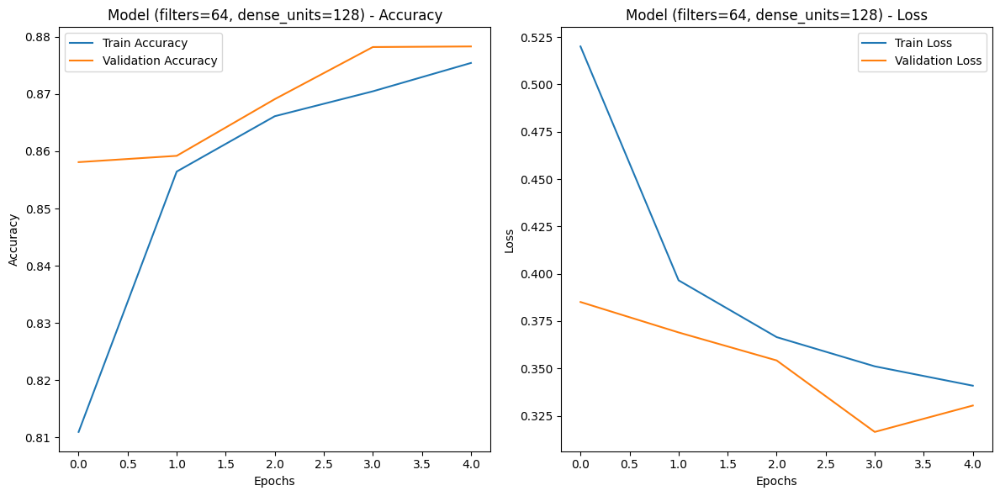

Training with filters=64, dense_units=128, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7282 - loss: 0.7483 - val_accuracy: 0.8711 - val_loss: 0.3448
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8665 - loss: 0.3741 - val_accuracy: 0.8864 - val_loss: 0.3079
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8859 - loss: 0.3202 - val_accuracy: 0.8964 - val_loss: 0.2826
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8947 - loss: 0.2871 - val_accuracy: 0.8930 - val_loss: 0.2931
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9057 - loss: 0.2619 - val_accuracy: 0.9023 - val_loss: 0.2606


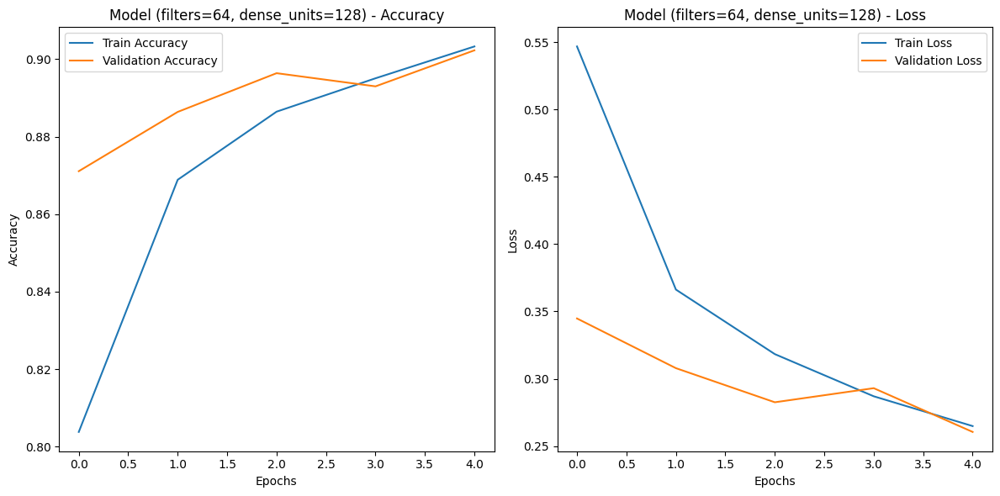

Training with filters=64, dense_units=128, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6327 - loss: 1.0738 - val_accuracy: 0.8223 - val_loss: 0.4926
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8076 - loss: 0.5331 - val_accuracy: 0.8475 - val_loss: 0.4200
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8407 - loss: 0.4545 - val_accuracy: 0.8604 - val_loss: 0.3825
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8527 - loss: 0.4140 - val_accuracy: 0.8658 - val_loss: 0.3631
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8626 - loss: 0.3874 - val_accuracy: 0.8712 - val_loss: 0.3523


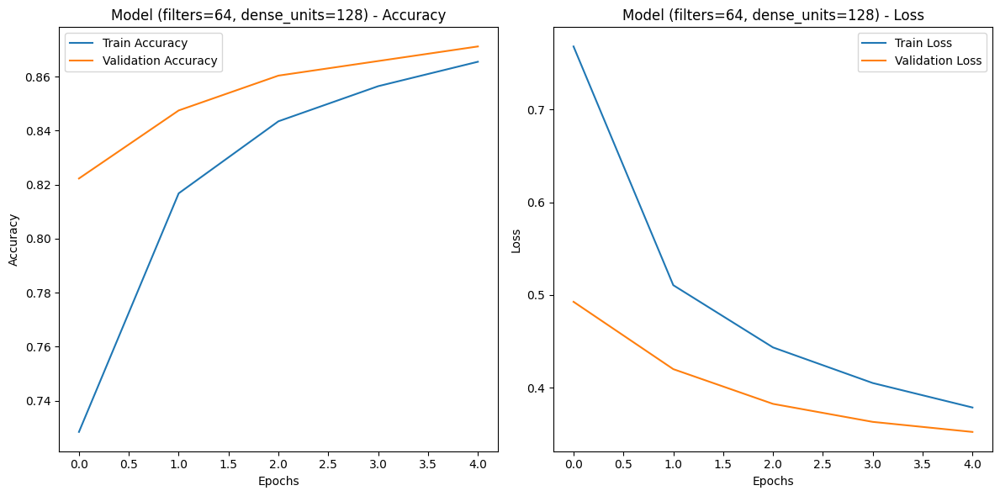

Training with filters=64, dense_units=256, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.7776 - loss: 0.6146 - val_accuracy: 0.8422 - val_loss: 0.4207
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8562 - loss: 0.3843 - val_accuracy: 0.8471 - val_loss: 0.4033
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8621 - loss: 0.3693 - val_accuracy: 0.8436 - val_loss: 0.4406
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.8684 - loss: 0.3532 - val_accuracy: 0.8585 - val_loss: 0.3843
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8727 - loss: 0.3404 - val_accuracy: 0.8654 - val_loss: 0.3863


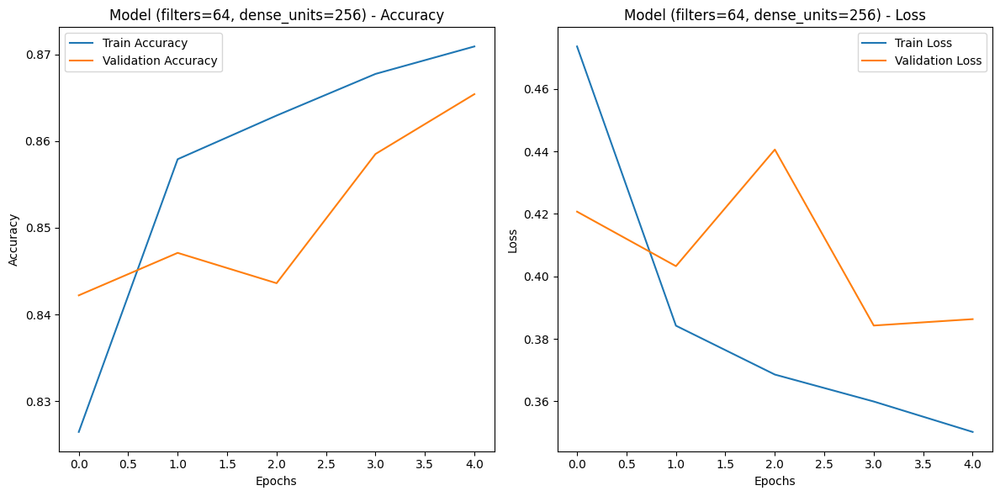

Training with filters=64, dense_units=256, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7945 - loss: 0.5575 - val_accuracy: 0.8668 - val_loss: 0.3636
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8817 - loss: 0.3175 - val_accuracy: 0.8819 - val_loss: 0.3343
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8931 - loss: 0.2815 - val_accuracy: 0.8779 - val_loss: 0.3420
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8994 - loss: 0.2676 - val_accuracy: 0.8843 - val_loss: 0.3283
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9081 - loss: 0.2447 - val_accuracy: 0.8739 - val_loss: 0.3407


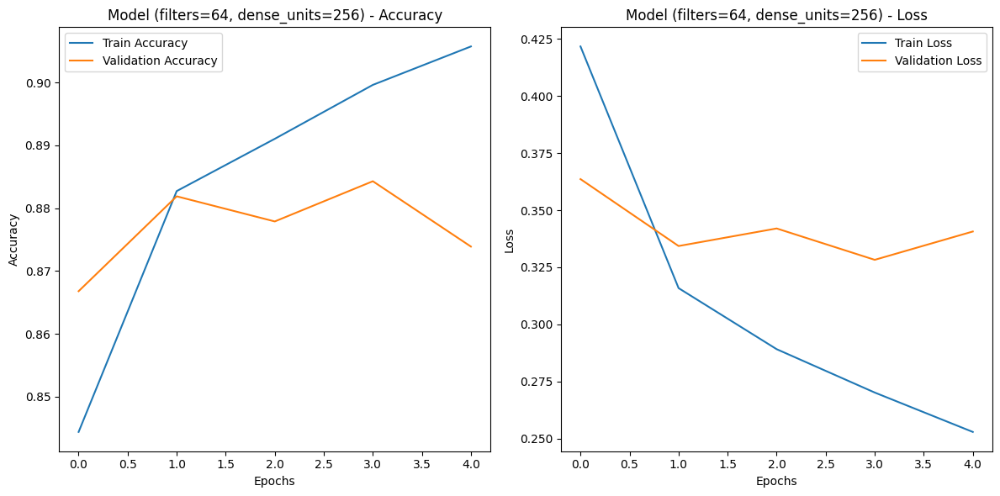

Training with filters=64, dense_units=256, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7930 - loss: 0.5697 - val_accuracy: 0.8788 - val_loss: 0.3263
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8962 - loss: 0.2786 - val_accuracy: 0.8976 - val_loss: 0.2762
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9136 - loss: 0.2323 - val_accuracy: 0.9048 - val_loss: 0.2628
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9270 - loss: 0.1949 - val_accuracy: 0.9085 - val_loss: 0.2435
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9364 - loss: 0.1668 - val_accuracy: 0.9062 - val_loss: 0.2645


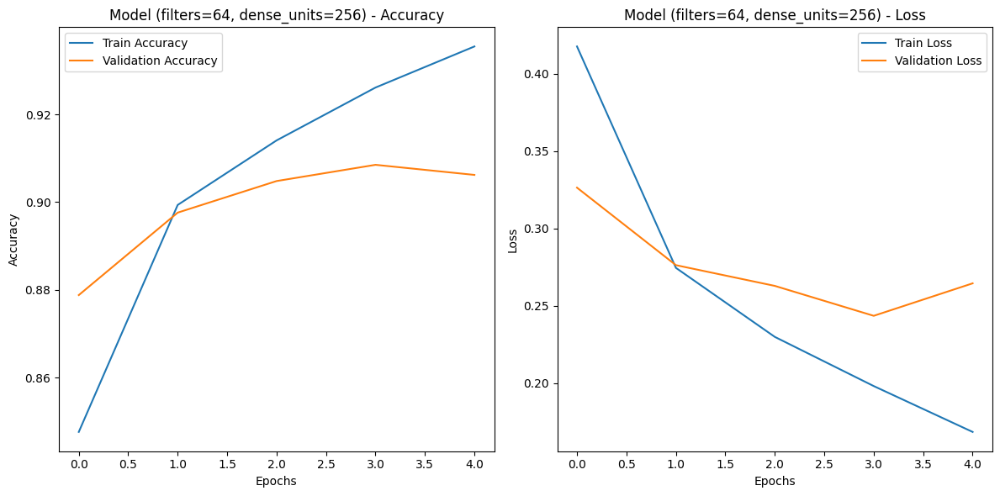

Training with filters=64, dense_units=256, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7069 - loss: 0.8746 - val_accuracy: 0.8470 - val_loss: 0.4364
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8529 - loss: 0.4140 - val_accuracy: 0.8677 - val_loss: 0.3724
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8732 - loss: 0.3536 - val_accuracy: 0.8727 - val_loss: 0.3533
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8848 - loss: 0.3204 - val_accuracy: 0.8755 - val_loss: 0.3346
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8909 - loss: 0.2995 - val_accuracy: 0.8935 - val_loss: 0.2958


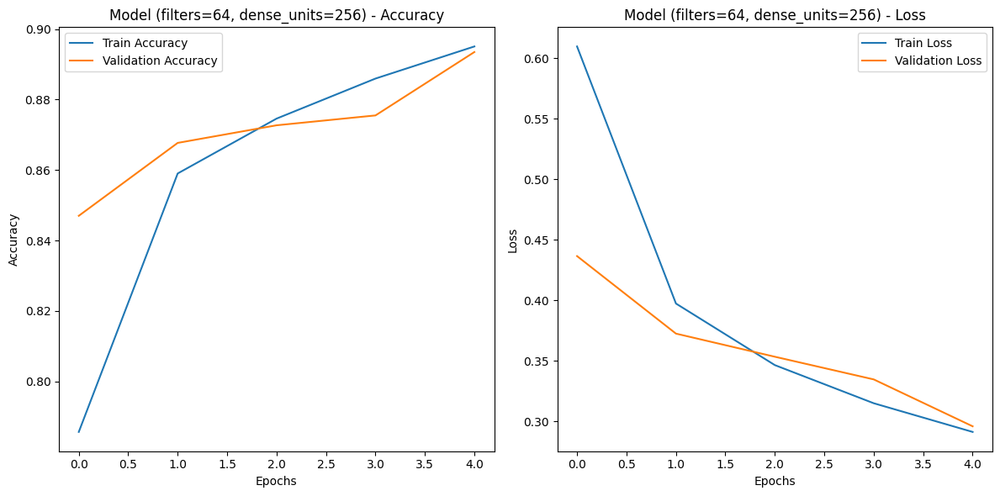

Training with filters=64, dense_units=256, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.7584 - loss: 0.6769 - val_accuracy: 0.8455 - val_loss: 0.4154
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8438 - loss: 0.4195 - val_accuracy: 0.8530 - val_loss: 0.4114
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8499 - loss: 0.4055 - val_accuracy: 0.8478 - val_loss: 0.4095
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8540 - loss: 0.3953 - val_accuracy: 0.8624 - val_loss: 0.3773
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8568 - loss: 0.3848 - val_accuracy: 0.8648 - val_loss: 0.3772


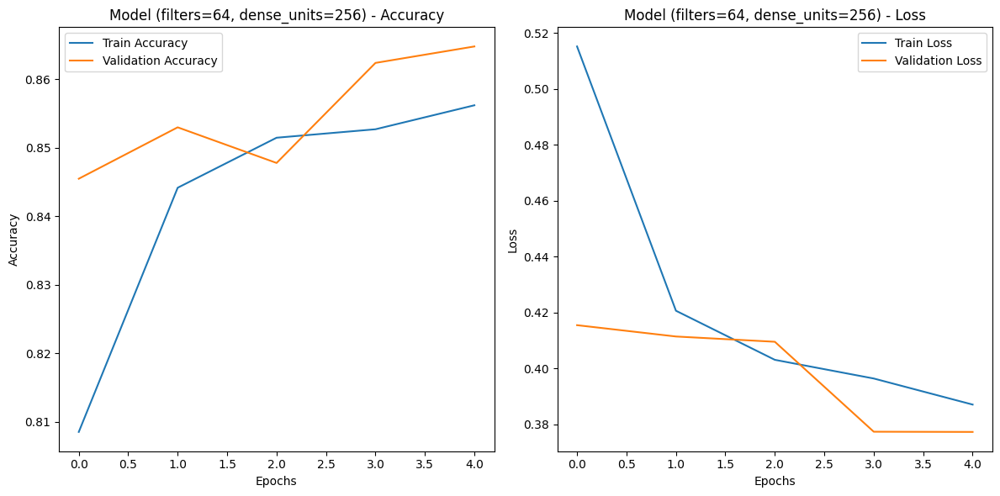

Training with filters=64, dense_units=256, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7875 - loss: 0.5947 - val_accuracy: 0.8640 - val_loss: 0.3792
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8678 - loss: 0.3548 - val_accuracy: 0.8727 - val_loss: 0.3452
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8814 - loss: 0.3152 - val_accuracy: 0.8847 - val_loss: 0.3250
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8898 - loss: 0.2973 - val_accuracy: 0.8878 - val_loss: 0.3129
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8924 - loss: 0.2885 - val_accuracy: 0.8886 - val_loss: 0.3147


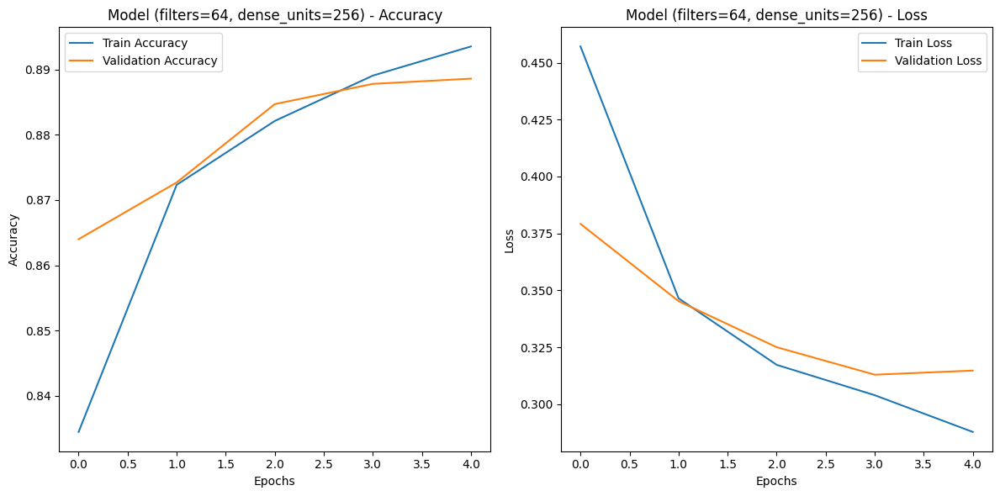

Training with filters=64, dense_units=256, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7805 - loss: 0.6120 - val_accuracy: 0.8803 - val_loss: 0.3264
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8890 - loss: 0.3034 - val_accuracy: 0.8761 - val_loss: 0.3264
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9045 - loss: 0.2578 - val_accuracy: 0.9007 - val_loss: 0.2621
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9189 - loss: 0.2196 - val_accuracy: 0.9053 - val_loss: 0.2540
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9296 - loss: 0.1880 - val_accuracy: 0.9131 - val_loss: 0.2451


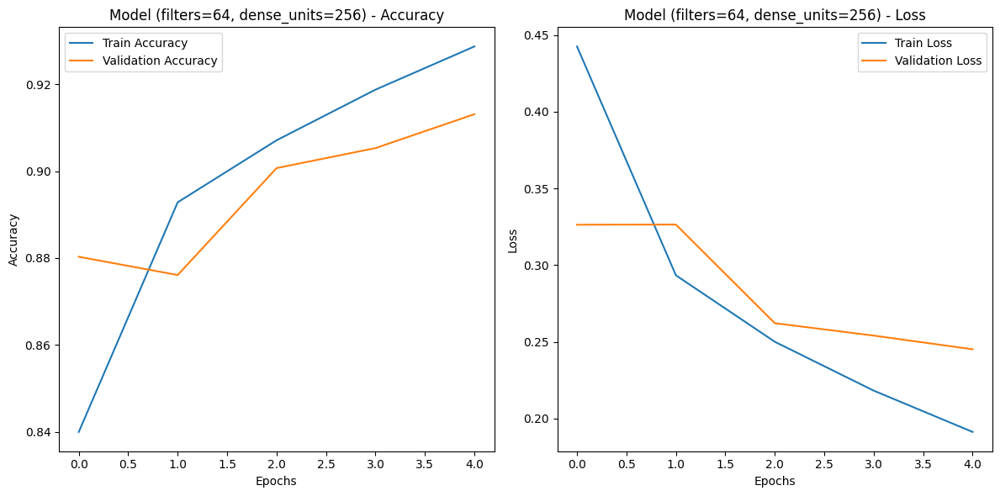

Training with filters=64, dense_units=256, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.6936 - loss: 0.9096 - val_accuracy: 0.8389 - val_loss: 0.4525
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8426 - loss: 0.4363 - val_accuracy: 0.8632 - val_loss: 0.3816
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8615 - loss: 0.3818 - val_accuracy: 0.8745 - val_loss: 0.3489
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8789 - loss: 0.3372 - val_accuracy: 0.8780 - val_loss: 0.3353
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 5ms/step - accuracy: 0.8871 - loss: 0.3111 - val_accuracy: 0.8906 - val_loss: 0.3088


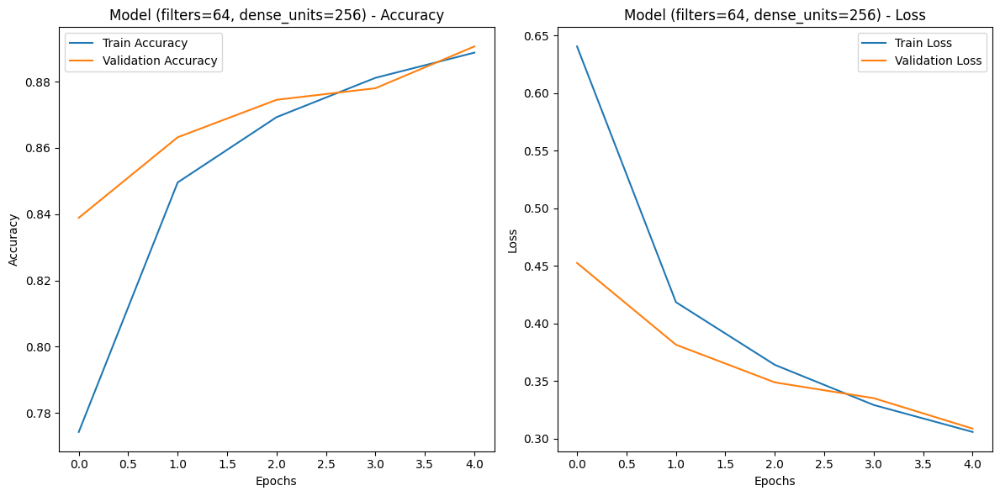

Training with filters=64, dense_units=256, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.7461 - loss: 0.7088 - val_accuracy: 0.8329 - val_loss: 0.4368
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 5ms/step - accuracy: 0.8258 - loss: 0.4657 - val_accuracy: 0.8460 - val_loss: 0.4107
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8333 - loss: 0.4572 - val_accuracy: 0.8479 - val_loss: 0.4138
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 5ms/step - accuracy: 0.8371 - loss: 0.4443 - val_accuracy: 0.8213 - val_loss: 0.4588
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8398 - loss: 0.4378 - val_accuracy: 0.8426 - val_loss: 0.4102


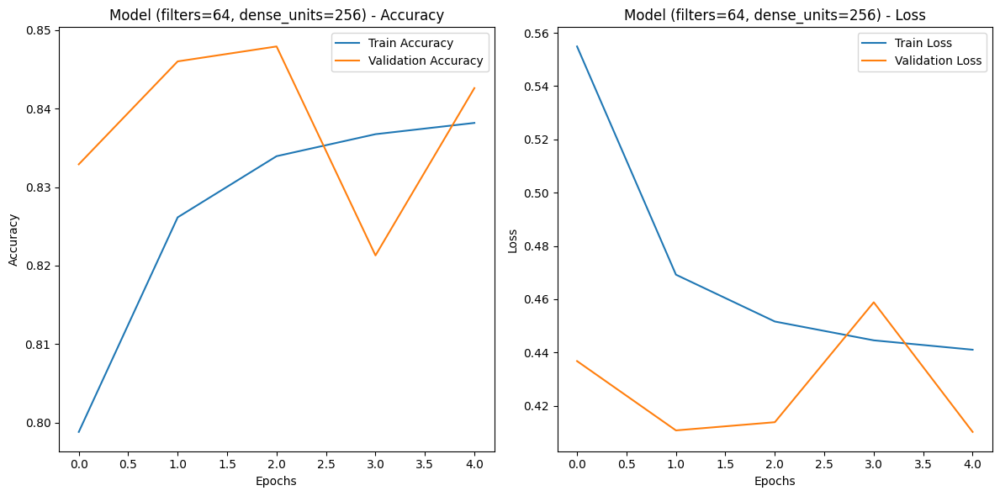

Training with filters=64, dense_units=256, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7780 - loss: 0.6129 - val_accuracy: 0.8519 - val_loss: 0.3925
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8591 - loss: 0.3848 - val_accuracy: 0.8657 - val_loss: 0.3611
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8649 - loss: 0.3555 - val_accuracy: 0.8778 - val_loss: 0.3280
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8784 - loss: 0.3338 - val_accuracy: 0.8812 - val_loss: 0.3272
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8818 - loss: 0.3242 - val_accuracy: 0.8766 - val_loss: 0.3570


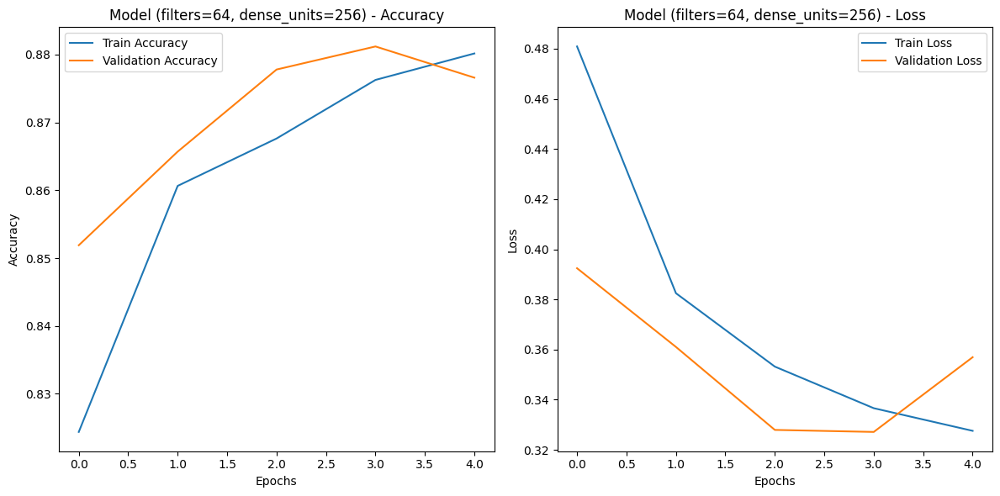

Training with filters=64, dense_units=256, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.7655 - loss: 0.6478 - val_accuracy: 0.8714 - val_loss: 0.3477
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - accuracy: 0.8777 - loss: 0.3317 - val_accuracy: 0.8911 - val_loss: 0.2947
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8955 - loss: 0.2820 - val_accuracy: 0.8996 - val_loss: 0.2693
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9097 - loss: 0.2448 - val_accuracy: 0.9072 - val_loss: 0.2500
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9161 - loss: 0.2223 - val_accuracy: 0.9087 - val_loss: 0.2485


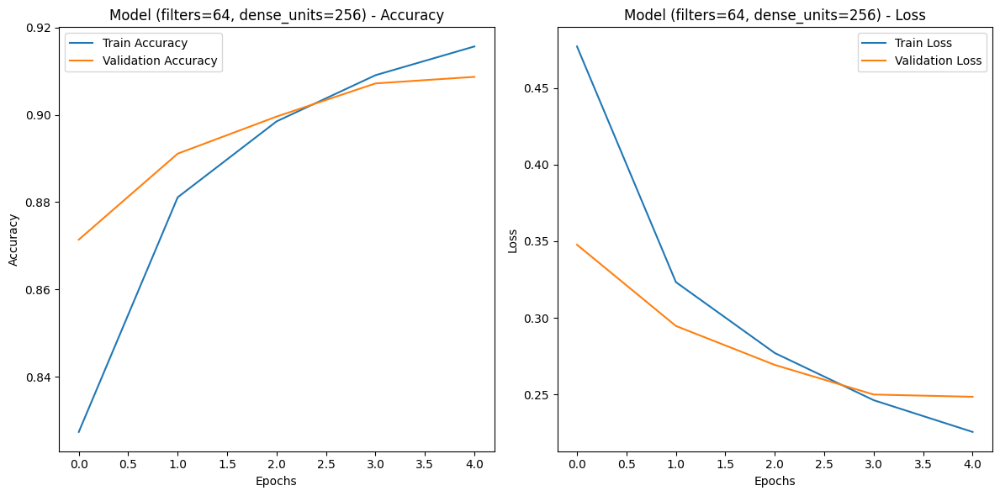

Training with filters=64, dense_units=256, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.6709 - loss: 0.9601 - val_accuracy: 0.8231 - val_loss: 0.4799
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8318 - loss: 0.4653 - val_accuracy: 0.8602 - val_loss: 0.3938
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8558 - loss: 0.4030 - val_accuracy: 0.8692 - val_loss: 0.3596
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8700 - loss: 0.3569 - val_accuracy: 0.8747 - val_loss: 0.3408
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8781 - loss: 0.3357 - val_accuracy: 0.8876 - val_loss: 0.3152


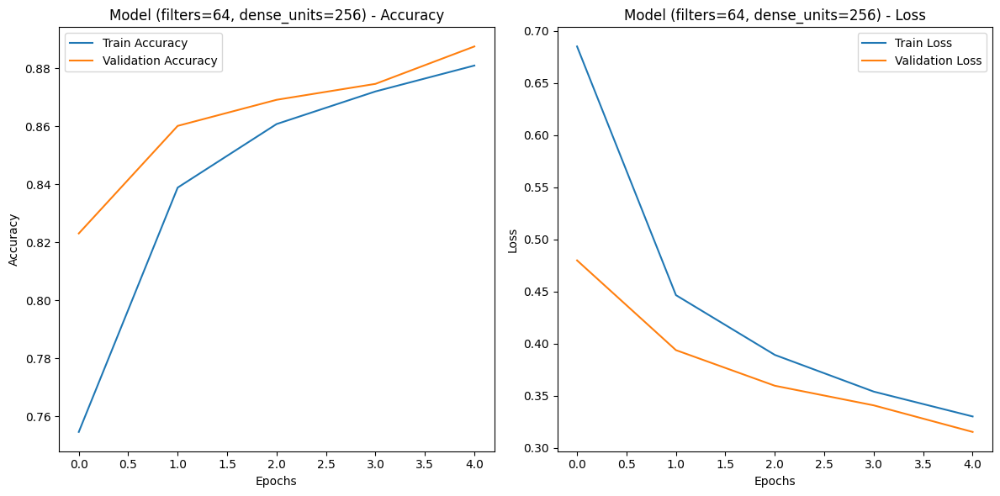

Training with filters=128, dense_units=64, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 8ms/step - accuracy: 0.7581 - loss: 0.6877 - val_accuracy: 0.8226 - val_loss: 0.4875
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - accuracy: 0.8515 - loss: 0.3942 - val_accuracy: 0.8633 - val_loss: 0.3733
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8655 - loss: 0.3647 - val_accuracy: 0.8616 - val_loss: 0.3901
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8671 - loss: 0.3516 - val_accuracy: 0.8707 - val_loss: 0.3697
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8701 - loss: 0.3439 - val_accuracy: 0.8690 - val_loss: 0.3822


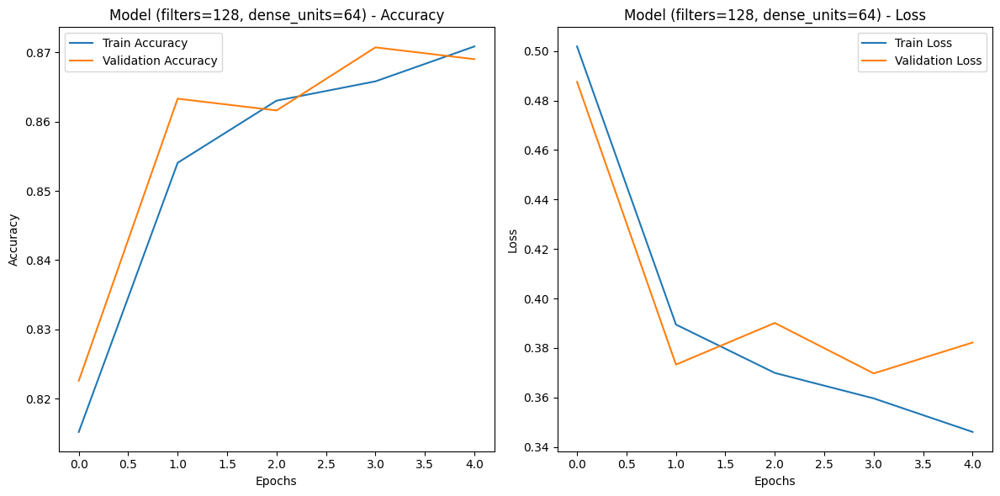

Training with filters=128, dense_units=64, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7887 - loss: 0.5904 - val_accuracy: 0.8678 - val_loss: 0.3551
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.8804 - loss: 0.3220 - val_accuracy: 0.8865 - val_loss: 0.3104
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8921 - loss: 0.2879 - val_accuracy: 0.8862 - val_loss: 0.3147
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8971 - loss: 0.2675 - val_accuracy: 0.8884 - val_loss: 0.3124
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9035 - loss: 0.2516 - val_accuracy: 0.8966 - val_loss: 0.2951


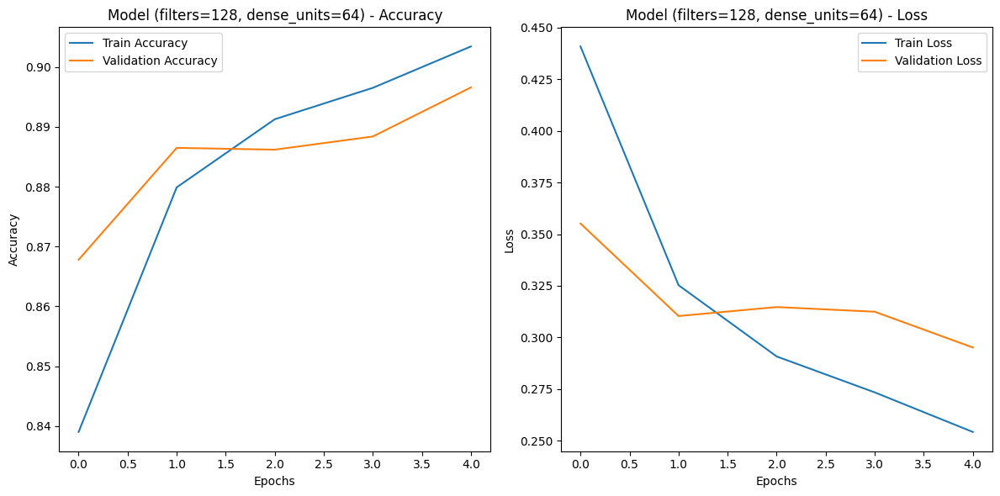

Training with filters=128, dense_units=64, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7756 - loss: 0.6293 - val_accuracy: 0.8784 - val_loss: 0.3328
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8808 - loss: 0.3253 - val_accuracy: 0.8970 - val_loss: 0.2916
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9003 - loss: 0.2675 - val_accuracy: 0.8995 - val_loss: 0.2702
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9163 - loss: 0.2270 - val_accuracy: 0.9002 - val_loss: 0.2699
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9252 - loss: 0.1975 - val_accuracy: 0.9088 - val_loss: 0.2527


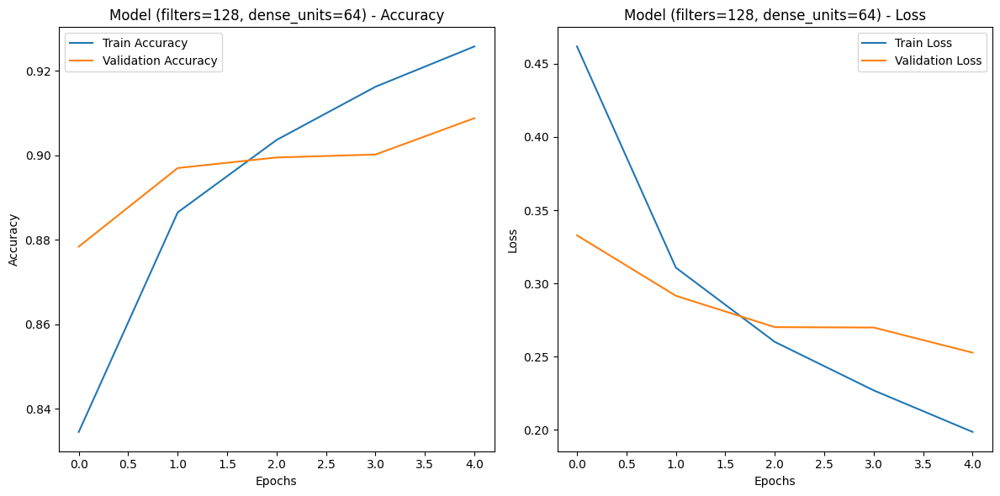

Training with filters=128, dense_units=64, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.6881 - loss: 0.9246 - val_accuracy: 0.8390 - val_loss: 0.4642
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8425 - loss: 0.4413 - val_accuracy: 0.8596 - val_loss: 0.3924
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8627 - loss: 0.3833 - val_accuracy: 0.8740 - val_loss: 0.3483
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8765 - loss: 0.3457 - val_accuracy: 0.8812 - val_loss: 0.3276
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8862 - loss: 0.3164 - val_accuracy: 0.8859 - val_loss: 0.3149


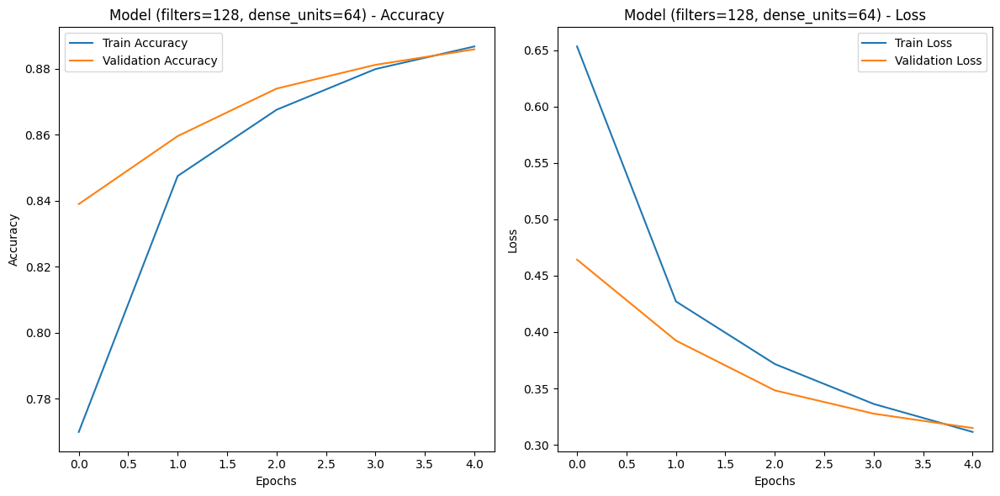

Training with filters=128, dense_units=64, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7422 - loss: 0.7601 - val_accuracy: 0.8395 - val_loss: 0.4427
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8383 - loss: 0.4427 - val_accuracy: 0.8468 - val_loss: 0.4211
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8427 - loss: 0.4338 - val_accuracy: 0.8501 - val_loss: 0.4007
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8448 - loss: 0.4107 - val_accuracy: 0.8564 - val_loss: 0.4092
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8505 - loss: 0.4043 - val_accuracy: 0.8497 - val_loss: 0.4104


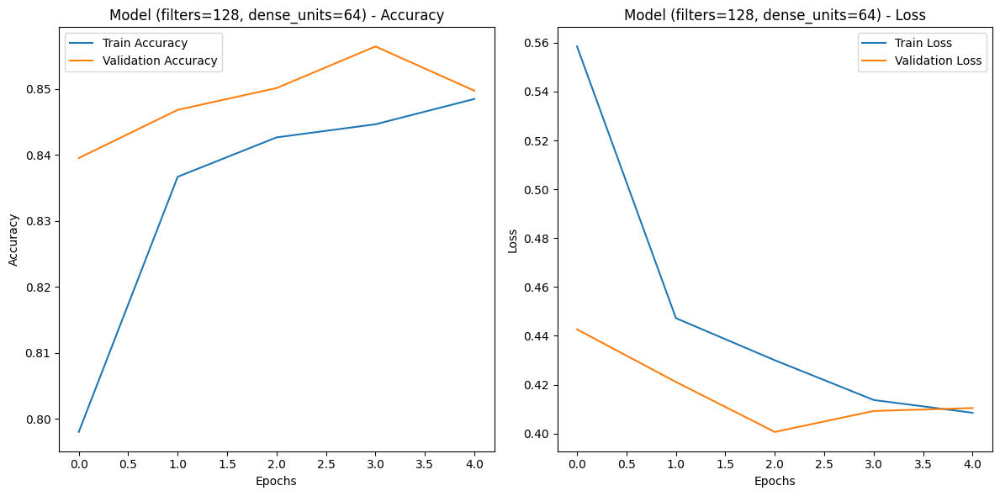

Training with filters=128, dense_units=64, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7227 - loss: 0.7559 - val_accuracy: 0.8573 - val_loss: 0.3855
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8460 - loss: 0.4237 - val_accuracy: 0.8765 - val_loss: 0.3451
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8615 - loss: 0.3807 - val_accuracy: 0.8812 - val_loss: 0.3299
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8697 - loss: 0.3527 - val_accuracy: 0.8785 - val_loss: 0.3338
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8708 - loss: 0.3483 - val_accuracy: 0.8743 - val_loss: 0.3446


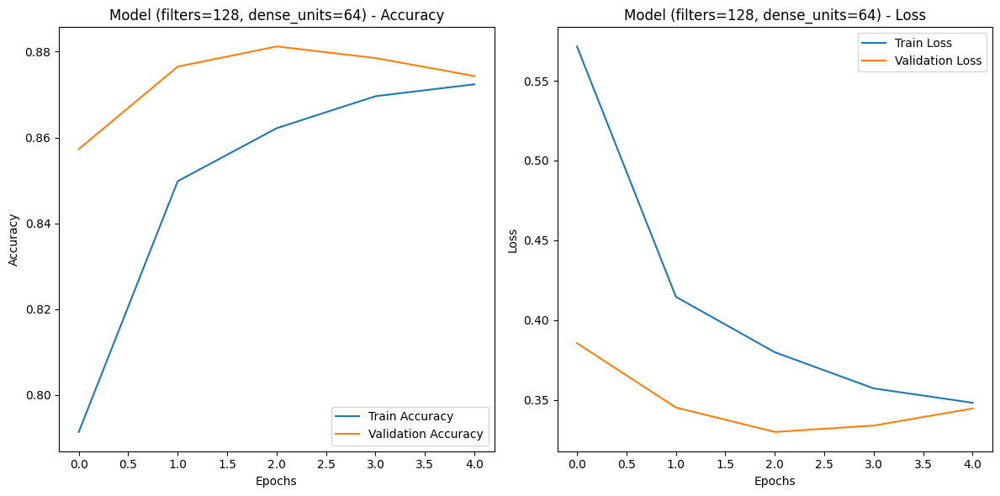

Training with filters=128, dense_units=64, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7644 - loss: 0.6649 - val_accuracy: 0.8786 - val_loss: 0.3304
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8786 - loss: 0.3347 - val_accuracy: 0.8952 - val_loss: 0.2958
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8957 - loss: 0.2819 - val_accuracy: 0.9013 - val_loss: 0.2711
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.9071 - loss: 0.2514 - val_accuracy: 0.9007 - val_loss: 0.2750
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9167 - loss: 0.2233 - val_accuracy: 0.9035 - val_loss: 0.2666


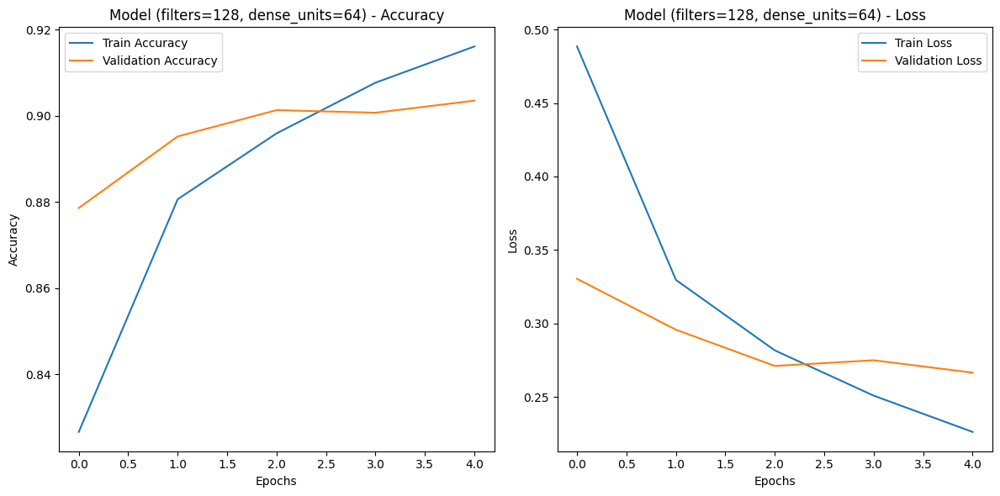

Training with filters=128, dense_units=64, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.6579 - loss: 1.0085 - val_accuracy: 0.8258 - val_loss: 0.4794
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8266 - loss: 0.4943 - val_accuracy: 0.8531 - val_loss: 0.4040
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8477 - loss: 0.4303 - val_accuracy: 0.8712 - val_loss: 0.3586
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8647 - loss: 0.3799 - val_accuracy: 0.8774 - val_loss: 0.3437
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8756 - loss: 0.3509 - val_accuracy: 0.8822 - val_loss: 0.3249


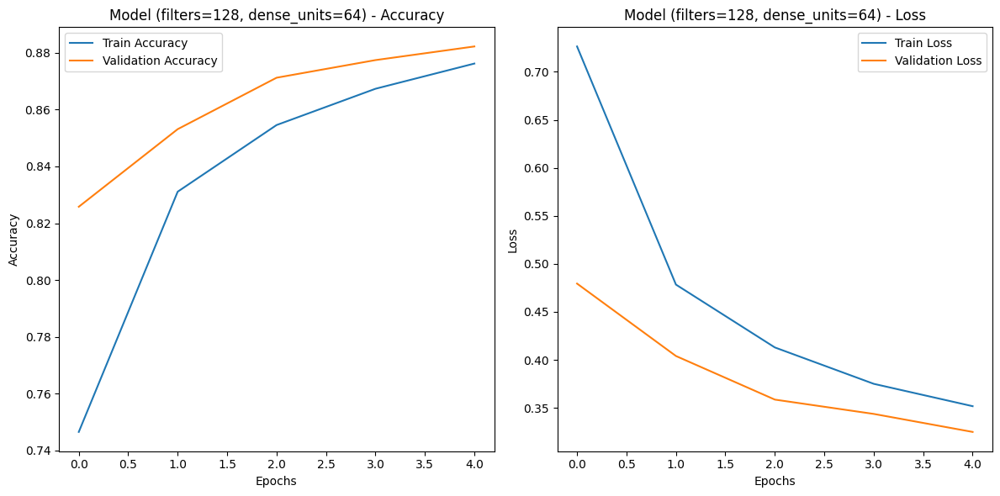

Training with filters=128, dense_units=64, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.6915 - loss: 0.8669 - val_accuracy: 0.8323 - val_loss: 0.4412
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.8117 - loss: 0.5186 - val_accuracy: 0.8394 - val_loss: 0.4536
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8145 - loss: 0.4925 - val_accuracy: 0.8446 - val_loss: 0.4390
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8146 - loss: 0.4966 - val_accuracy: 0.8483 - val_loss: 0.4308
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8198 - loss: 0.4855 - val_accuracy: 0.8533 - val_loss: 0.4054


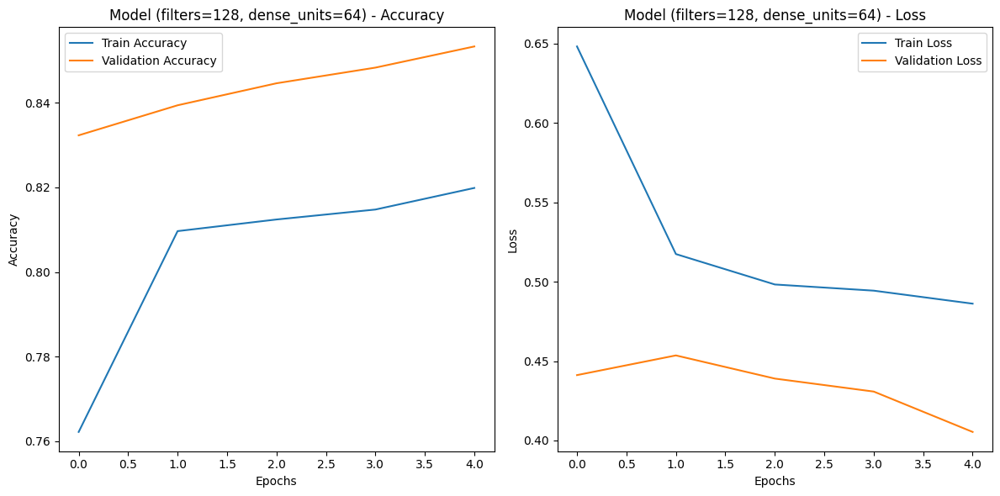

Training with filters=128, dense_units=64, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7246 - loss: 0.7620 - val_accuracy: 0.8533 - val_loss: 0.3914
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8312 - loss: 0.4588 - val_accuracy: 0.8582 - val_loss: 0.3768
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8475 - loss: 0.4126 - val_accuracy: 0.8719 - val_loss: 0.3517
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8534 - loss: 0.3925 - val_accuracy: 0.8697 - val_loss: 0.3521
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8605 - loss: 0.3741 - val_accuracy: 0.8812 - val_loss: 0.3228


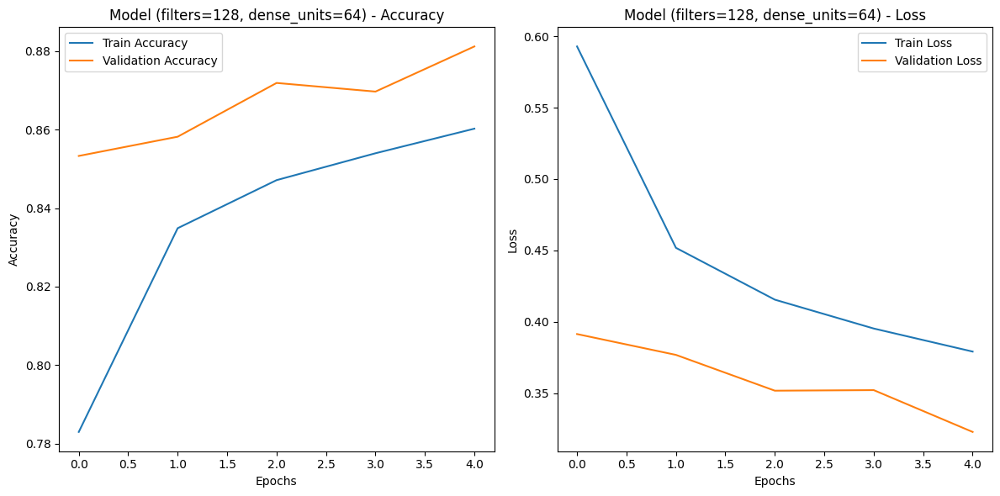

Training with filters=128, dense_units=64, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.6821 - loss: 0.8655 - val_accuracy: 0.8619 - val_loss: 0.3806
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8377 - loss: 0.4547 - val_accuracy: 0.8721 - val_loss: 0.3491
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8598 - loss: 0.3882 - val_accuracy: 0.8907 - val_loss: 0.3017
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8707 - loss: 0.3481 - val_accuracy: 0.8933 - val_loss: 0.2923
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8856 - loss: 0.3114 - val_accuracy: 0.8973 - val_loss: 0.2799


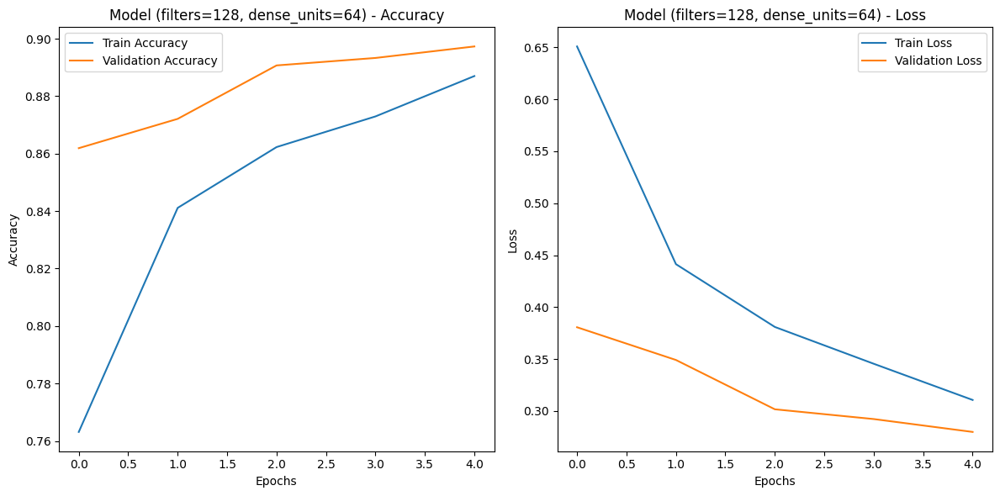

Training with filters=128, dense_units=64, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.5838 - loss: 1.1906 - val_accuracy: 0.8119 - val_loss: 0.5147
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.7761 - loss: 0.6292 - val_accuracy: 0.8419 - val_loss: 0.4449
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8088 - loss: 0.5422 - val_accuracy: 0.8574 - val_loss: 0.3904
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8297 - loss: 0.4821 - val_accuracy: 0.8738 - val_loss: 0.3642
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8470 - loss: 0.4434 - val_accuracy: 0.8781 - val_loss: 0.3442


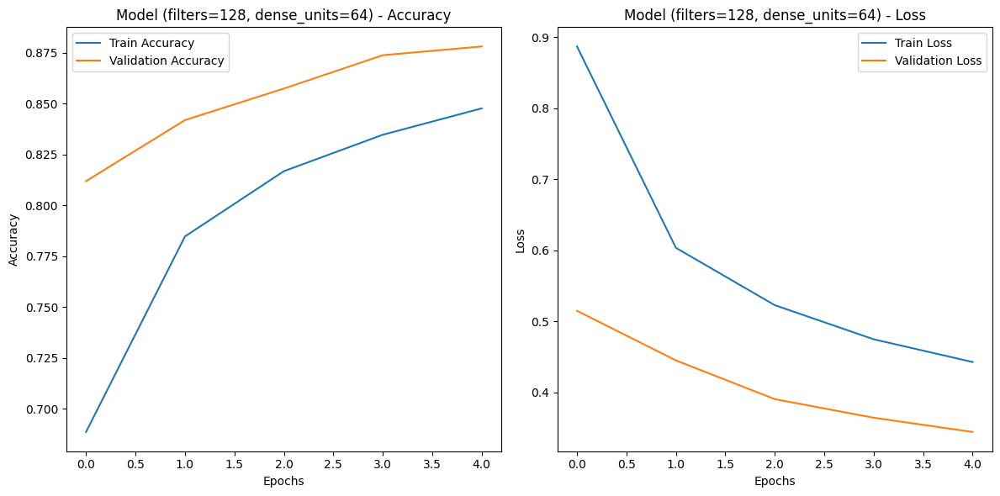

Training with filters=128, dense_units=128, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7744 - loss: 0.6506 - val_accuracy: 0.8507 - val_loss: 0.3974
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8536 - loss: 0.3930 - val_accuracy: 0.8505 - val_loss: 0.4213
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8638 - loss: 0.3653 - val_accuracy: 0.8587 - val_loss: 0.4046
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8653 - loss: 0.3535 - val_accuracy: 0.8632 - val_loss: 0.3971
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8671 - loss: 0.3535 - val_accuracy: 0.8544 - val_loss: 0.4150


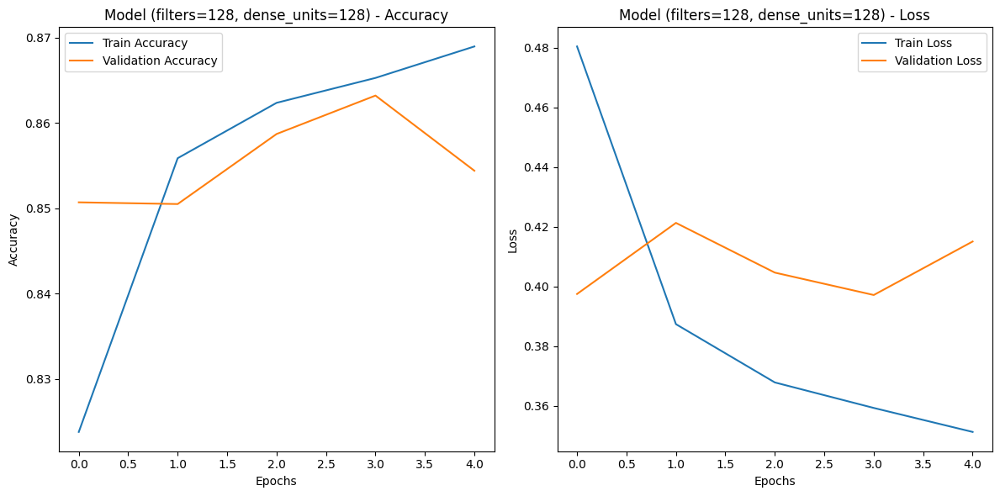

Training with filters=128, dense_units=128, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.7842 - loss: 0.5979 - val_accuracy: 0.8705 - val_loss: 0.3496
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.8812 - loss: 0.3226 - val_accuracy: 0.8810 - val_loss: 0.3227
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8911 - loss: 0.2927 - val_accuracy: 0.8842 - val_loss: 0.3344
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8979 - loss: 0.2718 - val_accuracy: 0.8854 - val_loss: 0.3258
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9045 - loss: 0.2533 - val_accuracy: 0.8888 - val_loss: 0.3163


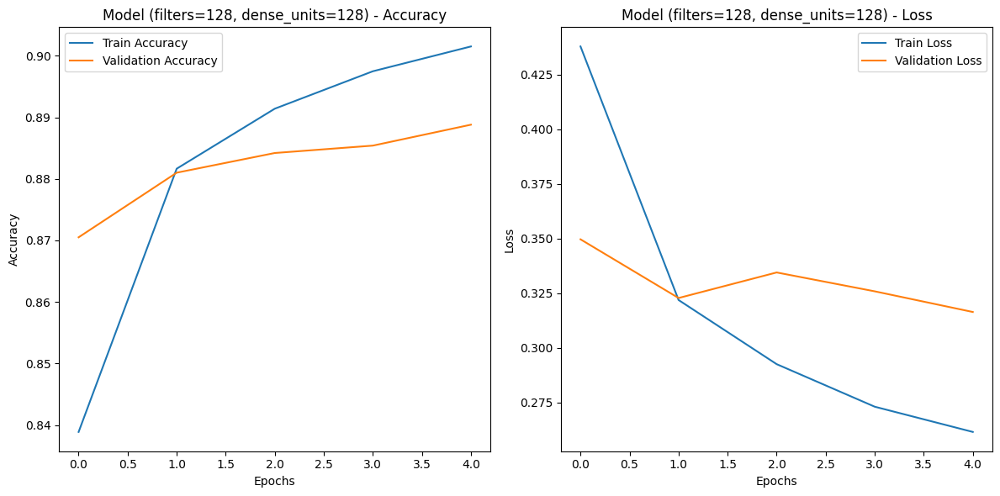

Training with filters=128, dense_units=128, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 7ms/step - accuracy: 0.7894 - loss: 0.5851 - val_accuracy: 0.8783 - val_loss: 0.3334
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8920 - loss: 0.2931 - val_accuracy: 0.8923 - val_loss: 0.2866
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9110 - loss: 0.2388 - val_accuracy: 0.9025 - val_loss: 0.2705
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9264 - loss: 0.1985 - val_accuracy: 0.9099 - val_loss: 0.2468
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9377 - loss: 0.1664 - val_accuracy: 0.9153 - val_loss: 0.2402


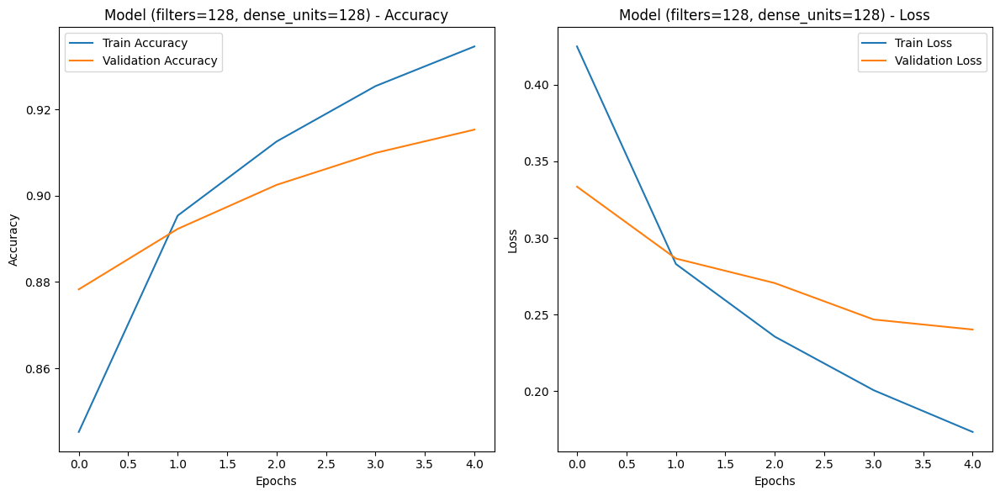

Training with filters=128, dense_units=128, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7119 - loss: 0.8202 - val_accuracy: 0.8502 - val_loss: 0.4213
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8585 - loss: 0.4002 - val_accuracy: 0.8690 - val_loss: 0.3614
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8745 - loss: 0.3442 - val_accuracy: 0.8779 - val_loss: 0.3352
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8890 - loss: 0.3070 - val_accuracy: 0.8878 - val_loss: 0.3098
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8975 - loss: 0.2836 - val_accuracy: 0.8942 - val_loss: 0.2907


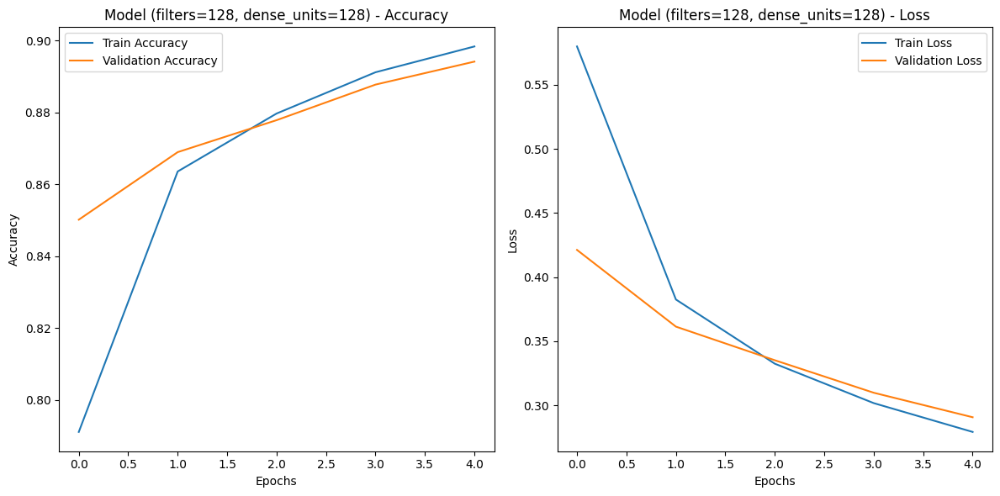

Training with filters=128, dense_units=128, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7428 - loss: 0.7464 - val_accuracy: 0.8351 - val_loss: 0.4233
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8340 - loss: 0.4429 - val_accuracy: 0.8311 - val_loss: 0.4390
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8427 - loss: 0.4214 - val_accuracy: 0.8544 - val_loss: 0.4015
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8489 - loss: 0.4044 - val_accuracy: 0.8409 - val_loss: 0.4240
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8508 - loss: 0.4027 - val_accuracy: 0.8558 - val_loss: 0.3980


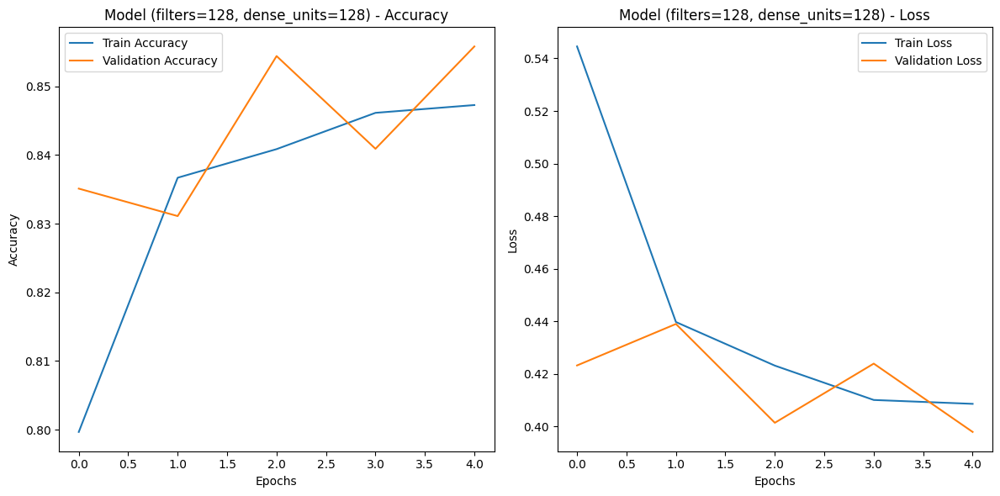

Training with filters=128, dense_units=128, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7753 - loss: 0.6219 - val_accuracy: 0.8593 - val_loss: 0.3818
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8689 - loss: 0.3524 - val_accuracy: 0.8762 - val_loss: 0.3347
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8777 - loss: 0.3184 - val_accuracy: 0.8858 - val_loss: 0.3200
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8863 - loss: 0.3007 - val_accuracy: 0.8833 - val_loss: 0.3161
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8929 - loss: 0.2839 - val_accuracy: 0.8953 - val_loss: 0.2959


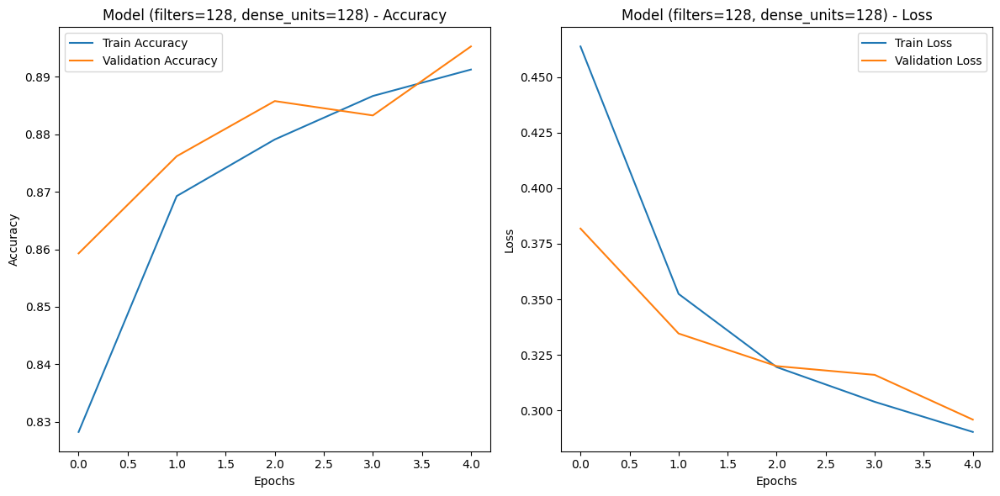

Training with filters=128, dense_units=128, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7782 - loss: 0.6093 - val_accuracy: 0.8691 - val_loss: 0.3443
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8886 - loss: 0.3077 - val_accuracy: 0.8965 - val_loss: 0.2787
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9054 - loss: 0.2524 - val_accuracy: 0.8969 - val_loss: 0.2690
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.9184 - loss: 0.2202 - val_accuracy: 0.9077 - val_loss: 0.2605
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9284 - loss: 0.1916 - val_accuracy: 0.9073 - val_loss: 0.2619


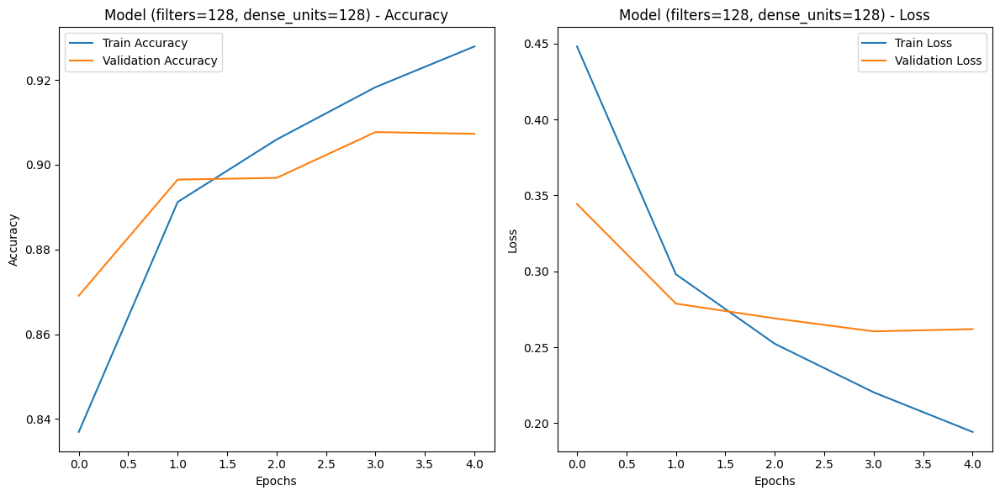

Training with filters=128, dense_units=128, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.6938 - loss: 0.8918 - val_accuracy: 0.8421 - val_loss: 0.4374
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8457 - loss: 0.4327 - val_accuracy: 0.8610 - val_loss: 0.3787
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8700 - loss: 0.3653 - val_accuracy: 0.8772 - val_loss: 0.3368
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8775 - loss: 0.3354 - val_accuracy: 0.8850 - val_loss: 0.3196
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8882 - loss: 0.3113 - val_accuracy: 0.8895 - val_loss: 0.3000


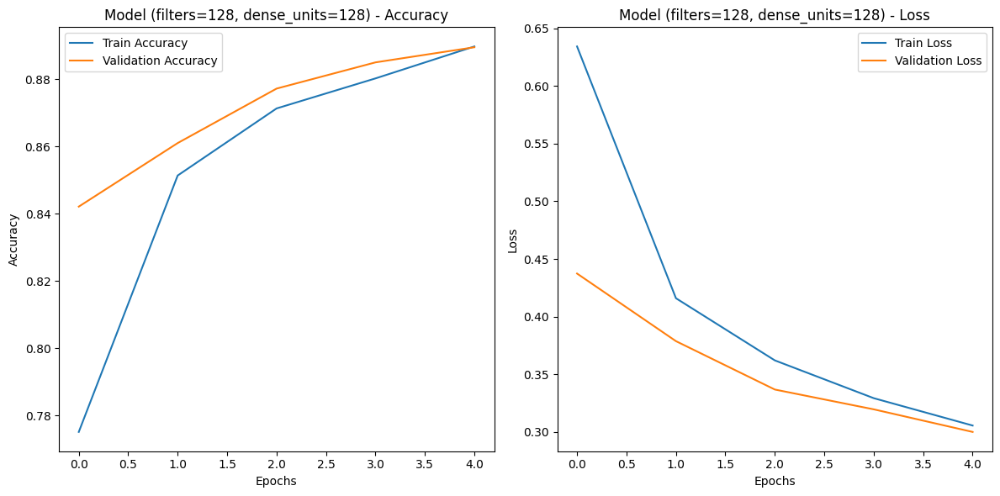

Training with filters=128, dense_units=128, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.7418 - loss: 0.7261 - val_accuracy: 0.8422 - val_loss: 0.4182
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8298 - loss: 0.4582 - val_accuracy: 0.8296 - val_loss: 0.4505
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8390 - loss: 0.4383 - val_accuracy: 0.8507 - val_loss: 0.4112
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8381 - loss: 0.4406 - val_accuracy: 0.8558 - val_loss: 0.4035
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8401 - loss: 0.4319 - val_accuracy: 0.8526 - val_loss: 0.4080


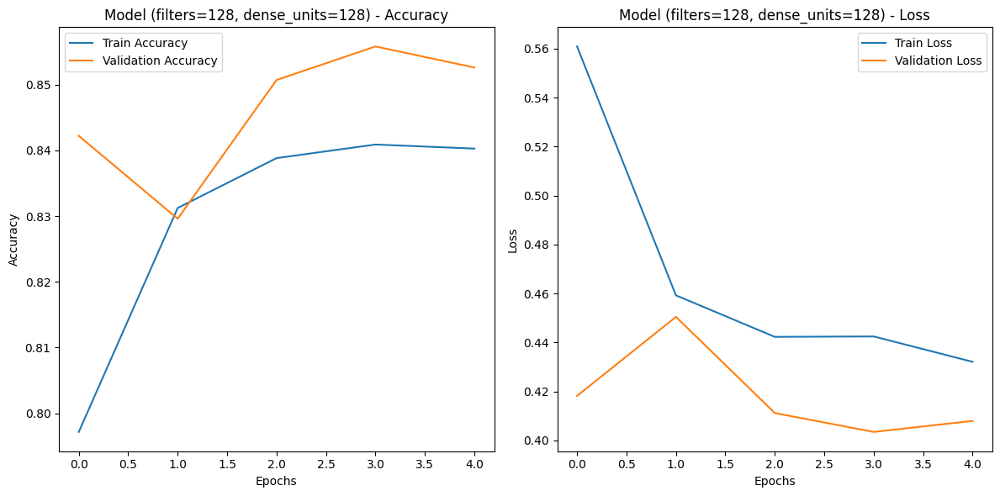

Training with filters=128, dense_units=128, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7530 - loss: 0.6816 - val_accuracy: 0.8380 - val_loss: 0.4291
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8548 - loss: 0.4022 - val_accuracy: 0.8646 - val_loss: 0.3526
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8666 - loss: 0.3604 - val_accuracy: 0.8725 - val_loss: 0.3337
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8677 - loss: 0.3519 - val_accuracy: 0.8838 - val_loss: 0.3300
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8732 - loss: 0.3336 - val_accuracy: 0.8779 - val_loss: 0.3365


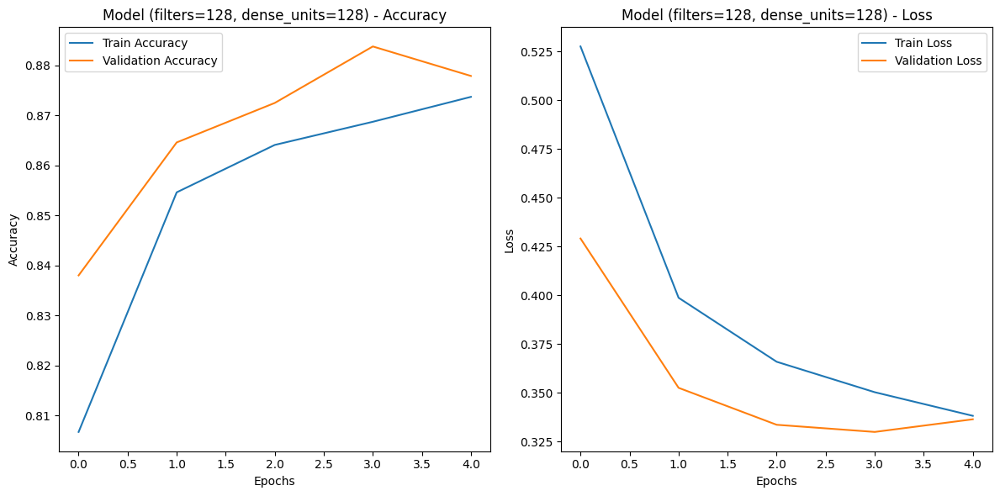

Training with filters=128, dense_units=128, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7531 - loss: 0.6877 - val_accuracy: 0.8665 - val_loss: 0.3539
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8720 - loss: 0.3561 - val_accuracy: 0.8827 - val_loss: 0.3133
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8905 - loss: 0.3002 - val_accuracy: 0.9051 - val_loss: 0.2680
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9042 - loss: 0.2627 - val_accuracy: 0.9061 - val_loss: 0.2581
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9115 - loss: 0.2388 - val_accuracy: 0.9034 - val_loss: 0.2733


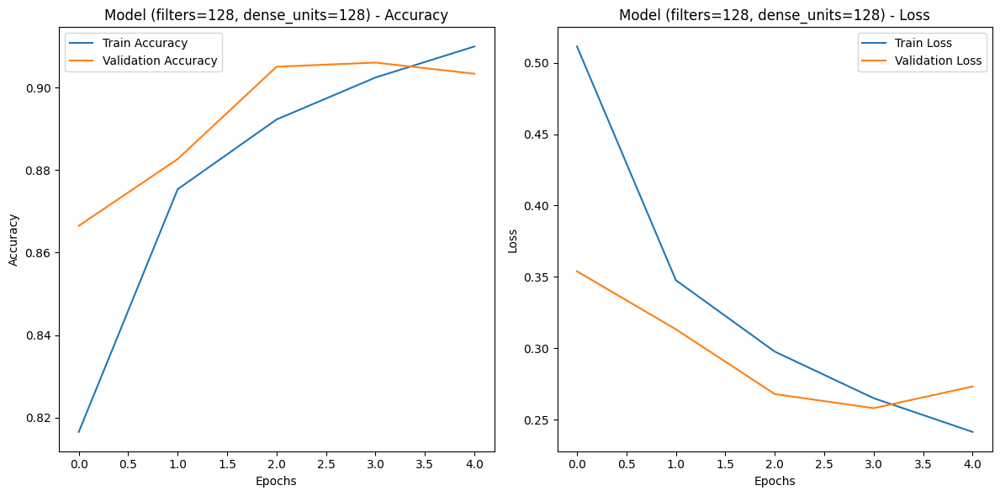

Training with filters=128, dense_units=128, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.6665 - loss: 0.9716 - val_accuracy: 0.8348 - val_loss: 0.4630
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8307 - loss: 0.4830 - val_accuracy: 0.8593 - val_loss: 0.3892
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8550 - loss: 0.4118 - val_accuracy: 0.8748 - val_loss: 0.3486
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8704 - loss: 0.3682 - val_accuracy: 0.8813 - val_loss: 0.3317
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8786 - loss: 0.3425 - val_accuracy: 0.8834 - val_loss: 0.3191


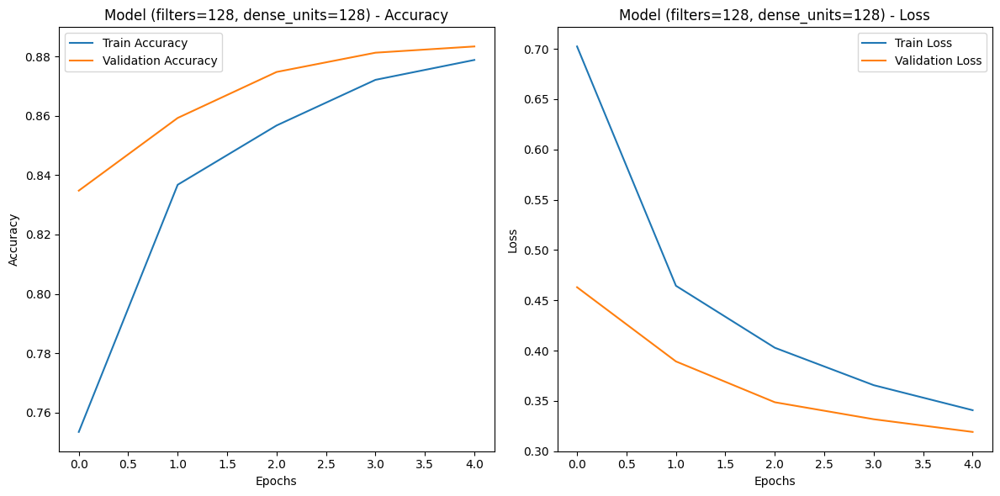

Training with filters=128, dense_units=256, dropout_rate=0.1, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7658 - loss: 0.6831 - val_accuracy: 0.8422 - val_loss: 0.4252
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.8567 - loss: 0.3824 - val_accuracy: 0.8532 - val_loss: 0.4121
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8702 - loss: 0.3590 - val_accuracy: 0.8601 - val_loss: 0.4040
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8676 - loss: 0.3556 - val_accuracy: 0.8628 - val_loss: 0.3795
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8698 - loss: 0.3513 - val_accuracy: 0.8526 - val_loss: 0.4018


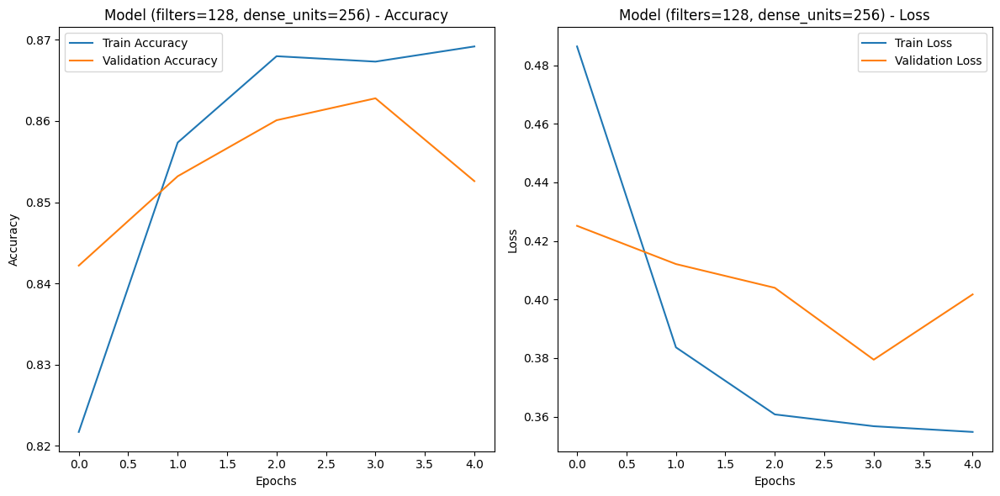

Training with filters=128, dense_units=256, dropout_rate=0.1, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7880 - loss: 0.6010 - val_accuracy: 0.8767 - val_loss: 0.3387
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.8810 - loss: 0.3195 - val_accuracy: 0.8745 - val_loss: 0.3380
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8930 - loss: 0.2870 - val_accuracy: 0.8816 - val_loss: 0.3230
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9002 - loss: 0.2608 - val_accuracy: 0.8904 - val_loss: 0.3198
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.9077 - loss: 0.2423 - val_accuracy: 0.8752 - val_loss: 0.3554


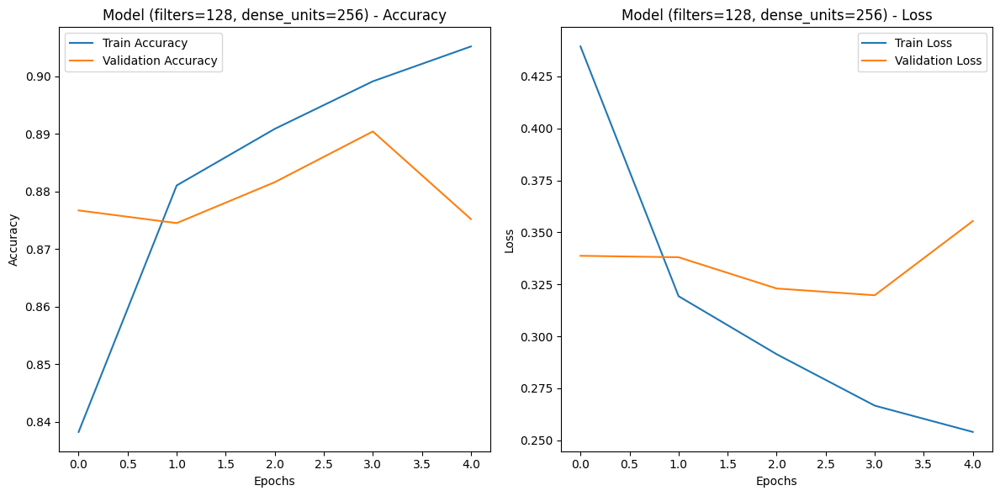

Training with filters=128, dense_units=256, dropout_rate=0.1, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.8042 - loss: 0.5406 - val_accuracy: 0.8798 - val_loss: 0.3190
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8996 - loss: 0.2692 - val_accuracy: 0.8898 - val_loss: 0.3005
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9197 - loss: 0.2171 - val_accuracy: 0.9076 - val_loss: 0.2431
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9322 - loss: 0.1799 - val_accuracy: 0.9098 - val_loss: 0.2565
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9409 - loss: 0.1550 - val_accuracy: 0.9115 - val_loss: 0.2531


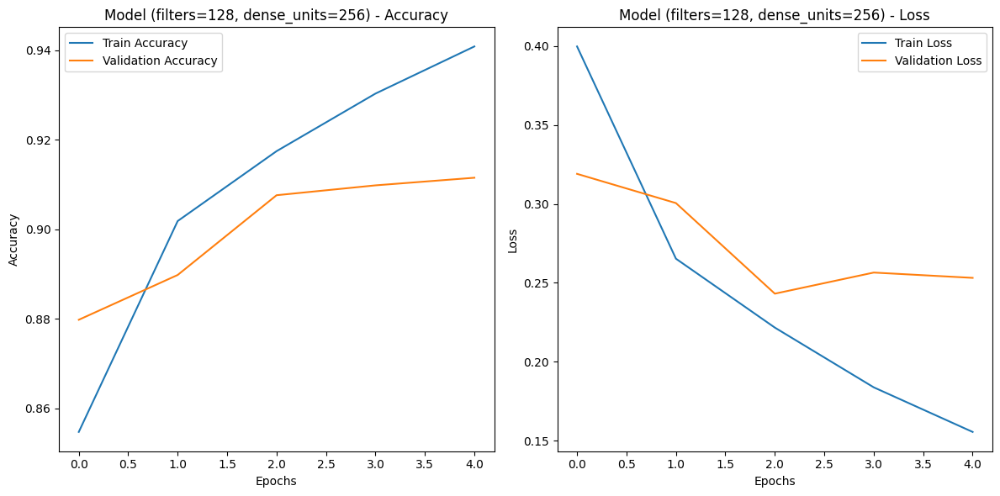

Training with filters=128, dense_units=256, dropout_rate=0.1, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7295 - loss: 0.7796 - val_accuracy: 0.8563 - val_loss: 0.4010
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.8648 - loss: 0.3737 - val_accuracy: 0.8766 - val_loss: 0.3458
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8893 - loss: 0.3118 - val_accuracy: 0.8832 - val_loss: 0.3176
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8955 - loss: 0.2858 - val_accuracy: 0.8860 - val_loss: 0.3070
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.9044 - loss: 0.2591 - val_accuracy: 0.8980 - val_loss: 0.2813


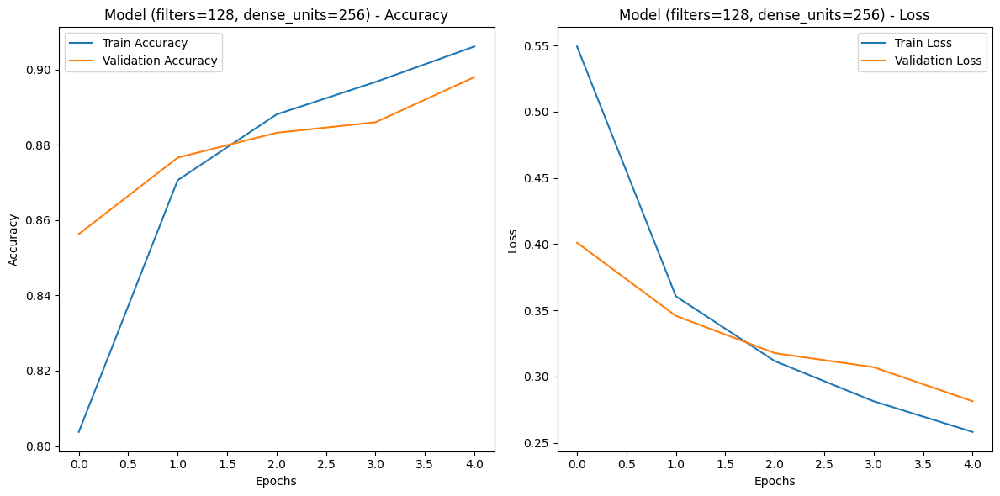

Training with filters=128, dense_units=256, dropout_rate=0.3, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7656 - loss: 0.6736 - val_accuracy: 0.8271 - val_loss: 0.4384
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8484 - loss: 0.4091 - val_accuracy: 0.8529 - val_loss: 0.3967
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8518 - loss: 0.3924 - val_accuracy: 0.8522 - val_loss: 0.4078
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8519 - loss: 0.3977 - val_accuracy: 0.8544 - val_loss: 0.4022
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8580 - loss: 0.3868 - val_accuracy: 0.8472 - val_loss: 0.4098


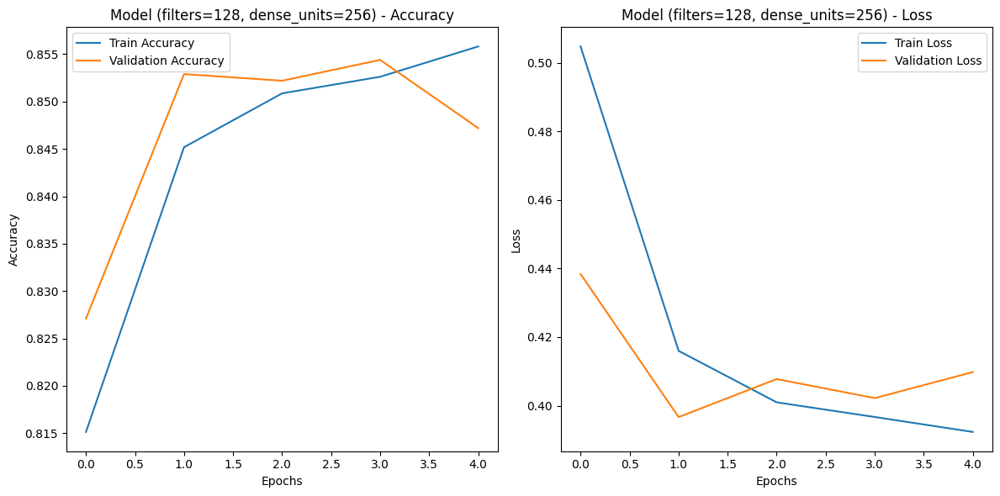

Training with filters=128, dense_units=256, dropout_rate=0.3, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.7764 - loss: 0.6270 - val_accuracy: 0.8634 - val_loss: 0.3732
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.8671 - loss: 0.3543 - val_accuracy: 0.8774 - val_loss: 0.3434
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8810 - loss: 0.3179 - val_accuracy: 0.8752 - val_loss: 0.3318
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8844 - loss: 0.3050 - val_accuracy: 0.8813 - val_loss: 0.3334
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8910 - loss: 0.2902 - val_accuracy: 0.8753 - val_loss: 0.3504


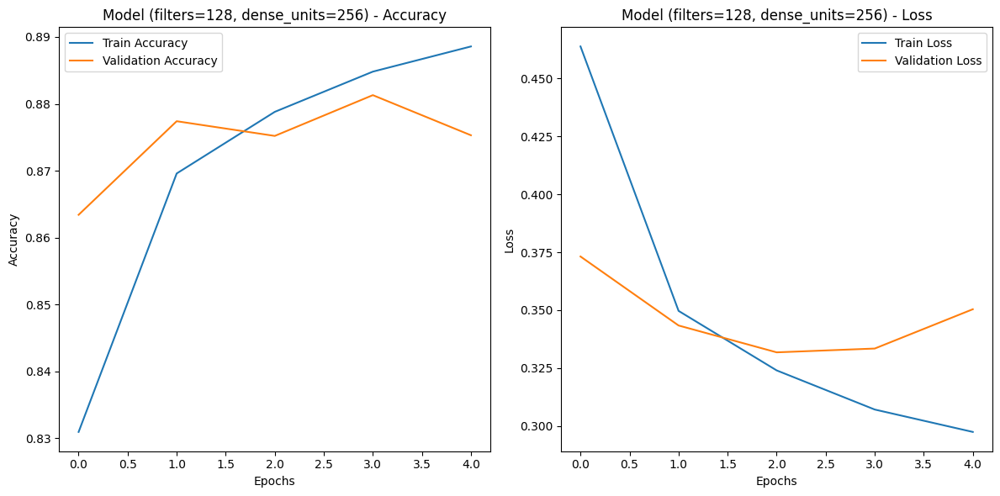

Training with filters=128, dense_units=256, dropout_rate=0.3, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7941 - loss: 0.5746 - val_accuracy: 0.8854 - val_loss: 0.3233
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 6ms/step - accuracy: 0.8951 - loss: 0.2900 - val_accuracy: 0.8866 - val_loss: 0.3008
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.9106 - loss: 0.2406 - val_accuracy: 0.9030 - val_loss: 0.2645
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9223 - loss: 0.2021 - val_accuracy: 0.9019 - val_loss: 0.2645
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.9342 - loss: 0.1774 - val_accuracy: 0.9130 - val_loss: 0.2507


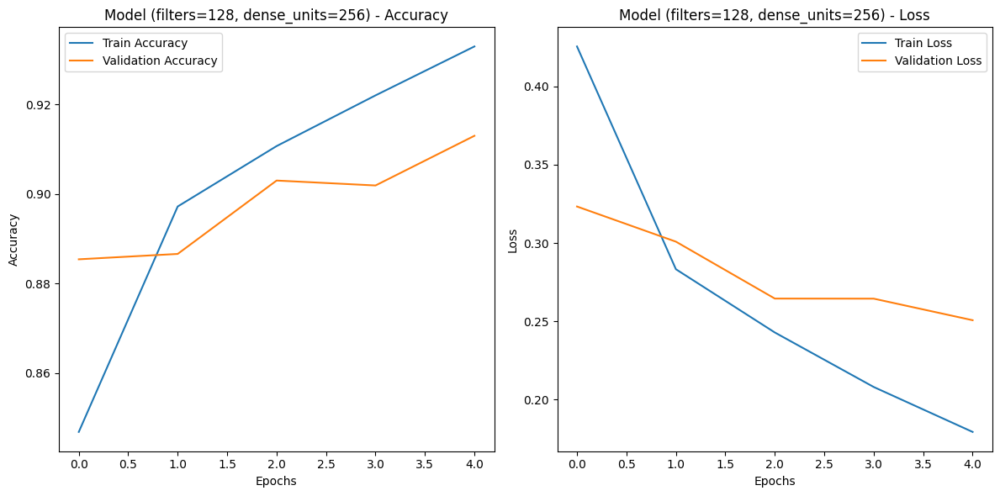

Training with filters=128, dense_units=256, dropout_rate=0.3, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7081 - loss: 0.8277 - val_accuracy: 0.8417 - val_loss: 0.4290
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8551 - loss: 0.3965 - val_accuracy: 0.8684 - val_loss: 0.3609
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.8751 - loss: 0.3473 - val_accuracy: 0.8689 - val_loss: 0.3444
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8893 - loss: 0.3026 - val_accuracy: 0.8924 - val_loss: 0.2990
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8953 - loss: 0.2843 - val_accuracy: 0.8930 - val_loss: 0.2935


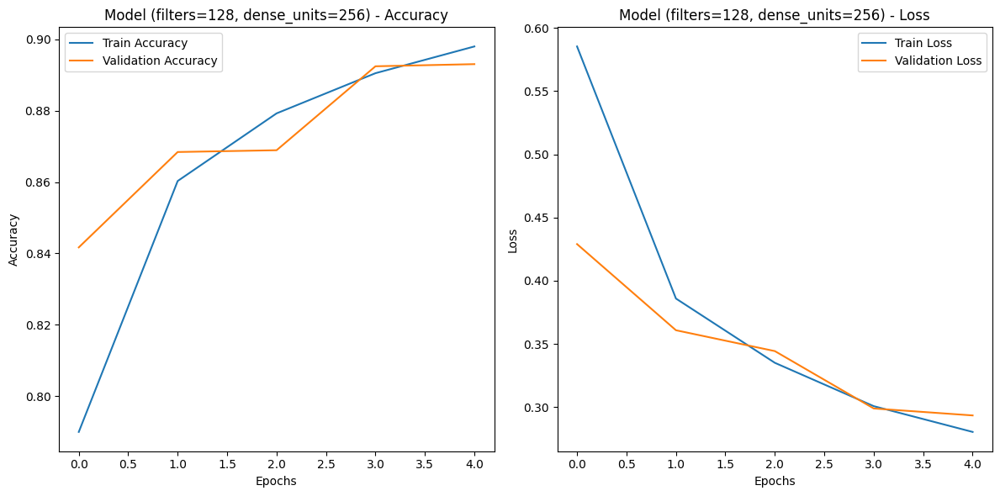

Training with filters=128, dense_units=256, dropout_rate=0.5, learning_rate=0.01


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7235 - loss: 0.7953 - val_accuracy: 0.8195 - val_loss: 0.4821
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - accuracy: 0.8209 - loss: 0.4869 - val_accuracy: 0.8245 - val_loss: 0.4586
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8313 - loss: 0.4617 - val_accuracy: 0.8410 - val_loss: 0.4336
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8289 - loss: 0.4584 - val_accuracy: 0.8452 - val_loss: 0.4350
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8362 - loss: 0.4429 - val_accuracy: 0.8289 - val_loss: 0.4748


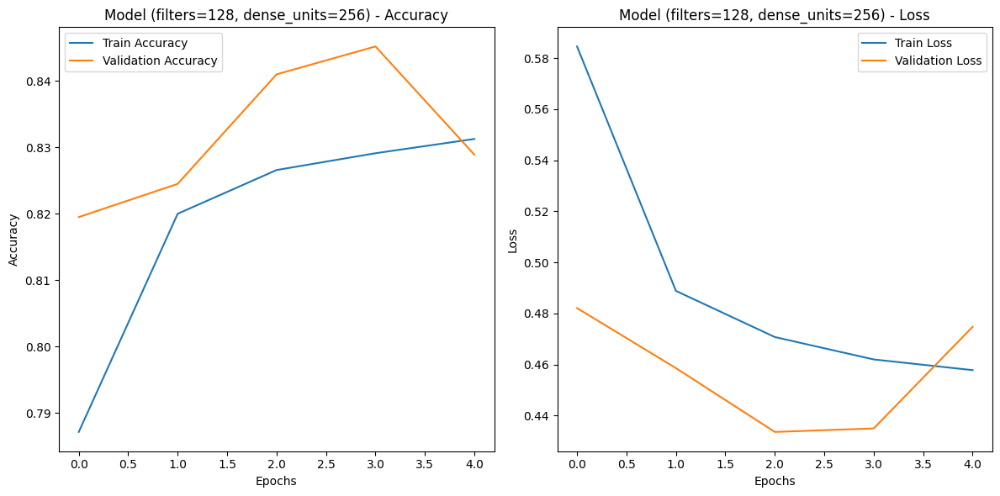

Training with filters=128, dense_units=256, dropout_rate=0.5, learning_rate=0.005


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.7709 - loss: 0.6572 - val_accuracy: 0.8678 - val_loss: 0.3688
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.8607 - loss: 0.3757 - val_accuracy: 0.8689 - val_loss: 0.3617
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8693 - loss: 0.3529 - val_accuracy: 0.8787 - val_loss: 0.3474
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8766 - loss: 0.3324 - val_accuracy: 0.8847 - val_loss: 0.3133
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8810 - loss: 0.3238 - val_accuracy: 0.8798 - val_loss: 0.3359


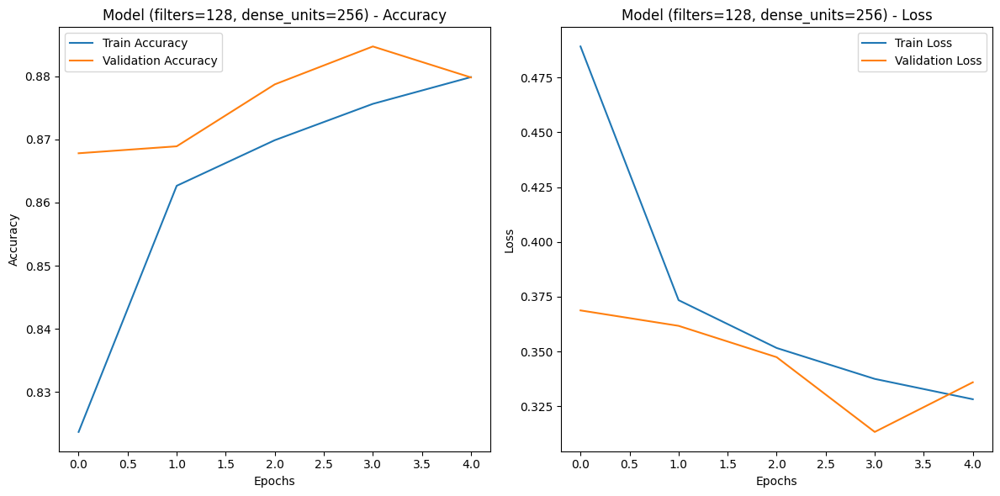

Training with filters=128, dense_units=256, dropout_rate=0.5, learning_rate=0.001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 7ms/step - accuracy: 0.7710 - loss: 0.6324 - val_accuracy: 0.8764 - val_loss: 0.3320
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.8793 - loss: 0.3238 - val_accuracy: 0.8926 - val_loss: 0.2864
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8988 - loss: 0.2673 - val_accuracy: 0.8999 - val_loss: 0.2712
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9138 - loss: 0.2320 - val_accuracy: 0.9117 - val_loss: 0.2441
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9226 - loss: 0.2085 - val_accuracy: 0.9111 - val_loss: 0.2502


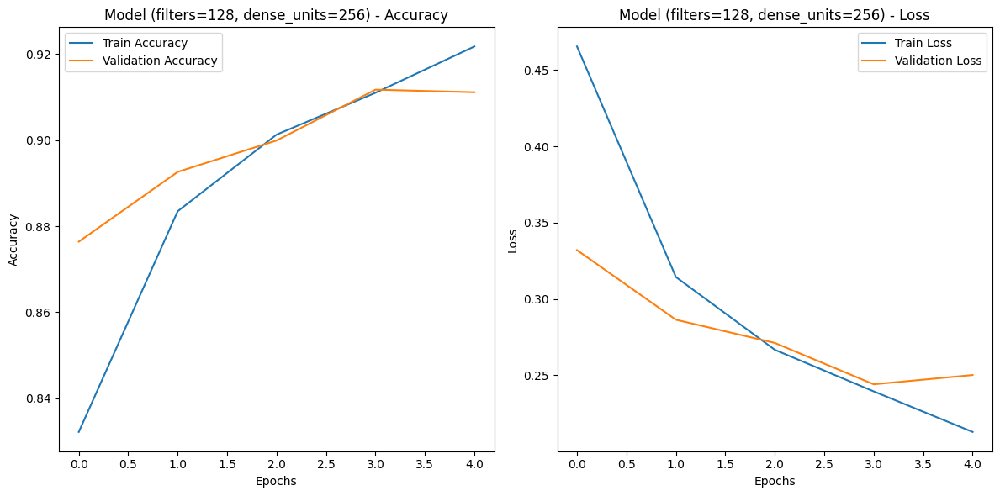

Training with filters=128, dense_units=256, dropout_rate=0.5, learning_rate=0.0001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 7ms/step - accuracy: 0.6876 - loss: 0.9118 - val_accuracy: 0.8430 - val_loss: 0.4327
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - accuracy: 0.8446 - loss: 0.4360 - val_accuracy: 0.8682 - val_loss: 0.3647
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 6ms/step - accuracy: 0.8648 - loss: 0.3773 - val_accuracy: 0.8781 - val_loss: 0.3357
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8791 - loss: 0.3349 - val_accuracy: 0.8893 - val_loss: 0.3088
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - accuracy: 0.8888 - loss: 0.3079 - val_accuracy: 0.8898 - val_loss: 0.3007


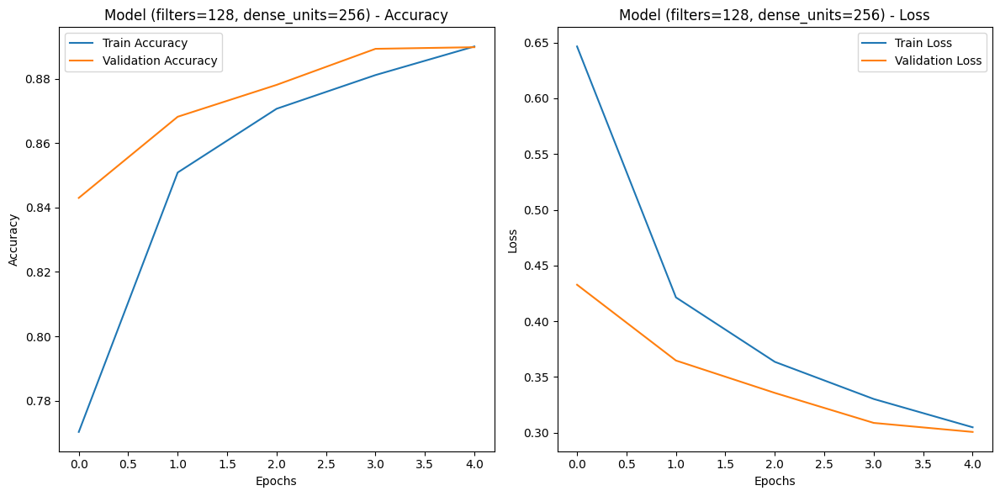

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


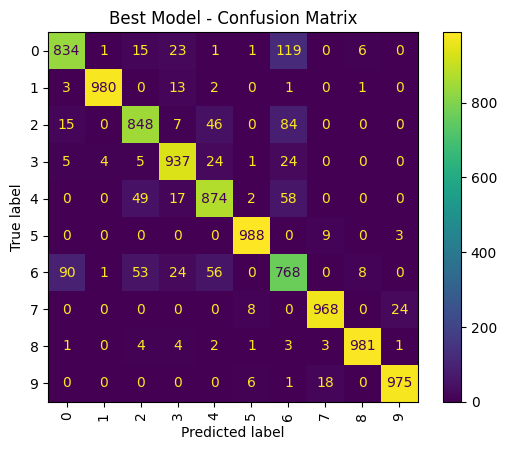

              precision    recall  f1-score   support

           0       0.88      0.83      0.86      1000
           1       0.99      0.98      0.99      1000
           2       0.87      0.85      0.86      1000
           3       0.91      0.94      0.93      1000
           4       0.87      0.87      0.87      1000
           5       0.98      0.99      0.98      1000
           6       0.73      0.77      0.75      1000
           7       0.97      0.97      0.97      1000
           8       0.98      0.98      0.98      1000
           9       0.97      0.97      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



In [ ]:
# Grid search for hyperparameters
param_grid = {
    'filters': [32, 64, 128],
    'dense_units': [64, 128, 256],
    'dropout_rate': [0.1, 0.3, 0.5],
    'learning_rate': [0.01, 0.005, 0.001, 0.0001]
}

best_model = None
best_accuracy = 0
for filters in param_grid['filters']:
    for dense_units in param_grid['dense_units']:
        for dropout_rate in param_grid['dropout_rate']:
            for learning_rate in param_grid['learning_rate']:
                print(f"Training with filters={filters}, dense_units={dense_units}, "
                      f"dropout_rate={dropout_rate}, learning_rate={learning_rate}")

                model = create_model(filters, dense_units, dropout_rate, learning_rate)
                history = model.fit(x_train, y_train, epochs=5, validation_data=(x_test, y_test), verbose=1)

                _, val_acc = model.evaluate(x_test, y_test, verbose=0)
                if val_acc > best_accuracy:
                    best_accuracy = val_acc
                    best_model = model

                # Plot learning curves
                plot_learning_curves(history, f'Model (filters={filters}, dense_units={dense_units})')

# Evaluate the best model
y_pred = np.argmax(best_model.predict(x_test), axis=1)
display_confusion_matrix(y_test, y_pred, 'Best Model')
print(classification_report(y_test, y_pred))



Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 40s 19ms/step - accuracy: 0.5339 - loss: 1.2599 - val_accuracy: 0.7636 - val_loss: 0.6145
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 19ms/step - accuracy: 0.6986 - loss: 0.8034 - val_accuracy: 0.7966 - val_loss: 0.5351
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 18ms/step - accuracy: 0.7324 - loss: 0.7190 - val_accuracy: 0.8031 - val_loss: 0.5404
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 19ms/step - accuracy: 0.7568 - loss: 0.6592 - val_accuracy: 0.8028 - val_loss: 0.5259
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 19ms/step - accuracy: 0.7734 - loss: 0.6224 - val_accuracy: 0.8354 - val_loss: 0.4540
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 19ms/step - accuracy: 0.7785 - loss: 0.6041 - val_accuracy: 0.8015 - val_loss: 0.6057
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 40s 18ms/step - accuracy: 0.7874 - loss: 0.5829 - val_accuracy: 0.8346 - val_loss: 0.4616
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 42s 18ms/step - accuracy: 0.7930 - loss: 0.56

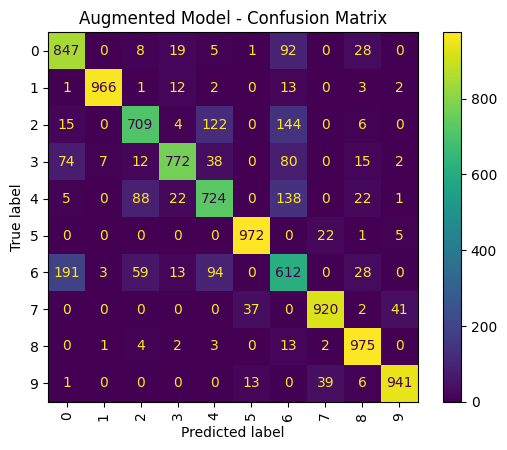

              precision    recall  f1-score   support

           0       0.75      0.85      0.79      1000
           1       0.99      0.97      0.98      1000
           2       0.80      0.71      0.75      1000
           3       0.91      0.77      0.84      1000
           4       0.73      0.72      0.73      1000
           5       0.95      0.97      0.96      1000
           6       0.56      0.61      0.59      1000
           7       0.94      0.92      0.93      1000
           8       0.90      0.97      0.93      1000
           9       0.95      0.94      0.94      1000

    accuracy                           0.84     10000
   macro avg       0.85      0.84      0.84     10000
weighted avg       0.85      0.84      0.84     10000



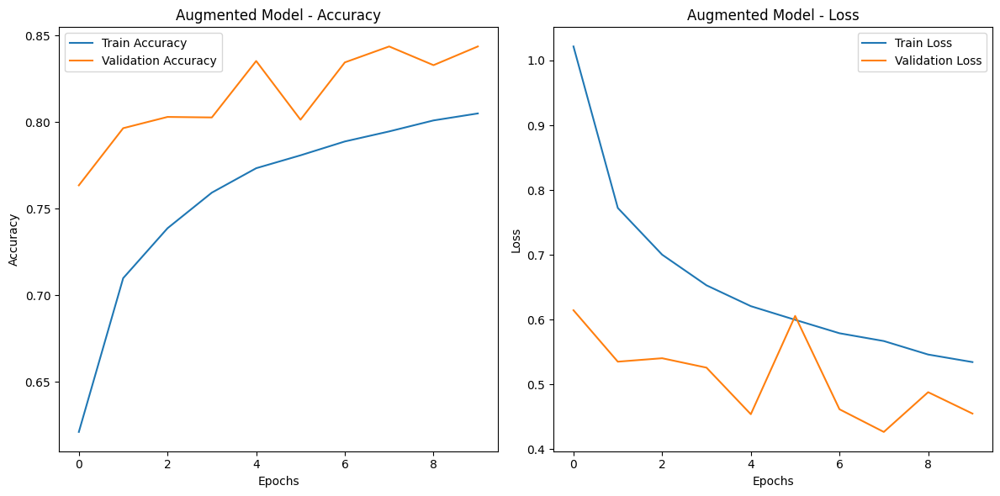

In [ ]:
# Data augmentation for a separate model
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
datagen.fit(x_train)

# Model with data augmentation
augmented_model = create_model(filters=64, dense_units=128, dropout_rate=0.5, learning_rate=0.001)
history_aug = augmented_model.fit(datagen.flow(x_train, y_train, batch_size=32),
                                  epochs=10, validation_data=(x_test, y_test), verbose=1)

# Evaluate augmented model
y_pred_aug = np.argmax(augmented_model.predict(x_test), axis=1)
display_confusion_matrix(y_test, y_pred_aug, 'Augmented Model')
print(classification_report(y_test, y_pred_aug))
plot_learning_curves(history_aug, 'Augmented Model')
